In [1522]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

import datetime

%matplotlib inline

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# PART 1: Ready FY 2017 Year-to-Date Budget Report

In [1523]:
ytd_2017 = pd.read_excel('./data/FY17 YTD BUD REPORT AS OF PER 13 Notes.xlsx')

In [1524]:
ytd_2017.head()

,FUND,DEPARTMENT,ORG,OBJ,PROJECT,ACCOUNT,ACCOUNT DESCRIPTION,TYPE,ROLLUP,ORIGINAL APPROP,REVISED BUDGET,YTD ACTUAL,MTD ACTUAL,ENCUMBRANCE/REQ,AVAILABLE BUDGET,% USED,Unnamed: 16
0,1.00,1.00,1001.00,412000.00,nan,01 -000-001-000-00-00-412000-,REAL ESTATE/PERSONAL PROP. TAX,R,nan,0.00,-79260447.00,-78230114.79,0.00,0.00,-1030332.21,98.70,NaN
1,1.00,1.00,1001.00,412900.00,nan,01 -000-001-000-00-00-412900-,TAX LIENS REDEMED,R,nan,0.00,-120000.00,-2274359.42,0.00,0.00,2154359.42,1895.30,NaN
2,1.00,1.00,1001.00,414240.00,nan,01 -000-001-000-00-00-414240-,40U LIEN REVENUE REDEMED,R,nan,0.00,0.00,-494192.19,0.00,0.00,494192.19,100.00,NaN
3,1.00,1.00,1001.00,415000.00,nan,01 -000-001-000-00-00-415000-,MOTOR VEHICLE EXCISE,R,nan,0.00,-5178000.00,-5350844.54,0.00,0.00,172844.54,103.30,NaN
4,1.00,1.00,1001.00,417000.00,nan,01 -000-001-000-00-00-417000-,PENALTIES & INTEREST ON TAXES,R,nan,0.00,-500000.00,-641505.16,0.00,0.00,141505.16,128.30,NaN


In [1525]:
ytd_2017.columns

Index(['FUND', 'DEPARTMENT', 'ORG', 'OBJ', 'PROJECT', 'ACCOUNT',
       'ACCOUNT DESCRIPTION', 'TYPE', 'ROLLUP', 'ORIGINAL APPROP',
       'REVISED BUDGET', 'YTD ACTUAL', 'MTD ACTUAL', 'ENCUMBRANCE/REQ',
       'AVAILABLE BUDGET', '% USED', 'Unnamed: 16'],
      dtype='object')

In [1526]:
ytd_2017.dtypes

FUND                   float64
DEPARTMENT             float64
ORG                    float64
OBJ                    float64
PROJECT                float64
ACCOUNT                 object
ACCOUNT DESCRIPTION     object
TYPE                    object
ROLLUP                 float64
ORIGINAL APPROP        float64
REVISED BUDGET         float64
YTD ACTUAL             float64
MTD ACTUAL             float64
ENCUMBRANCE/REQ        float64
AVAILABLE BUDGET       float64
% USED                 float64
Unnamed: 16             object
dtype: object

In [1527]:
# Check all accounts that are listed to have a total budget approved.
total_account_desc = ytd_2017[ytd_2017['ACCOUNT DESCRIPTION'].str.contains('Total')]

In [1528]:
total_account_desc

,FUND,DEPARTMENT,ORG,OBJ,PROJECT,ACCOUNT,ACCOUNT DESCRIPTION,TYPE,ROLLUP,ORIGINAL APPROP,REVISED BUDGET,YTD ACTUAL,MTD ACTUAL,ENCUMBRANCE/REQ,AVAILABLE BUDGET,% USED,Unnamed: 16
43,nan,1.00,nan,nan,nan,NaN,Total 001 REVENUES,NaN,nan,0.00,-168267286.00,-170798560.75,-220992.00,0.00,2531274.75,101.50,*
47,nan,111.00,nan,nan,nan,NaN,Total 111 CITY COUNCIL,NaN,nan,327486.00,329002.79,328973.63,0.00,0.00,29.16,100.00,*
55,nan,121.00,nan,nan,nan,NaN,Total 121 MAYOR,NaN,nan,548917.00,1255788.29,1116289.83,0.00,133388.08,6110.38,99.50,*
60,nan,122.00,nan,nan,nan,NaN,Total 122 NORTHEAST REGIONAL VOCATI,NaN,nan,1912211.00,1912211.00,1858112.04,0.00,0.00,54098.96,97.20,*
71,nan,125.00,nan,nan,nan,NaN,Total 125 HUMAN RESOURCES,NaN,nan,19619754.00,19429754.00,19339233.56,0.00,0.00,90520.44,99.50,*
74,nan,127.00,nan,nan,nan,NaN,Total 127 OFF INNOVATION & DATA MGT,NaN,nan,78965.00,78965.00,73596.27,0.00,0.00,5368.73,93.20,*
85,nan,135.00,nan,nan,nan,NaN,Total 135 AUDITING DEPARTMENT,NaN,nan,1453158.00,1559511.40,1445199.61,0.00,10597.20,103714.59,93.30,*
92,nan,138.00,nan,nan,nan,NaN,Total 138 PURCHASING DEPARTMENT,NaN,nan,252129.00,260693.75,239893.02,0.00,8564.75,12235.98,95.30,*
102,nan,140.00,nan,nan,nan,NaN,Total 140 INFORMATION TECHNOLOGY,NaN,nan,1043463.00,1051608.00,994458.26,0.00,8145.00,49004.74,95.30,*
113,nan,141.00,nan,nan,nan,NaN,Total 141 ASSESSORS,NaN,nan,355273.00,364788.10,359752.52,0.00,975.10,4060.48,98.90,*


In [1529]:
# Find amount of accounts that are listed to have a total budget approved.
unique_accounts_desc_total_from_ytd = list(total_account_desc['ACCOUNT DESCRIPTION'].unique())
len(unique_accounts_desc_total_from_ytd)

609

In [1530]:
total_budget_df = total_account_desc.drop_duplicates(subset='ACCOUNT DESCRIPTION', keep='first')
total_budget = total_budget_df['REVISED BUDGET'].sum()
total_budget

# Value does not match City of Revere FY 2017 PROPOSED BUDGET Report

500270810.98

In [1531]:
# Check if any accounts listed are 'Transfers', which 'double-dip'.
total_account_transfer = ytd_2017[ytd_2017['ACCOUNT DESCRIPTION'].str.contains('Transfer')]
total_account_transfer

,FUND,DEPARTMENT,ORG,OBJ,PROJECT,ACCOUNT,ACCOUNT DESCRIPTION,TYPE,ROLLUP,ORIGINAL APPROP,REVISED BUDGET,YTD ACTUAL,MTD ACTUAL,ENCUMBRANCE/REQ,AVAILABLE BUDGET,% USED,Unnamed: 16


## Find Total School Budget from Different Line Items

### School Department Budget looks to be approximately 1/3 of total city budget per FY 2017 Proposed Budget Report. Check sub-account numbers budgets to find approximate total School Department budget.

In [1532]:
mask = (total_account_desc['ACCOUNT DESCRIPTION'] == 'Total 300 SCHOOL DEPARTMENT')
total_300_school_budget = total_account_desc[mask]['REVISED BUDGET'].iloc[0]
total_300_school_budget

19170773.71

In [1533]:
mask = (total_account_desc['ACCOUNT DESCRIPTION'] == 'Total 310 1000 SERIES ADMINISTRATIV')
total_310_1000_series_school_admin = total_account_desc[mask]['REVISED BUDGET'].iloc[0]
total_310_1000_series_school_admin

2699111.92

In [1534]:
mask = (total_account_desc['ACCOUNT DESCRIPTION'] == 'Total 320 2000 SERIES INSTRUCTIONAL')
total_320_2000_series_school_instructional = total_account_desc[mask]['REVISED BUDGET'].iloc[0]
total_320_2000_series_school_instructional

32728218.54

In [1535]:
mask = (total_account_desc['ACCOUNT DESCRIPTION'] == 'Total 330 3000 SERIES OTHER SCHOOL')
total_330_3000_series_school_other = total_account_desc[mask]['REVISED BUDGET'].iloc[0]
total_330_3000_series_school_other

7143441.18

In [1536]:
mask = (total_account_desc['ACCOUNT DESCRIPTION'] == 'Total 340 4000 SERIES CUSTODIAL')
total_340_4000_series_school_custodial = total_account_desc[mask]['REVISED BUDGET'].iloc[0]
total_340_4000_series_school_custodial

8036122.47

In [1537]:
mask = (total_account_desc['ACCOUNT DESCRIPTION'] == 'Total 390 9000 SERIES SPECIAL EDUCA')
total_390_4000_series_school_sped = total_account_desc[mask]['REVISED BUDGET'].iloc[0]
total_390_4000_series_school_sped

16099071.75

In [1538]:
total_school_budget = total_300_school_budget + total_310_1000_series_school_admin + total_320_2000_series_school_instructional + total_330_3000_series_school_other + total_340_4000_series_school_custodial + total_390_4000_series_school_sped
total_school_budget

# Value does not match City of Revere FY 2017 PROPOSED BUDGET Report

85876739.57000001

In [1539]:
# What percentage of total city budget is for school (not considering additional school budgets like after school programs)
total_school_budget/total_budget

0.17166050404134656

# PART 2: Read FY2017 Detailed History

In [1540]:
det_2017 = pd.read_excel('./data/FY17 DETAIL HISTORY TB AS OF PERIOD 13 exp only.xlsx')

In [1541]:
det_2017.head()

,ORG,ACCOUNT,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
0,341208,01 -000-300-000-00-00-541104-,CONTRACTED CLEANING,17/ 3,90,09/08/16,API,026540,20175151,172064,419775.00,NaN,12250.00,nan,12250.00,nan,183932.50,nan
1,341208,01 -000-300-000-00-00-541104-,CONTRACTED CLEANING,17/ 3,90,09/08/16,API,026540,20175151,172065,419775.00,NaN,12250.00,nan,24500.00,nan,nan,nan
2,341208,01 -000-300-000-00-00-541104-,CONTRACTED CLEANING,17/ 4,134,10/12/16,API,026540,20175151,173965,420766.00,NaN,12250.00,nan,36750.00,nan,nan,nan
3,341208,01 -000-300-000-00-00-541104-,CONTRACTED CLEANING,17/ 5,115,11/09/16,API,026540,20175151,175569,421554.00,NaN,12250.00,nan,49000.00,nan,nan,nan
4,341208,01 -000-300-000-00-00-541104-,CONTRACTED CLEANING,17/ 6,89,12/07/16,API,026540,20175151,177081,422202.00,NaN,12250.00,nan,61250.00,nan,nan,nan


In [1542]:
det_2017.shape

(32479, 18)

In [1543]:
det_2017.dtypes

ORG                     int64
ACCOUNT                object
ACCOUNT DESC           object
YR/PR                  object
JNL                     int64
EFF DATE               object
SRC                    object
REF1                   object
REF2                   object
REF3                   object
CHECK #               float64
OB                     object
JOURNAL AMOUNT        float64
SOY BALANCE           float64
NET LEDGER BALANCE    float64
ORIGINAL BUDGET       float64
REVISED BUDGET        float64
NET BUDGET BALANCE    float64
dtype: object

In [1544]:
det_2017['EFF DATE'] = pd.to_datetime(det_2017['EFF DATE'])

In [1545]:
det_2017.dtypes

ORG                            int64
ACCOUNT                       object
ACCOUNT DESC                  object
YR/PR                         object
JNL                            int64
EFF DATE              datetime64[ns]
SRC                           object
REF1                          object
REF2                          object
REF3                          object
CHECK #                      float64
OB                            object
JOURNAL AMOUNT               float64
SOY BALANCE                  float64
NET LEDGER BALANCE           float64
ORIGINAL BUDGET              float64
REVISED BUDGET               float64
NET BUDGET BALANCE           float64
dtype: object

## Find unique `ACCOUNT DESC` 

In [1546]:
det_2017['ACCOUNT DESC'].value_counts()

PERMANENT SALARIES                2765
CLASSROOM TEACHERS                1360
REVOLVING ACCOUNT EXPENSES        1147
EDUCATIONAL INCENTIVE             1122
PURCHASE OF SERVICES               984
ADDITIONAL DIFFERENTIAL            868
OFFICE SUPPLIES                    838
TUITION TO NON PUBLIC SCHOOLS      707
TAX TITLE                          697
MAINTENANCE OF BUILDINGS           624
INSTRUCTIONAL MATERIALS            598
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      551
ATHLETIC SUPPLIES & MATS           542
TUITION TO MASS SCHOOLS            541
SPED OUTSIDE TRANSPORTATION        531
ASSISTANT PRINCIPALS               507
SPED 504 SERVICES                  499
SUBSTITUTES                        486
SOCIAL WORKERS                     405
AIDES                              401
MEDICAL EXPENSES                   381
BUILDING TECHNOLOGISTS             370
MAINTENANCE OF EQUIPMENT           361
SPECIALIST TEACHERS      

In [1547]:
len(list(det_2017['ACCOUNT DESC'].unique()))

275

## Find unique `ORG` numbers

In [1548]:
det_2017['ORG'].value_counts()

330908    1717
390902    1581
340908    1255
310908    1166
14202      998
12101      905
12201      777
11457      753
320902     749
12202      686
330902     620
11251      605
12102      575
320908     514
320708     473
14201      411
16101      406
320608     394
321008     368
321208     352
320308     352
18031      341
320208     340
14321      316
320808     311
321108     306
11252      302
14204      301
320108     300
320408     297
604301     291
604302     277
11621      274
15437      255
11451      252
16201      233
15031      229
320508     204
25291      203
84021      199
12301      193
604304     188
15211      182
16501      178
11511      173
11401      171
11351      168
15411      165
11611      165
15221      164
11381      163
12411      162
11411      161
340708     146
12107      145
11454      143
11114      140
17681      139
15431      137
19111      137
17491      135
11612      119
43051      119
8201       112
16871      112
11841      109
18621     

## Find unique `Account` numbers

In [1549]:
det_2017['ACCOUNT'].value_counts()

01  -300-390-000-02-09-593006-    707
01  -100-145-700-00-00-571900-    697
01  -300-340-000-08-09-542205-    624
01  -300-330-000-08-09-535105-    542
01  -300-390-000-02-09-591006-    541
01  -300-330-000-02-09-533024-    531
01  -300-320-000-02-09-524404-    499
1803-600-650-001-00-00-530000-    341
01  -300-390-000-02-09-594006-    333
01  -100-125-200-00-00-512100-    298
01  -300-330-000-08-09-533034-    249
01  -500-543-700-00-00-571500-    246
01  -300-310-000-08-09-552026-    236
01  -200-210-100-00-00-512000-    225
01  -200-220-200-00-00-524500-    212
01  -200-220-200-00-00-520300-    205
01  -400-420-200-00-00-524500-    203
2529-100-541-001-00-00-520000-    202
8402-100-121-001-00-00-520000-    199
01  -200-220-200-00-00-524200-    196
01  -100-125-100-00-00-511500-    194
01  -400-420-200-00-00-521600-    189
01  -100-125-100-00-00-511900-    182
01  -400-420-400-00-00-544000-    166
01  -200-220-100-00-00-512000-    156
01  -200-210-700-00-00-570000-    144
01  -100-111

## Find total amount for `JOURNAL AMOUNT`

In [1550]:
# Total amount of expenses per data provided by Assistant Auditor
det_2017['JOURNAL AMOUNT'].sum()

259104896.94

# Split account numbers at delimeter `-`

In [1551]:
account_df = det_2017['ACCOUNT'].str.split('-', expand=True)

account_df.columns = (['seg1', 'seg2', 'seg3', 'seg4', 'seg5', 'seg6', 'seg7', 'seg8'])

In [1552]:
account_df.head()

,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8
0,01,000,300,000,00,00,541104,
1,01,000,300,000,00,00,541104,
2,01,000,300,000,00,00,541104,
3,01,000,300,000,00,00,541104,
4,01,000,300,000,00,00,541104,


In [1553]:
account_df.isnull().sum()

seg1    0
seg2    0
seg3    0
seg4    0
seg5    0
seg6    0
seg7    0
seg8    0
dtype: int64

# Separate `ACCOUNT` by delimiter in main dataframe

In [1554]:
df = pd.concat([det_2017, account_df], axis=1)
df = df[['ORG', 'ACCOUNT', 'seg1', 'seg2', 'seg3', 'seg4',
       'seg5', 'seg6', 'seg7', 'seg8', 'ACCOUNT DESC', 'YR/PR', 'JNL', 'EFF DATE', 'SRC',
       'REF1', 'REF2', 'REF3', 'CHECK #', 'OB', 'JOURNAL AMOUNT',
       'SOY BALANCE', 'NET LEDGER BALANCE', 'ORIGINAL BUDGET',
       'REVISED BUDGET', 'NET BUDGET BALANCE']]

In [1555]:
df.head()

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
0,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172064,419775.00,NaN,12250.00,nan,12250.00,nan,183932.50,nan
1,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172065,419775.00,NaN,12250.00,nan,24500.00,nan,nan,nan
2,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 4,134,2016-10-12,API,026540,20175151,173965,420766.00,NaN,12250.00,nan,36750.00,nan,nan,nan
3,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 5,115,2016-11-09,API,026540,20175151,175569,421554.00,NaN,12250.00,nan,49000.00,nan,nan,nan
4,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 6,89,2016-12-07,API,026540,20175151,177081,422202.00,NaN,12250.00,nan,61250.00,nan,nan,nan


# CLEAN DATA BY `seg7` starting with 5

### Items in `seg7` starting with 5 are expenses

In [1556]:
df = df[df['seg7'] != '']

In [1557]:
df = df[df['seg7'] != '00']

In [1558]:
df = df[df['seg7'].notnull()]

In [1559]:
df.shape

(32479, 26)

In [1560]:
df.head()

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
0,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172064,419775.00,NaN,12250.00,nan,12250.00,nan,183932.50,nan
1,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172065,419775.00,NaN,12250.00,nan,24500.00,nan,nan,nan
2,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 4,134,2016-10-12,API,026540,20175151,173965,420766.00,NaN,12250.00,nan,36750.00,nan,nan,nan
3,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 5,115,2016-11-09,API,026540,20175151,175569,421554.00,NaN,12250.00,nan,49000.00,nan,nan,nan
4,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 6,89,2016-12-07,API,026540,20175151,177081,422202.00,NaN,12250.00,nan,61250.00,nan,nan,nan


In [1561]:
# Check if all items start with a 5
df['seg7'].value_counts()

510100    2765
511100    1171
530000    1146
512301    1122
523051    1030
520000     984
540000     838
593006     707
571900     697
542205     624
524115     598
522101     583
522102     583
524500     551
535105     542
591006     541
533024     531
522111     507
524404     499
523253     486
528001     405
512000     381
522503     370
523101     359
570000     348
594006     333
723051     323
580000     316
512100     313
520300     312
524200     306
510900     304
524600     299
570500     266
544000     257
533034     249
571500     246
520900     241
552026     236
721101     227
723303     225
527101     225
724155     208
511900     201
541305     197
511500     194
525000     193
521600     189
541315     187
510101     160
541500     157
521102     140
824155     132
512400     129
533005     129
544004     124
721102     115
520800     112
533003     108
541104     106
542200      99
587100      98
523303      95
723057      83
541113      83
533004      82
823303    

In [1562]:
items_where_seg7_doesnt_start_w5 = ~df['seg7'].str.startswith('5')
df[items_where_seg7_doesnt_start_w5]['ACCOUNT DESC'].value_counts()

OTHER INSTR'L MATERIAL SUPPLIE    340
CLASSROOM TEACHERS                330
AIDES                             306
DIRECTORS SALARY                  237
STIPENDS                          132
DIRECTORS' SECRETARIES SALARY     115
CONTRACTED SERVICES                59
OTHER COSTS                        51
BENEFITS                           11
CLERICAL SALARIES                   6
Name: ACCOUNT DESC, dtype: int64

In [1563]:
# Inspect CLASSROOM TEACHERS why some SEG7 don't start with 5
df[items_where_seg7_doesnt_start_w5]

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
26131,13071,1307-300-300-001-00-00-723057-,1307,300,300,001,00,00,723057,,STIPENDS,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,17314.50,nan,17314.50,nan,21000.00,nan
26132,13071,1307-300-300-001-00-00-723057-,1307,300,300,001,00,00,723057,,STIPENDS,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,3630.00,nan,20944.50,nan,nan,nan
26138,13111,1311-300-300-001-00-00-723057-,1311,300,300,001,00,00,723057,,STIPENDS,17/11,478,2017-05-19,PRJ,170520,1170520,1170520,nan,NaN,504.00,nan,504.00,nan,4316.00,nan
26139,13111,1311-300-300-001-00-00-723057-,1311,300,300,001,00,00,723057,,STIPENDS,17/11,481,2017-05-26,PRJ,170528,1170528,1170528,nan,NaN,180.00,nan,684.00,nan,nan,nan
26140,13111,1311-300-300-001-00-00-723057-,1311,300,300,001,00,00,723057,,STIPENDS,17/12,287,2017-06-02,PRJ,170602,1170602,1170602,nan,NaN,216.00,nan,900.00,nan,nan,nan
26141,13111,1311-300-300-001-00-00-723057-,1311,300,300,001,00,00,723057,,STIPENDS,17/12,400,2017-06-09,PRJ,170609,1170609,1170609,nan,NaN,288.00,nan,1188.00,nan,nan,nan
26142,13111,1311-300-300-001-00-00-723057-,1311,300,300,001,00,00,723057,,STIPENDS,17/12,452,2017-06-16,PRJ,170618,1170618,1170618,nan,NaN,576.00,nan,1764.00,nan,nan,nan
26143,13111,1311-300-300-001-00-00-723057-,1311,300,300,001,00,00,723057,,STIPENDS,17/12,497,2017-06-30,PRJ,CITY,1170636,1170636,nan,NaN,738.00,nan,2502.00,nan,nan,nan
26144,13111,1311-300-300-001-00-00-724155-,1311,300,300,001,00,00,724155,,OTHER INSTR'L MATERIAL SUPPLIE,17/12,567,2017-06-30,API,001388,20176540,188094,427363.00,NaN,160.00,nan,160.00,nan,1214.00,nan
26145,13111,1311-300-300-001-00-00-724155-,1311,300,300,001,00,00,724155,,OTHER INSTR'L MATERIAL SUPPLIE,17/12,615,2017-06-30,GEN,NaN,ELLSEACOST,NaN,nan,NaN,200.00,nan,360.00,nan,nan,nan


# EXPENDITURES DATA

### Remove items where number in `seg7` do not start with 5

In [1564]:
seg7_starts_w5 = df['seg7'].str.startswith('5')
expenditures = df[seg7_starts_w5]

In [1565]:
expenditures.head()

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE
0,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172064,419775.00,NaN,12250.00,nan,12250.00,nan,183932.50,nan
1,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172065,419775.00,NaN,12250.00,nan,24500.00,nan,nan,nan
2,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 4,134,2016-10-12,API,026540,20175151,173965,420766.00,NaN,12250.00,nan,36750.00,nan,nan,nan
3,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 5,115,2016-11-09,API,026540,20175151,175569,421554.00,NaN,12250.00,nan,49000.00,nan,nan,nan
4,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 6,89,2016-12-07,API,026540,20175151,177081,422202.00,NaN,12250.00,nan,61250.00,nan,nan,nan


In [1566]:
expenditures.shape

(30892, 26)

In [1567]:
expenditures['ACCOUNT DESC'].value_counts()

PERMANENT SALARIES                2765
REVOLVING ACCOUNT EXPENSES        1147
EDUCATIONAL INCENTIVE             1122
CLASSROOM TEACHERS                1030
PURCHASE OF SERVICES               984
ADDITIONAL DIFFERENTIAL            868
OFFICE SUPPLIES                    838
TUITION TO NON PUBLIC SCHOOLS      707
TAX TITLE                          697
MAINTENANCE OF BUILDINGS           624
INSTRUCTIONAL MATERIALS            598
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      551
ATHLETIC SUPPLIES & MATS           542
TUITION TO MASS SCHOOLS            541
SPED OUTSIDE TRANSPORTATION        531
ASSISTANT PRINCIPALS               507
SPED 504 SERVICES                  499
SUBSTITUTES                        486
SOCIAL WORKERS                     405
MEDICAL EXPENSES                   381
BUILDING TECHNOLOGISTS             370
MAINTENANCE OF EQUIPMENT           361
SPECIALIST TEACHERS                359
TUITION TO COLLABORATIVES

In [1568]:
objects = list(expenditures.seg7.unique())
len(objects)

266

In [1569]:
expenditures['seg7'].value_counts()

510100    2765
511100    1171
530000    1146
512301    1122
523051    1030
520000     984
540000     838
593006     707
571900     697
542205     624
524115     598
522102     583
522101     583
524500     551
535105     542
591006     541
533024     531
522111     507
524404     499
523253     486
528001     405
512000     381
522503     370
523101     359
570000     348
594006     333
580000     316
512100     313
520300     312
524200     306
510900     304
524600     299
570500     266
544000     257
533034     249
571500     246
520900     241
552026     236
527101     225
511900     201
541305     197
511500     194
525000     193
521600     189
541315     187
510101     160
541500     157
521102     140
533005     129
512400     129
544004     124
520800     112
533003     108
541104     106
542200      99
587100      98
523303      95
541113      83
533004      82
529400      81
526100      73
534006      73
511106      72
510800      71
525600      70
522200      70
520500    

In [1570]:
expenditures.groupby(['seg7', 'JOURNAL AMOUNT'])['ORG'].count().sort_values()

seg7    JOURNAL AMOUNT
510100  -259176.63          1
532005  110.16              1
        125.82              1
        164.45              1
        176.08              1
        264.12              1
        268.40              1
        351.01              1
        450.00              1
        462.00              1
        831.09              1
        96.45               1
        1034.38             1
        1343.49             1
        1749.42             1
        2141.70             1
        2745.09             1
        2805.00             1
        4560.00             1
        4653.10             1
        11250.00            1
533001  2982.48             1
533002  858.04              1
532005  1035.00             1
        88.19               1
        84.62               1
        26.84               1
530000  183165.87           1
        184467.00           1
        199192.01           1
        206775.04           1
        222320.64           1
        222815.46

In [1571]:
expenditures.groupby(['ACCOUNT DESC', 'ACCOUNT' ])['ORG'].count()

ACCOUNT DESC                    ACCOUNT                       
ADDITIONAL DIFFERENTIAL         01  -100-111-100-00-00-511100-     14
                                01  -100-135-100-00-00-511100-     53
                                01  -100-138-100-00-00-511100-     54
                                01  -100-141-100-00-00-511100-     53
                                01  -100-145-100-00-00-511100-     53
                                01  -100-151-100-00-00-511100-     53
                                01  -100-161-100-00-00-511100-     53
                                01  -100-162-100-00-00-511100-     54
                                01  -200-210-100-00-00-511100-     54
                                01  -200-220-100-00-00-511100-     55
                                01  -200-241-100-00-00-511100-     54
                                01  -200-244-100-00-00-511100-     46
                                01  -400-420-100-00-00-511100-     56
                           

# PART 3: Analysis by Benford's Law

### Ensure `JOURNAL AMOUNT` are float types and positive numbers

In [1572]:
expenditures = expenditures.astype({'JOURNAL AMOUNT': float})

In [1573]:
expenditures.shape

(30892, 26)

In [1574]:
expenditures = expenditures[expenditures['JOURNAL AMOUNT'] >=0]

In [1575]:
expenditures.shape

(29455, 26)

In [1576]:
expenditures['JOURNAL AMOUNT'].value_counts()

75.00          515
300.00         201
80.00          177
600.00         174
500.00         167
2021.83        132
30.00          113
375.00         110
100.00         100
40.00           88
1708.37         88
1569.19         88
2042.96         88
384.62          86
108.33          86
150.00          86
200.00          83
1534.48         80
800.00          79
60.00           75
58.00           74
50.00           74
885.75          72
34.62           71
38.46           69
951.31          67
868.57          64
813.23          64
6809.22         61
250.00          59
350.00          56
76.50           54
2400.92         53
2300.88         53
1036.10         53
2353.85         53
1000.00         53
2814.87         52
2489.85         52
2680.46         52
348.40          52
939.77          52
2795.84         52
1197.07         52
225.00          52
1115.86         52
26.45           52
443.22          52
2307.69         52
2924.41         52
4745.19         52
2469.23         52
1059.23     

In [1577]:
# Create FIRST DIGIT column with first digits of JOURNAL AMOUNT values.
expenditures['FIRST_DIGIT'] = expenditures['JOURNAL AMOUNT'].map(lambda a: str(a)[0])

In [1578]:
expenditures[['JOURNAL AMOUNT', 'FIRST_DIGIT']].head(20)

,JOURNAL AMOUNT,FIRST_DIGIT
0,12250.00,1
1,12250.00,1
2,12250.00,1
3,12250.00,1
4,12250.00,1
5,12250.00,1
6,12250.00,1
7,12250.00,1
8,12250.00,1
9,12250.00,1


In [1579]:
actual_percentages = expenditures['FIRST_DIGIT'].value_counts(normalize=True).sort_index()

In [1580]:
actual_percentages

0   0.00
1   0.28
2   0.17
3   0.12
4   0.10
5   0.09
6   0.07
7   0.06
8   0.06
9   0.05
Name: FIRST_DIGIT, dtype: float64

In [1581]:
actual_percentages = actual_percentages[1:10]
actual_percentages

1   0.28
2   0.17
3   0.12
4   0.10
5   0.09
6   0.07
7   0.06
8   0.06
9   0.05
Name: FIRST_DIGIT, dtype: float64

In [1582]:
digits = list(range(1,10))
benford_percentages = [np.log10(1+(1/d)) for d in digits]

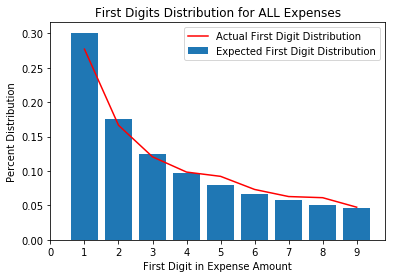

In [1583]:
plt.bar(digits, benford_percentages, label="Expected First Digit Distribution")
plt.plot(digits, actual_percentages, c='r', label='Actual First Digit Distribution')

y_pos = np.arange(len(digits))

plt.title('First Digits Distribution for ALL Expenses')
plt.xlabel('First Digit in Expense Amount')
plt.xticks(np.arange(len(digits)+1))
plt.ylabel('Percent Distribution')
plt.legend();

plt.savefig('../first_digits_distributions.png')

# Number of Departments by `seg3`

### Numbers in `seg3` reflect city department number. Explore department numbers for all expenses.

In [1584]:
expenditures.head(2)

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
0,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172064,419775.00,NaN,12250.00,nan,12250.00,nan,183932.50,nan,1
1,341208,01 -000-300-000-00-00-541104-,01,000,300,000,00,00,541104,,CONTRACTED CLEANING,17/ 3,90,2016-09-08,API,026540,20175151,172065,419775.00,NaN,12250.00,nan,24500.00,nan,nan,nan,1


In [1585]:
# Number of departments
len(expenditures['seg3'].unique())

52

In [1586]:
expenditures['seg3'].unique()

array(['300', '111', '121', '122', '125', '127', '135', '138', '140',
       '141', '145', '151', '161', '162', '165', '171', '176', '181',
       '182', '184', '420', '543', '990', '210', '211', '220', '230',
       '241', '244', '310', '320', '330', '340', '390', '460', '521',
       '522', '524', '525', '541', '549', '590', '610', '650', '800',
       '911', '000', '001', '440', '450', '470', '430'], dtype=object)

In [1587]:
expenditures.groupby(['ACCOUNT DESC', 'seg3']).count()

ORG  ACCOUNT  seg1  seg2  seg4  seg5  \
ACCOUNT DESC                   seg3                                         
ADDITIONAL DIFFERENTIAL        111    13       13    13    13    13    13   
                               135    53       53    53    53    53    53   
                               138    53       53    53    53    53    53   
                               141    53       53    53    53    53    53   
                               145    53       53    53    53    53    53   
                               151    53       53    53    53    53    53   
                               161    53       53    53    53    53    53   
                               162    53       53    53    53    53    53   
                               210    53       53    53    53    53    53   
                               220    54       54    54    54    54    54   
                               241    54       54    54    54    54    54   
                               244    45       45    45    45    45    45   
                               420    55       55    55    55    55    55   
                               521    54       54    54    54    54    54   
                               541    53       53    53    53    53    53   
                               543    53       53    53    53    53    53   
                               610    54       54    54    54    54    54   
ADMIN TECH PROFESSIONALS       310    53       53    53    53    53    53   
ADMIN TECH SUPPLIES MAT        310     8        8     8     8     8     8   
AIDES                          320    92       92    92    92    92    92   
AIR POLLUTION CONTROL          800    12       12    12    12    12    12   
ANIMAL CONTROL                 210    35       35    35    35    35    35   
ASSISTANT PRINCIPALS           300   135      135   135   135   135   135   
                               320   370      370   370   370   370   370   
ASSISTANT SUPERINTENDENTS      310    53       53    53    53    53    53   
ASSISTIVE TECHNOLOGY SUPPLIES  320    54       54    54    54    54    54   
ASST. SUPERINTENDENT SECRETARI 310    53       53    53    53    53    53   
ATHLETIC COACHES               330    45       45    45    45    45    45   
ATHLETIC DIRECTORS             330    45       45    45    45    45    45   
ATHLETIC SUPPLIES & MATS       330   531      531   531   531   531   531   
ATTENDANCE/PARENT LIASONS      330    54       54    54    54    54    54   
AUDIT & ACCOUNTING SERVICES    135     2        2     2     2     2     2   
AUTOMOTIVE MAINTENANCE         210   108      108   108   108   108   108   
                               220   191      191   191   191   191   191   
BANKING SERVICES               145    52       52    52    52    52    52   
BEAUTIFY REVERE                121     4        4     4     4     4     4   
BONDED DEBT                    145    20       20    20    20    20    20   
BUILDING MAINTENANCE & REPAIR  210    57       57    57    57    57    57   
                               220   211      211   211   211   211   211   
                               230     1        1     1     1     1     1   
                               420   202      202   202   202   202   202   
                               430    73       73    73    73    73    73   
                               610     4        4     4     4     4     4   
BUILDING RENOVATIONS #1        340     2        2     2     2     2     2   
BUILDING SECRETARIES           300   159      159   159   159   159   159   
                               320   424      424   424   424   424   424   
BUILDING SECURITY SERVICES     340    18       18    18    18    18    18   
BUILDING TECHNOLOGISTS         300    53       53    53    53    53    53   
                               320   317      317   317   317   317   317   
BUSINESS FINANCE CLERKS        310    53       53    53    53    53    53   
BUSINESS FINANCE OTHER COSTS   31

In [1588]:
num_of_exp_by_account_desc = expenditures['ACCOUNT DESC'].value_counts()
num_of_exp_by_account_desc

PERMANENT SALARIES                2671
EDUCATIONAL INCENTIVE             1106
REVOLVING ACCOUNT EXPENSES        1024
CLASSROOM TEACHERS                1003
PURCHASE OF SERVICES               957
ADDITIONAL DIFFERENTIAL            859
OFFICE SUPPLIES                    777
TUITION TO NON PUBLIC SCHOOLS      702
MAINTENANCE OF BUILDINGS           617
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      548
TAX TITLE                          544
TUITION TO MASS SCHOOLS            541
ATHLETIC SUPPLIES & MATS           531
SPED OUTSIDE TRANSPORTATION        525
ASSISTANT PRINCIPALS               505
INSTRUCTIONAL MATERIALS            504
SPED 504 SERVICES                  498
SUBSTITUTES                        477
SOCIAL WORKERS                     405
MEDICAL EXPENSES                   378
BUILDING TECHNOLOGISTS             370
SPECIALIST TEACHERS                358
MAINTENANCE OF EQUIPMENT           357
TUITION TO COLLABORATIVES

In [1589]:
mask = num_of_exp_by_account_desc >= 500
num_of_exp_by_account_desc[mask]

PERMANENT SALARIES               2671
EDUCATIONAL INCENTIVE            1106
REVOLVING ACCOUNT EXPENSES       1024
CLASSROOM TEACHERS               1003
PURCHASE OF SERVICES              957
ADDITIONAL DIFFERENTIAL           859
OFFICE SUPPLIES                   777
TUITION TO NON PUBLIC SCHOOLS     702
MAINTENANCE OF BUILDINGS          617
BUILDING SECRETARIES              583
PRINCIPALS                        583
BUILDING MAINTENANCE & REPAIR     548
TAX TITLE                         544
TUITION TO MASS SCHOOLS           541
ATHLETIC SUPPLIES & MATS          531
SPED OUTSIDE TRANSPORTATION       525
ASSISTANT PRINCIPALS              505
INSTRUCTIONAL MATERIALS           504
Name: ACCOUNT DESC, dtype: int64

In [1590]:
large_depts = num_of_exp_by_account_desc[mask].index
list(large_depts)

['PERMANENT SALARIES',
 'EDUCATIONAL INCENTIVE',
 'REVOLVING ACCOUNT EXPENSES',
 'CLASSROOM TEACHERS',
 'PURCHASE OF SERVICES',
 'ADDITIONAL DIFFERENTIAL',
 'OFFICE SUPPLIES',
 'TUITION TO NON PUBLIC SCHOOLS',
 'MAINTENANCE OF BUILDINGS',
 'BUILDING SECRETARIES',
 'PRINCIPALS',
 'BUILDING MAINTENANCE & REPAIR',
 'TAX TITLE',
 'TUITION TO MASS SCHOOLS',
 'ATHLETIC SUPPLIES & MATS',
 'SPED OUTSIDE TRANSPORTATION',
 'ASSISTANT PRINCIPALS',
 'INSTRUCTIONAL MATERIALS']

### Evaluate departments where range of `FIRST_DIGIT` did not match range of 1 through 9. Add values of 0 for `FIRST_DIGIT` in order to graph against Benford's 1 through 9 distribution.

In [1591]:
bldg_secr_dept_checks = expenditures[expenditures['ACCOUNT DESC'] == 'BUILDING SECRETARIES']
bldg_secr_dept_percentages = bldg_secr_dept_checks.FIRST_DIGIT.value_counts(normalize=True).sort_index()
bldg_secr_dept_percentages

1   0.00
4   0.09
8   0.45
9   0.46
Name: FIRST_DIGIT, dtype: float64

In [1592]:
bldg_secr_dept_percentages = bldg_secr_dept_percentages.append(pd.Series(0, index=['2', '3', '5', '6', '7']))
bldg_secr_dept_percentages.sort_index(inplace=True)
bldg_secr_dept_percentages

1   0.00
2   0.00
3   0.00
4   0.09
5   0.00
6   0.00
7   0.00
8   0.45
9   0.46
dtype: float64

In [1593]:
principals_dept_checks = expenditures[expenditures['ACCOUNT DESC'] == 'PRINCIPALS']
principals_dept_percentages = principals_dept_checks.FIRST_DIGIT.value_counts(normalize=True).sort_index()
principals_dept_percentages

2   1.00
Name: FIRST_DIGIT, dtype: float64

In [1594]:
principals_dept_percentages = principals_dept_percentages.append(pd.Series(0, index=['1', '3', '4', '5', '6', '7', '8', '9']))
principals_dept_percentages.sort_index(inplace=True)
principals_dept_percentages

1   0.00
2   1.00
3   0.00
4   0.00
5   0.00
6   0.00
7   0.00
8   0.00
9   0.00
dtype: float64

In [1595]:
asst_principals_dept_checks = expenditures[expenditures['ACCOUNT DESC'] == 'ASSISTANT PRINCIPALS']
asst_principals_dept_percentages = asst_principals_dept_checks.FIRST_DIGIT.value_counts(normalize=True).sort_index()
asst_principals_dept_percentages

1   0.08
2   0.63
3   0.01
4   0.26
6   0.00
8   0.02
Name: FIRST_DIGIT, dtype: float64

In [1596]:
asst_principals_dept_percentages = asst_principals_dept_percentages.append(pd.Series(0, index=['5', '7', '9']))
asst_principals_dept_percentages.sort_index(inplace=True)
asst_principals_dept_percentages

1   0.08
2   0.63
3   0.01
4   0.26
5   0.00
6   0.00
7   0.00
8   0.02
9   0.00
dtype: float64

In [1597]:
# For subplots, separate out departments with odd distributions. Plot the distribution for these depts separately.
depts_with_odd_dist = ['BUILDING SECRETARIES', 'PRINCIPALS', 'ASSISTANT PRINCIPALS']
revised_large_depts = [dept for dept in large_depts if dept not in depts_with_odd_dist]
revised_large_depts

['PERMANENT SALARIES',
 'EDUCATIONAL INCENTIVE',
 'REVOLVING ACCOUNT EXPENSES',
 'CLASSROOM TEACHERS',
 'PURCHASE OF SERVICES',
 'ADDITIONAL DIFFERENTIAL',
 'OFFICE SUPPLIES',
 'TUITION TO NON PUBLIC SCHOOLS',
 'MAINTENANCE OF BUILDINGS',
 'BUILDING MAINTENANCE & REPAIR',
 'TAX TITLE',
 'TUITION TO MASS SCHOOLS',
 'ATHLETIC SUPPLIES & MATS',
 'SPED OUTSIDE TRANSPORTATION',
 'INSTRUCTIONAL MATERIALS']

In [1598]:
for i, dept in enumerate(revised_large_depts):
    print(i, dept)

0 PERMANENT SALARIES
1 EDUCATIONAL INCENTIVE
2 REVOLVING ACCOUNT EXPENSES
3 CLASSROOM TEACHERS
4 PURCHASE OF SERVICES
5 ADDITIONAL DIFFERENTIAL
6 OFFICE SUPPLIES
7 TUITION TO NON PUBLIC SCHOOLS
8 MAINTENANCE OF BUILDINGS
9 BUILDING MAINTENANCE & REPAIR
10 TAX TITLE
11 TUITION TO MASS SCHOOLS
12 ATHLETIC SUPPLIES & MATS
13 SPED OUTSIDE TRANSPORTATION
14 INSTRUCTIONAL MATERIALS


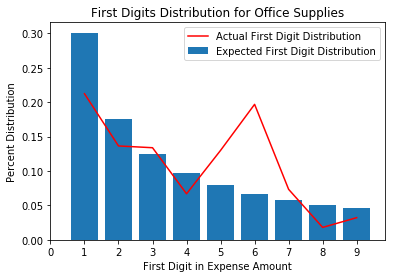

In [1599]:
# Plot example graph for presentation
plt.bar(digits, benford_percentages, label="Expected First Digit Distribution")

dept_check = expenditures[expenditures['ACCOUNT DESC'] == 'OFFICE SUPPLIES']
dept_percentage = dept_check.FIRST_DIGIT.value_counts(normalize=True).sort_index()

plt.plot(digits, dept_percentage, c='r', label='Actual First Digit Distribution')

y_pos = np.arange(len(digits))

plt.title('First Digits Distribution for Office Supplies')
plt.xlabel('First Digit in Expense Amount')
plt.xticks(np.arange(len(digits)+1))
plt.ylabel('Percent Distribution')
plt.legend();

plt.savefig('../example_distributions.png')

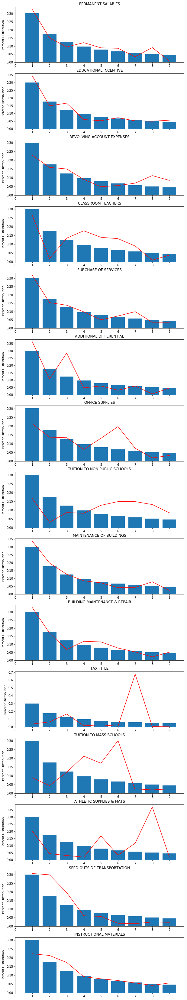

In [1600]:
fig, axes = plt.subplots(nrows=len(revised_large_depts), figsize=(10, 4*len(revised_large_depts)))
for i, dept in enumerate(revised_large_depts):
    # Filter df to only have the checks from dept
    dept_checks = expenditures[expenditures['ACCOUNT DESC'] == dept]
    
    # Get the percentages of FIRST_DIGIT for that filter
    dept_percentages = dept_checks.FIRST_DIGIT.value_counts(normalize=True).sort_index()
    
    # Plot the expected benford percentages as a bar chart
    axes[i].bar(digits, benford_percentages)
    
    #Add the dept as a title on each axis
    axes[i].set_title(dept)
    
    # Plot the dept actual percentages as a line chart
    axes[i].plot(digits, dept_percentages, c='r', label='Actual First Digit Distribution')
    
    
    axes[i].set_xticks(np.arange(len(digits)+1))
    axes[i].set_ylabel('Percent Distribution')
    

    

### Plot departments where range of `FIRST DIGITS` did not match range of 1 through 9

Text(0.5, 1.0, 'BUILDING SECRETARIES')

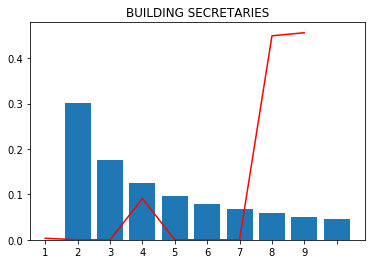

In [1601]:
plt.bar(digits, benford_percentages)
plt.plot(bldg_secr_dept_percentages, c='r', label='Actual First Digit Distribution')
plt.xticks(np.arange(len(digits)+1))

plt.title('BUILDING SECRETARIES')

Text(0.5, 1.0, 'PRINCIPALS')

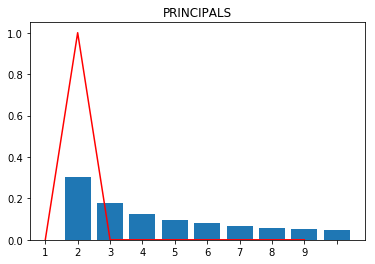

In [1602]:
plt.bar(digits, benford_percentages)
plt.plot(principals_dept_percentages, c='r', label='Actual First Digit Distribution')

plt.xticks(np.arange(len(digits)+1))

plt.title('PRINCIPALS')

Text(0.5, 1.0, 'ASSISTANT PRINCIPALS')

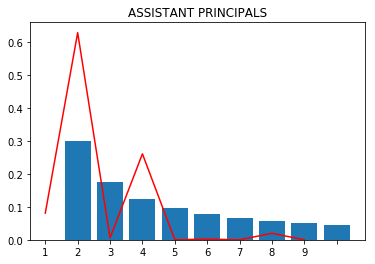

In [1603]:
plt.bar(digits, benford_percentages)
plt.plot(asst_principals_dept_percentages, c='r', label='Actual First Digit Distribution')

plt.xticks(np.arange(len(digits)+1))

plt.title('ASSISTANT PRINCIPALS')

## Check `ACCOUNT DESC` with anomoalies per Benford Percentages

### `CLASSROOM TEACHERS`

#### `first_digit` = 3

In [1604]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
95,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
1258,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,3849.39,nan,3849.39,nan,226337.77,nan,3
1259,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,3849.39,nan,7698.78,nan,nan,nan,3
1260,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,3849.39,nan,11548.17,nan,nan,nan,3
1261,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,3849.39,nan,15397.56,nan,nan,nan,3
1262,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,3849.39,nan,19246.95,nan,nan,nan,3
1263,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,3849.39,nan,23096.34,nan,nan,nan,3
1264,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,3849.39,nan,26945.73,nan,nan,nan,3
1265,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,3849.39,nan,30795.12,nan,nan,nan,3
1266,321102,01 -000-300-001-90-00-523051-,01,000,300,001,90,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,3849.39,nan,34644.51,nan,nan,nan,3


In [1605]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count      135.00
mean     32181.47
std      52028.33
min       3246.99
25%       3849.39
50%      33925.25
75%      35007.72
max     380855.47
Name: JOURNAL AMOUNT, dtype: float64

In [1606]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

3849.39      42
33990.97     16
34897.53     13
33925.25     12
33691.70     11
37618.67      9
37970.40      7
33904.12      4
35117.91      4
38036.03      3
36455.07      2
36240.77      1
36063.64      1
37123.15      1
35223.25      1
380855.47     1
336887.83     1
366789.08     1
36687.10      1
30795.12      1
36274.65      1
3246.99       1
3935.33       1
Name: JOURNAL AMOUNT, dtype: int64

(array([132.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   2.]),
 array([  3246.99 ,  41007.838,  78768.686, 116529.534, 154290.382,
        192051.23 , 229812.078, 267572.926, 305333.774, 343094.622,
        380855.47 ]),
 <a list of 10 Patch objects>)

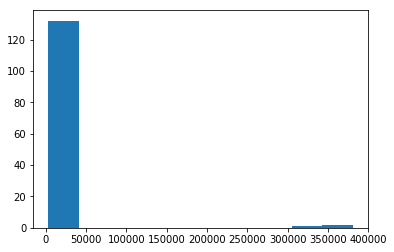

In [1607]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])


{'whiskers': [<matplotlib.lines.Line2D at 0x20975b3cb38>,
 'caps': [<matplotlib.lines.Line2D at 0x20975b41828>,
 'boxes': [<matplotlib.lines.Line2D at 0x20975b3c898>],
 'medians': [<matplotlib.lines.Line2D at 0x20975b476d8>],
 'fliers': [<matplotlib.lines.Line2D at 0x20975b47d68>],
 'means': []}

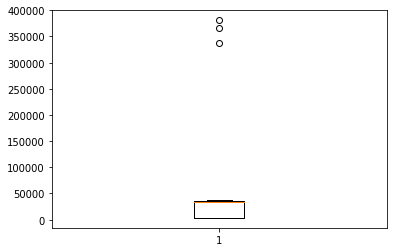

In [1608]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1609]:
CLASSROOM_TEACHERS_3_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 300_000]
CLASSROOM_TEACHERS_3_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
95,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
16448,320301,01 -300-320-100-19-03-523051-,01,300,320,100,19,03,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,336887.83,nan,2255033.75,nan,nan,nan,3
16495,320401,01 -300-320-100-19-04-523051-,01,300,320,100,19,04,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,380855.47,nan,2465618.09,nan,nan,nan,3


In [1610]:
CLASSROOM_TEACHERS_3_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 50_000]
CLASSROOM_TEACHERS_3_standard['JOURNAL AMOUNT'].describe().T

count     132.00
mean    24696.72
std     14866.92
min      3246.99
25%      3849.39
50%     33925.25
75%     34897.53
max     38036.03
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 4

In [1611]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
49,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,46225.91,nan,46225.91,nan,2516367.78,nan,4
50,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,45737.99,nan,91963.90,nan,nan,nan,4
51,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,45737.99,nan,137701.89,nan,nan,nan,4
52,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,45737.99,nan,183439.88,nan,nan,nan,4
54,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,45737.99,nan,227643.39,nan,nan,nan,4
55,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,45737.99,nan,273381.38,nan,nan,nan,4
56,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,45737.99,nan,319119.37,nan,nan,nan,4
57,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,45737.99,nan,364857.36,nan,nan,nan,4
58,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,45737.99,nan,410595.35,nan,nan,nan,4
59,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,45737.99,nan,456333.34,nan,nan,nan,4


In [1612]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count      177.00
mean     45502.37
std      63749.90
min       4150.59
25%      40907.92
50%      45737.99
75%      46350.08
max     471233.23
Name: JOURNAL AMOUNT, dtype: float64

In [1613]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4549.14      28
45952.27     20
47916.03     15
45737.99     10
42616.29      9
43665.91      7
47413.02      6
44077.20      6
40907.92      6
46128.18      6
4375.21       5
47784.59      5
47850.40      4
44419.81      4
44142.83      4
4483.39       4
46207.66      4
46350.08      4
42785.17      3
46686.94      3
42500.09      2
414489.44     1
471233.23     1
4865.37       1
49454.41      1
46069.20      1
42871.37      1
42460.08      1
4150.59       1
43063.14      1
46895.40      1
47603.11      1
47395.53      1
42225.48      1
46714.82      1
46225.91      1
438073.17     1
48980.07      1
42978.98      1
467018.04     1
41839.44      1
41126.47      1
47246.24      1
Name: JOURNAL AMOUNT, dtype: int64

(array([173.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   3.]),
 array([  4150.59 ,  50858.854,  97567.118, 144275.382, 190983.646,
        237691.91 , 284400.174, 331108.438, 377816.702, 424524.966,
        471233.23 ]),
 <a list of 10 Patch objects>)

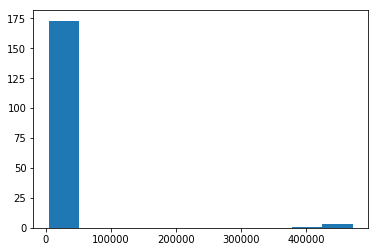

In [1614]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20975c39748>,
 'caps': [<matplotlib.lines.Line2D at 0x20975c412b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x20975c39438>],
 'medians': [<matplotlib.lines.Line2D at 0x20975c41c88>],
 'fliers': [<matplotlib.lines.Line2D at 0x20975c43048>],
 'means': []}

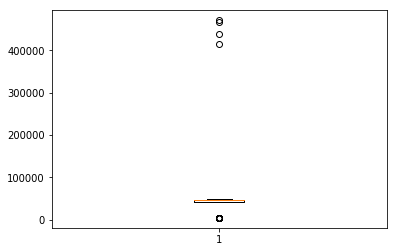

In [1615]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1616]:
CLASSROOM_TEACHERS_4_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 400_000]
CLASSROOM_TEACHERS_4_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
537,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,438073.17,nan,2906043.82,nan,nan,nan,4
889,321101,01 -000-300-001-69-00-523051-,01,000,300,001,69,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,414489.44,nan,2731575.55,nan,nan,nan,4
16402,320201,01 -300-320-100-19-02-523051-,01,300,320,100,19,02,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,471233.23,nan,3137834.47,nan,nan,nan,4
16585,320601,01 -300-320-100-19-06-523051-,01,300,320,100,19,06,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,467018.04,nan,3098598.80,nan,nan,nan,4


In [1617]:
CLASSROOM_TEACHERS_4_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 100_000]
CLASSROOM_TEACHERS_4_standard['JOURNAL AMOUNT'].describe().T

count     173.00
mean    36202.92
std     17240.83
min      4150.59
25%     40907.92
50%     44419.81
75%     46350.08
max     49454.41
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 5

In [1618]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
62,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 5,283,2016-11-10,PRJ,SCHOOL,117115,117115,nan,NaN,50420.07,nan,552391.40,nan,nan,nan,5
493,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,53782.01,nan,53782.01,nan,3123051.23,nan,5
494,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,54991.80,nan,108773.81,nan,nan,nan,5
495,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,54991.80,nan,163765.61,nan,nan,nan,5
496,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,54991.80,nan,218757.41,nan,nan,nan,5
497,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,54690.60,nan,273448.01,nan,nan,nan,5
498,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,55293.00,nan,328741.01,nan,nan,nan,5
499,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,54991.80,nan,383732.81,nan,nan,nan,5
500,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,54991.80,nan,438724.61,nan,nan,nan,5
501,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,54991.80,nan,493716.41,nan,nan,nan,5


In [1619]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     140.00
mean    42081.15
std     21112.32
min      5185.04
25%     39274.60
50%     52028.56
75%     54991.80
max     59985.62
Name: JOURNAL AMOUNT, dtype: float64

In [1620]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5905.78     28
52028.56    22
54752.55    10
54991.80     8
51549.69     7
55169.22     7
51897.18     5
54818.20     4
55234.95     4
56031.41     3
54535.40     3
50733.83     3
5886.61      2
58585.36     2
50397.54     2
59146.57     2
5504.71      2
5323.46      1
58984.56     1
57794.42     1
51192.89     1
54690.60     1
5185.04      1
53969.12     1
59776.17     1
59985.62     1
51764.18     1
58977.49     1
55719.67     1
56649.49     1
57120.87     1
54830.09     1
50600.94     1
50420.07     1
51340.67     1
57747.33     1
5847.73      1
59647.60     1
55293.00     1
59242.79     1
59039.84     1
59311.11     1
53782.01     1
Name: JOURNAL AMOUNT, dtype: int64

(array([35.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 46., 59.]),
 array([ 5185.04 , 10665.098, 16145.156, 21625.214, 27105.272, 32585.33 ,
        38065.388, 43545.446, 49025.504, 54505.562, 59985.62 ]),
 <a list of 10 Patch objects>)

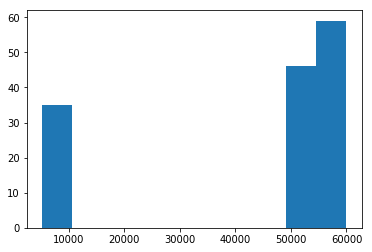

In [1621]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20975a1f7f0>,
 'caps': [<matplotlib.lines.Line2D at 0x20975b0e780>,
 'boxes': [<matplotlib.lines.Line2D at 0x20975aebf98>],
 'medians': [<matplotlib.lines.Line2D at 0x20975c0a1d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x20975c0a898>],
 'means': []}

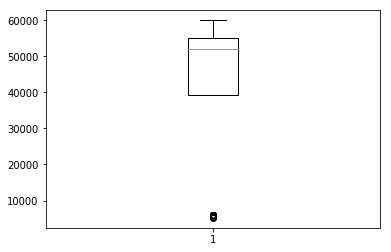

In [1622]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1623]:
CLASSROOM_TEACHERS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 10_000]
CLASSROOM_TEACHERS_5_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
11576,320102,01 -300-320-000-02-01-523051-,01,300,320,000,02,01,523051,,CLASSROOM TEACHERS,17/ 6,432,2016-12-30,PRJ,SCHOOL,1171236,1171236,nan,NaN,5886.61,nan,135694.24,nan,nan,nan,5
11577,320102,01 -300-320-000-02-01-523051-,01,300,320,000,02,01,523051,,CLASSROOM TEACHERS,17/ 7,169,2017-01-06,PRJ,SCHOOL,1170107,1170107,nan,NaN,5886.61,nan,141580.85,nan,nan,nan,5
11843,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 6,142,2016-12-09,PRJ,SCHOOL,1171214,1171214,nan,NaN,5905.78,nan,111744.34,nan,nan,nan,5
11844,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 6,357,2016-12-16,PRJ,SCHOOL,1171220,1171220,nan,NaN,5905.78,nan,117650.12,nan,nan,nan,5
11845,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 6,429,2016-12-23,PRJ,SCHOOL,1171229,1171229,nan,NaN,5905.78,nan,123555.90,nan,nan,nan,5
11846,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 6,432,2016-12-30,PRJ,SCHOOL,1171236,1171236,nan,NaN,5905.78,nan,129461.68,nan,nan,nan,5
11847,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 7,169,2017-01-06,PRJ,SCHOOL,1170107,1170107,nan,NaN,5905.78,nan,135367.46,nan,nan,nan,5
11848,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 7,318,2017-01-20,PRJ,SCHOOL,1170120,1170120,nan,NaN,5905.78,nan,141273.24,nan,nan,nan,5
11849,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 7,323,2017-01-13,PRJ,SCHOOL,1170114,1170114,nan,NaN,5905.78,nan,147179.02,nan,nan,nan,5
11850,320402,01 -300-320-000-02-04-523051-,01,300,320,000,02,04,523051,,CLASSROOM TEACHERS,17/ 7,375,2017-01-27,PRJ,SCHOOL,1170128,1170128,nan,NaN,5905.78,nan,153084.80,nan,nan,nan,5


In [1624]:
CLASSROOM_TEACHERS_5_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 10_000]
CLASSROOM_TEACHERS_5_standard['JOURNAL AMOUNT'].describe().T

count     35.00
mean    5842.88
std      175.39
min     5185.04
25%     5905.78
50%     5905.78
75%     5905.78
max     5905.78
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 6

In [1625]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
492,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,60150.56,nan,390978.56,nan,nan,nan,6
11508,320801,01 -300-320-000-01-08-523051-,01,300,320,000,01,08,523051,,CLASSROOM TEACHERS,17/12,497,2017-06-30,PRJ,CITY,1170636,1170636,nan,NaN,689.47,nan,718548.62,nan,nan,nan,6
11571,320102,01 -300-320-000-02-01-523051-,01,300,320,000,02,01,523051,,CLASSROOM TEACHERS,17/ 5,307,2016-11-25,PRJ,SCHOOL,1171129,1171129,nan,NaN,6060.35,nan,100605.71,nan,nan,nan,6
11738,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,6348.18,nan,6348.18,nan,371967.21,nan,6
11739,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,6348.18,nan,12696.36,nan,nan,nan,6
11740,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,6348.18,nan,19044.54,nan,nan,nan,6
11741,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,6348.18,nan,25392.72,nan,nan,nan,6
11742,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,6348.18,nan,31740.90,nan,nan,nan,6
11743,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,6348.18,nan,38089.08,nan,nan,nan,6
11744,320302,01 -300-320-000-02-03-523051-,01,300,320,000,02,03,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,6348.18,nan,44437.26,nan,nan,nan,6


In [1626]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     132.00
mean    36852.05
std     27082.22
min       689.47
25%      6413.93
50%     60065.38
75%     60376.62
max     68158.93
Name: JOURNAL AMOUNT, dtype: float64

In [1627]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6413.93     28
60645.66    27
60286.94    21
6348.18     16
60065.38    11
6968.72     11
60119.84     6
64786.76     1
60252.40     1
689.47       1
61281.60     1
6909.37      1
66616.29     1
64282.91     1
62362.35     1
6060.35      1
60150.56     1
68158.93     1
60206.49     1
Name: JOURNAL AMOUNT, dtype: int64

(array([58.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 69.,  5.]),
 array([  689.47 ,  7436.416, 14183.362, 20930.308, 27677.254, 34424.2  ,
        41171.146, 47918.092, 54665.038, 61411.984, 68158.93 ]),
 <a list of 10 Patch objects>)

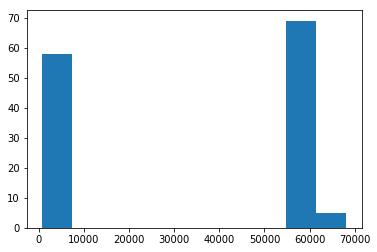

In [1628]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20975c13550>,
 'caps': [<matplotlib.lines.Line2D at 0x20975c18a20>,
 'boxes': [<matplotlib.lines.Line2D at 0x20975c132e8>],
 'medians': [<matplotlib.lines.Line2D at 0x20975c182e8>],
 'fliers': [<matplotlib.lines.Line2D at 0x20975b93940>],
 'means': []}

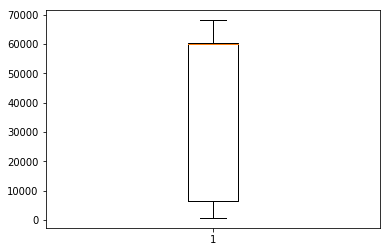

In [1629]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1630]:
CLASSROOM_TEACHERS_6_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 10_000]
CLASSROOM_TEACHERS_6_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,58.00,320334.74,101.47,320102.00,320302.00,320302.00,320302.00,320802.00
JNL,58.00,349.66,101.58,139.00,280.75,350.00,436.00,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,58.00,6404.76,801.20,689.47,6348.18,6413.93,6413.93,6968.72
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,58.00,131873.07,114035.07,6348.18,52026.52,104777.85,196176.35,718548.62
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,382984.52,15580.83,371967.21,377475.87,382984.52,388493.17,394001.83
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1631]:
CLASSROOM_TEACHERS_6_outliers_b = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 10_000]
CLASSROOM_TEACHERS_6_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,74.00,320399.66,219.95,320201.00,320201.00,320201.00,320601.00,321202.00
JNL,74.00,345.81,107.24,139.00,277.00,350.00,433.00,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,74.00,60716.15,1355.44,60065.38,60217.97,60286.94,60645.66,68158.93
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,74.00,1257071.84,702010.98,60065.38,719709.29,1265528.17,1810760.49,2607358.45
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,3005757.65,nan,3005757.65,3005757.65,3005757.65,3005757.65,3005757.65
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 7

In [1632]:
dept = 'CLASSROOM TEACHERS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
448,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,7302.39,nan,7302.39,nan,378987.96,nan,7
449,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,7302.39,nan,14604.78,nan,nan,nan,7
450,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,7302.39,nan,21907.17,nan,nan,nan,7
451,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,7302.39,nan,29209.56,nan,nan,nan,7
452,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,7302.39,nan,36511.95,nan,nan,nan,7
453,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,7302.39,nan,43814.34,nan,nan,nan,7
454,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,7302.39,nan,51116.73,nan,nan,nan,7
455,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,7302.39,nan,58419.12,nan,nan,nan,7
456,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,7302.39,nan,65721.51,nan,nan,nan,7
457,321202,01 -000-300-001-38-00-523051-,01,000,300,001,38,00,523051,,CLASSROOM TEACHERS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,7302.39,nan,73023.90,nan,nan,nan,7


In [1633]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count      90.00
mean     8104.28
std      6869.43
min      7003.43
25%      7302.39
50%      7328.24
75%      7518.82
max     72538.16
Name: JOURNAL AMOUNT, dtype: float64

In [1634]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

7518.82     32
7328.24     26
7272.72     15
7302.39     11
7003.43      2
7110.59      1
7385.26      1
7790.52      1
72538.16     1
Name: JOURNAL AMOUNT, dtype: int64

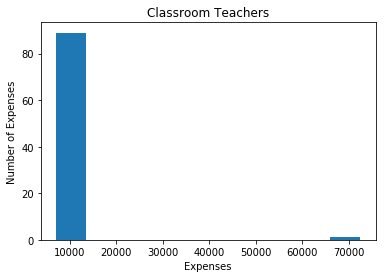

In [1635]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

plt.title('Classroom Teachers')
plt.xlabel('Expenses')
plt.ylabel('Number of Expenses')
plt.savefig('./Classroom_Teachers_example.png')

{'whiskers': [<matplotlib.lines.Line2D at 0x209756dd940>,
 'caps': [<matplotlib.lines.Line2D at 0x209756ddfd0>,
 'boxes': [<matplotlib.lines.Line2D at 0x209756dd7f0>],
 'medians': [<matplotlib.lines.Line2D at 0x209756f76a0>],
 'fliers': [<matplotlib.lines.Line2D at 0x209756f79e8>],
 'means': []}

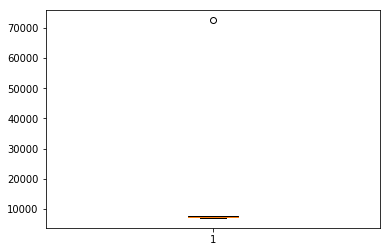

In [1636]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1637]:
CLASSROOM_TEACHERS_7_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 60_000) & (first_digit_checks['JOURNAL AMOUNT'] < 80_000)]
CLASSROOM_TEACHERS_7_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
11961,320502,01 -300-320-000-02-05-523051-,01,300,320,000,02,05,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,72538.16,nan,474946.79,nan,nan,nan,7


In [1638]:
CLASSROOM_TEACHERS_7_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 20_000]
CLASSROOM_TEACHERS_7_standard['JOURNAL AMOUNT'].describe().T

count     89.00
mean    7380.30
std      128.36
min     7003.43
25%     7302.39
50%     7328.24
75%     7518.82
max     7790.52
Name: JOURNAL AMOUNT, dtype: float64

### Overall Department Statistics

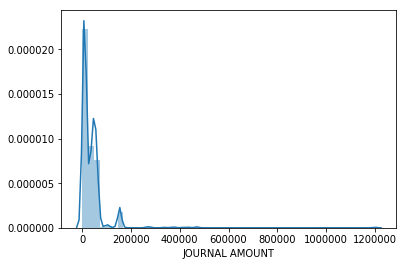

In [1639]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'CLASSROOM TEACHERS']
sns.distplot(dept['JOURNAL AMOUNT'])

In [1640]:
dept['JOURNAL AMOUNT'].describe()

count      1003.00
mean      36869.34
std       60326.05
min         689.47
25%        7518.82
50%       18992.82
75%       47916.03
max     1201879.59
Name: JOURNAL AMOUNT, dtype: float64

### `ADDITIONAL DIFFERENTIAL`

#### `first_digit` = 3

In [1641]:
dept = 'ADDITIONAL DIFFERENTIAL'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1317,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 1,120,2016-07-25,PRJ,CITY,0170728,0170728,nan,NaN,3216.67,nan,3216.67,nan,38300.00,nan,3
1320,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 2,134,2016-08-22,PRJ,MNTHLY,0170823,0170823,nan,NaN,3216.67,nan,6433.34,nan,nan,nan,3
1321,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 3,351,2016-09-26,PRJ,CITY,0170931,0170931,nan,NaN,3216.67,nan,9650.01,nan,nan,nan,3
1322,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 4,279,2016-10-24,PRJ,CITY,0171019,0171019,nan,NaN,3216.67,nan,12866.68,nan,nan,nan,3
1323,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 5,318,2016-11-28,PRJ,CITY,0171128,0171128,nan,NaN,3216.67,nan,16083.35,nan,nan,nan,3
1324,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 6,304,2016-12-19,PRJ,CITY,0171227,0171227,nan,NaN,3233.34,nan,19316.69,nan,nan,nan,3
1325,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 7,305,2017-01-23,PRJ,CITY,0170127,0170127,nan,NaN,3283.35,nan,22600.04,nan,nan,nan,3
1326,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 8,458,2017-02-27,PRJ,CITY,0170225,0170225,nan,NaN,3283.35,nan,25883.39,nan,nan,nan,3
1327,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/ 9,379,2017-03-27,PRJ,CITY,0170332,0170332,nan,NaN,3283.35,nan,29166.74,nan,nan,nan,3
1328,11111,01 -100-111-100-00-00-511100-,01,100,111,100,00,00,511100,,ADDITIONAL DIFFERENTIAL,17/10,420,2017-04-24,PRJ,CITY,0170428,0170428,nan,NaN,3283.35,nan,32450.09,nan,nan,nan,3


In [1642]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    245.00
mean    1186.82
std     1576.80
min       31.43
25%       38.46
50%       39.25
75%     3273.09
max     3994.21
Name: JOURNAL AMOUNT, dtype: float64

In [1643]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

38.46      69
34.62      50
307.85     12
317.21      9
3273.09     9
314.45      7
3283.35     6
3253.89     6
3457.77     5
311.69      5
3216.67     5
3966.26     3
3234.69     3
3303.89     3
3380.83     3
3361.56     3
321.90      3
3994.21     3
3373.14     3
319.14      3
3982.69     2
3975.63     2
3367.35     2
3334.68     2
3965.83     2
3973.96     2
3446.22     2
3233.34     1
3338.52     1
341.43      1
3427.01     1
3465.46     1
312.39      1
3376.98     1
32.68       1
3400.08     1
3403.92     1
3242.37     1
3300.04     1
322.60      1
3411.61     1
324.66      1
3987.17     1
3167.05     1
31.43       1
38.35       1
3967.31     1
39.25       1
Name: JOURNAL AMOUNT, dtype: int64

(array([166.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,  62.,  16.]),
 array([  31.43 ,  427.708,  823.986, 1220.264, 1616.542, 2012.82 ,
        2409.098, 2805.376, 3201.654, 3597.932, 3994.21 ]),
 <a list of 10 Patch objects>)

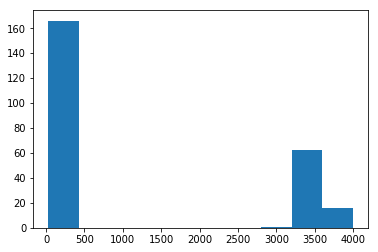

In [1644]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209759db588>,
 'caps': [<matplotlib.lines.Line2D at 0x209759dbc50>,
 'boxes': [<matplotlib.lines.Line2D at 0x209759db438>],
 'medians': [<matplotlib.lines.Line2D at 0x2098dd75320>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098dd75668>],
 'means': []}

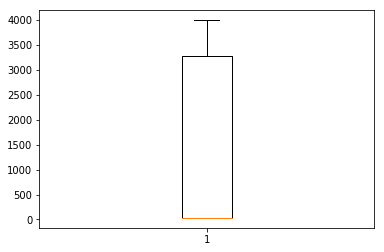

In [1645]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1646]:
ADDITIONAL_DIFFERENTIAL_3_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 3_000) & (first_digit_checks['JOURNAL AMOUNT'] < 4_000)]
ADDITIONAL_DIFFERENTIAL_3_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,79.00,12013.91,386.67,11111.00,12101.00,12201.00,12201.00,12201.00
JNL,79.00,227.78,130.38,10.00,125.00,232.00,326.00,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,79.00,3452.04,275.33,3167.05,3273.09,3361.56,3457.77,3994.21
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,79.00,71011.37,54428.73,3167.05,26005.53,53133.90,116773.67,186629.27
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,117300.00,111722.87,38300.00,77800.00,117300.00,156800.00,196300.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1647]:
ADDITIONAL_DIFFERENTIAL_3_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 500)]
ADDITIONAL_DIFFERENTIAL_3_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,166.00,12405.16,1404.02,11351.00,11411.00,11621.00,12441.00,16101.00
JNL,166.00,241.77,132.53,10.00,132.00,260.00,347.00,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,166.00,108.79,122.18,31.43,34.62,38.46,307.85,341.43
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,166.00,2989.33,3707.47,61.47,844.15,1576.86,2698.05,16424.96
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


### Overall Department Statistics

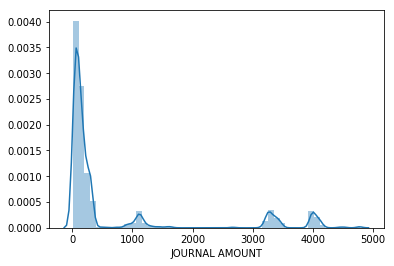

In [1648]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'ADDITIONAL DIFFERENTIAL']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../additional_differential_journal_amounts.png')

In [1649]:
dept['JOURNAL AMOUNT'].describe()

count    859.00
mean     673.90
std     1216.44
min       12.57
25%       73.08
50%      126.93
75%      307.85
max     4778.80
Name: JOURNAL AMOUNT, dtype: float64

### `OFFICE SUPPLIES`

#### `first_digit` = 5

In [1650]:
dept = 'OFFICE SUPPLIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1589,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,209,2017-01-18,API,002632,20170307,179104,423145.00,NaN,5.18,nan,6501.10,nan,nan,nan,5
1590,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,217,2017-01-18,API,007017,20171391,179161,423125.00,NaN,542.00,nan,7043.10,nan,nan,nan,5
1624,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/12,362,2017-06-22,API,028310,20172515,187526,427026.00,NaN,57.63,nan,12438.69,nan,nan,nan,5
2834,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,301,2016-09-21,API,001370,20170672,172638,420079.00,NaN,550.00,nan,3395.87,nan,nan,nan,5
2844,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,321,2016-11-29,API,028486,NaN,176587,422086.00,B,500.47,nan,6717.15,nan,nan,nan,5
2850,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,57,2017-01-05,API,028486,20170945,178456,422832.00,B,505.03,nan,8800.90,nan,nan,nan,5
2860,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,61,2017-03-01,API,028710,20171734,181140,424019.00,B,511.60,nan,11335.77,nan,nan,nan,5
2865,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,214,2017-03-13,API,028710,20171734,181882,424505.00,B,511.60,nan,13085.57,nan,nan,nan,5
2866,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,344,2017-03-23,API,028710,20171734,182509,424656.00,B,511.60,nan,13597.17,nan,nan,nan,5
2867,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,447,2017-03-28,API,028710,20171734,182954,424836.00,B,511.60,nan,14108.77,nan,nan,nan,5


In [1651]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   101.00
mean    312.04
std     260.00
min       5.18
25%      51.73
50%     511.60
75%     551.07
max     595.00
Name: JOURNAL AMOUNT, dtype: float64

In [1652]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5.18      23
57.00     12
511.60    11
581.39     6
584.13     4
582.76     2
539.01     1
560.00     1
57.63      1
539.21     1
518.93     1
578.16     1
551.07     1
541.28     1
551.76     1
59.00      1
544.00     1
551.54     1
510.00     1
591.00     1
540.00     1
575.00     1
50.00      1
595.00     1
550.00     1
52.37      1
544.07     1
554.51     1
572.10     1
51.73      1
551.09     1
51.70      1
59.99      1
540.04     1
553.48     1
540.08     1
520.34     1
551.41     1
550.50     1
57.48      1
550.60     1
59.40      1
57.65      1
500.47     1
52.10      1
522.90     1
505.03     1
551.74     1
542.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([46.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 17., 38.]),
 array([  5.18 ,  64.162, 123.144, 182.126, 241.108, 300.09 , 359.072,
        418.054, 477.036, 536.018, 595.   ]),
 <a list of 10 Patch objects>)

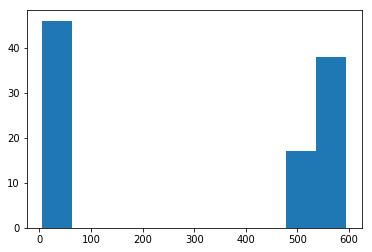

In [1653]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20990dd3fd0>,
 'caps': [<matplotlib.lines.Line2D at 0x20990de26a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x20990dd3e80>],
 'medians': [<matplotlib.lines.Line2D at 0x20990de2d30>],
 'fliers': [<matplotlib.lines.Line2D at 0x20990df40b8>],
 'means': []}

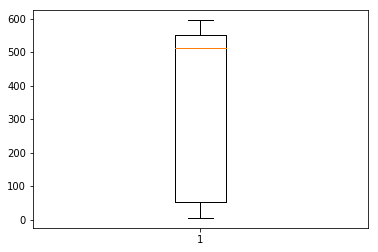

In [1654]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1655]:
OFFICE_SUPPLIES_5_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 100]
OFFICE_SUPPLIES_5_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,46.00,11828.13,1032.53,11214.00,11424.00,11454.00,11514.00,15434.00
JNL,46.00,201.83,117.40,6.00,105.50,200.50,288.00,563.00
CHECK #,46.00,423302.28,2501.47,419256.00,421456.50,423329.50,425331.25,427390.00
JOURNAL AMOUNT,46.00,30.70,25.87,5.18,5.18,27.59,57.00,59.99
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,46.00,15658.12,16988.03,212.85,1246.44,6189.37,33030.39,47558.75
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1656]:
OFFICE_SUPPLIES_5_outliers_b = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 400]
OFFICE_SUPPLIES_5_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,55.00,12368.36,1433.98,11214.00,11354.00,11454.00,14204.00,16104.00
JNL,55.00,204.13,125.26,16.00,67.00,214.00,299.00,502.00
CHECK #,54.00,423691.61,2245.56,419374.00,421999.75,424122.00,425696.25,427139.00
JOURNAL AMOUNT,55.00,547.35,28.45,500.47,515.26,550.50,579.77,595.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,55.00,20654.60,15308.46,-766.83,6958.40,16973.62,34842.43,48581.62
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,3994.01,nan,3994.01,3994.01,3994.01,3994.01,3994.01
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [1657]:
dept = 'OFFICE SUPPLIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1331,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,001007,NaN,170204,419091.00,NaN,600.00,nan,600.00,nan,79200.00,nan,6
1332,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,002130,NaN,170199,419081.00,NaN,600.00,nan,1200.00,nan,nan,nan,6
1333,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,007478,NaN,170205,419093.00,NaN,600.00,nan,1800.00,nan,nan,nan,6
1334,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,008728,NaN,170208,419104.00,NaN,600.00,nan,2400.00,nan,nan,nan,6
1335,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,009335,NaN,170206,419097.00,NaN,600.00,nan,3000.00,nan,nan,nan,6
1336,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,015596,NaN,170202,419089.00,NaN,600.00,nan,3600.00,nan,nan,nan,6
1337,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,015867,NaN,170207,419100.00,NaN,600.00,nan,4200.00,nan,nan,nan,6
1338,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,015868,NaN,170200,419082.00,NaN,600.00,nan,4800.00,nan,nan,nan,6
1339,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,024609,NaN,170198,419080.00,NaN,600.00,nan,5400.00,nan,nan,nan,6
1340,11114,01 -100-111-400-00-00-540000-,01,100,111,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,2,2016-08-01,API,026030,NaN,170203,419090.00,NaN,600.00,nan,6000.00,nan,nan,nan,6


In [1658]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   153.00
mean    563.86
std     142.01
min       6.09
25%     600.00
50%     600.00
75%     600.00
max     699.00
Name: JOURNAL AMOUNT, dtype: float64

In [1659]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

600.00    136
60.00       4
67.80       1
679.96      1
648.07      1
699.00      1
695.00      1
638.55      1
65.14       1
6.09        1
668.50      1
66.32       1
64.59       1
69.00       1
62.00       1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 11.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 136.,   6.]),
 array([  6.09 ,  75.381, 144.672, 213.963, 283.254, 352.545, 421.836,
        491.127, 560.418, 629.709, 699.   ]),
 <a list of 10 Patch objects>)

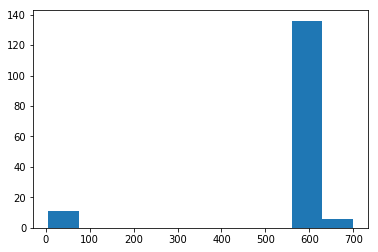

In [1660]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20979242358>,
 'caps': [<matplotlib.lines.Line2D at 0x20979242a20>,
 'boxes': [<matplotlib.lines.Line2D at 0x20979242208>],
 'medians': [<matplotlib.lines.Line2D at 0x2097924b0f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x2097924b438>],
 'means': []}

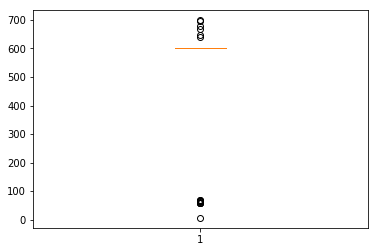

In [1661]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1662]:
OFFICE_SUPPLIES_6_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 100]
OFFICE_SUPPLIES_6_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1556,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,64,2016-09-07,API,028318,20170467,171906,nan,NaN,64.59,nan,1168.01,nan,nan,nan,6
2831,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,68,2016-09-07,API,003001,20170027,171918,419790.00,NaN,60.00,nan,2737.73,nan,nan,nan,6
3170,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/10,48,2017-04-04,API,019499,20171931,183212,425182.00,NaN,62.00,nan,331.95,nan,nan,nan,6
3943,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,101,2016-08-16,API,003001,20170149,170935,419302.00,NaN,60.00,nan,13526.05,nan,nan,nan,6
4045,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/10,168,2017-04-13,API,004311,20171120,183715,425261.00,NaN,6.09,nan,44686.71,nan,nan,nan,6
5904,11624,01 -100-162-400-00-00-540000-,01,100,162,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,222,2016-11-17,API,025361,20170939,176044,421778.00,NaN,60.00,nan,1531.99,nan,nan,nan,6
7783,12104,01 -200-210-400-00-00-540000-,01,200,210,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,95,2016-10-11,API,025944,20170620,173795,420838.00,NaN,69.00,nan,1714.71,nan,nan,nan,6
7791,12104,01 -200-210-400-00-00-540000-,01,200,210,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,183,2016-12-15,API,005754,20171151,177390,422433.00,NaN,66.32,nan,3151.67,nan,nan,nan,6
23738,14204,01 -400-420-400-00-00-540000-,01,400,420,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,190,2016-09-14,API,010668,20170102,172280,419933.00,NaN,60.00,nan,5513.32,nan,nan,nan,6
24678,15254,01 -500-525-400-00-00-540000-,01,500,525,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,26,2017-02-01,API,005754,20170938,179855,423511.00,NaN,65.14,nan,65.14,nan,1388.88,nan,6


In [1663]:
OFFICE_SUPPLIES_6_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] >= 600]
OFFICE_SUPPLIES_6_standard.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,142.00,11139.21,135.70,11114.00,11114.00,11114.00,11114.00,12104.00
JNL,142.00,94.35,149.62,2.00,14.00,32.00,85.00,540.00
CHECK #,138.00,423279.63,2824.68,419080.00,420744.00,423416.00,425909.25,435071.00
JOURNAL AMOUNT,142.00,603.02,15.16,600.00,600.00,600.00,600.00,699.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,142.00,38449.32,23112.61,-71.83,18750.00,36900.00,58050.00,79200.00
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,39960.00,55493.74,720.00,20340.00,39960.00,59580.00,79200.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 7

In [1664]:
dept = 'OFFICE SUPPLIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1551,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,11,2016-09-01,API,000511,20170445,171529,419560.00,NaN,75.00,nan,377.35,nan,nan,nan,7
1571,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,143,2016-10-13,API,000216,20170789,174033,420632.00,NaN,70.00,nan,1969.65,nan,nan,nan,7
1585,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,323,2016-12-22,API,014955,20171037,177910,422519.00,NaN,72.81,nan,5764.96,nan,nan,nan,7
1588,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,103,2017-01-10,API,005754,20171324,178706,423011.00,NaN,75.02,nan,6495.92,nan,nan,nan,7
1598,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,17,2017-03-01,API,005754,20171545,181083,424211.00,NaN,72.82,nan,8237.22,nan,nan,nan,7
1600,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,231,2017-03-13,API,000838,20171698,181927,424594.00,NaN,70.00,nan,8337.22,nan,nan,nan,7
1601,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,231,2017-03-13,API,000838,20171698,181928,424594.00,NaN,70.00,nan,8407.22,nan,nan,nan,7
3163,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,377,2016-12-29,API,004449,20171262,178217,422725.00,NaN,76.96,nan,-1467.47,nan,nan,nan,7
3183,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/12,561,2017-06-30,API,005754,20172700,188048,427390.00,NaN,773.21,nan,1621.25,nan,nan,nan,7
3418,11404,01 -100-140-400-00-00-540000-,01,100,140,400,00,00,540000,,OFFICE SUPPLIES,17/11,18,2017-05-01,API,002239,20172110,184513,425848.00,NaN,787.20,nan,2223.97,nan,nan,nan,7


In [1665]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    57.00
mean    170.25
std     256.86
min       7.77
25%      70.00
50%      76.47
75%      79.98
max     795.98
Name: JOURNAL AMOUNT, dtype: float64

In [1666]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

79.98     11
7.77      10
75.00      8
70.00      5
770.20     1
79.44      1
75.02      1
79.50      1
700.00     1
76.96      1
770.00     1
7.84       1
739.20     1
72.81      1
79.57      1
738.59     1
72.85      1
79.79      1
76.69      1
773.21     1
795.98     1
79.88      1
76.47      1
78.65      1
72.82      1
714.21     1
787.20     1
Name: JOURNAL AMOUNT, dtype: int64

(array([48.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  7.]),
 array([  7.77 ,  86.591, 165.412, 244.233, 323.054, 401.875, 480.696,
        559.517, 638.338, 717.159, 795.98 ]),
 <a list of 10 Patch objects>)

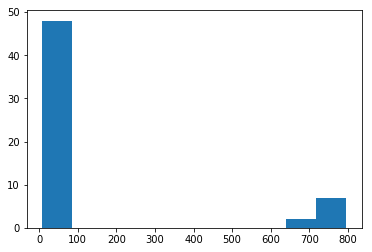

In [1667]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209793084a8>,
 'caps': [<matplotlib.lines.Line2D at 0x20979308b70>,
 'boxes': [<matplotlib.lines.Line2D at 0x20979308358>],
 'medians': [<matplotlib.lines.Line2D at 0x20979310240>],
 'fliers': [<matplotlib.lines.Line2D at 0x20979310588>],
 'means': []}

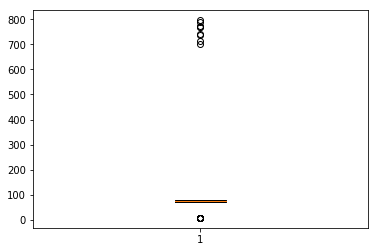

In [1668]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1669]:
OFFICE_SUPPLIES_7_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 600]
OFFICE_SUPPLIES_7_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
3183,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/12,561,2017-06-30,API,005754,20172700,188048,427390.00,NaN,773.21,nan,1621.25,nan,nan,nan,7
3418,11404,01 -100-140-400-00-00-540000-,01,100,140,400,00,00,540000,,OFFICE SUPPLIES,17/11,18,2017-05-01,API,002239,20172110,184513,425848.00,NaN,787.20,nan,2223.97,nan,nan,nan,7
3990,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,225,2016-11-17,API,005754,20170968,176060,421797.00,NaN,770.20,nan,34230.28,nan,nan,nan,7
4041,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,407,2017-03-27,API,007017,20171334,182730,424936.00,NaN,700.00,nan,43197.49,nan,nan,nan,7
4042,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/10,51,2017-04-04,API,025895,20171920,183220,425223.00,NaN,795.98,nan,43993.47,nan,nan,nan,7
7786,12104,01 -200-210-400-00-00-540000-,01,200,210,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,325,2016-11-28,API,005754,20171068,176451,422110.00,NaN,714.21,nan,2509.23,nan,nan,nan,7
7808,12104,01 -200-210-400-00-00-540000-,01,200,210,400,00,00,540000,,OFFICE SUPPLIES,17/12,13,2017-06-01,API,005754,20172272,186052,426695.00,NaN,739.20,nan,7387.22,nan,nan,nan,7
23741,14204,01 -400-420-400-00-00-540000-,01,400,420,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,227,2016-09-21,API,005754,20170476,172503,420147.00,NaN,738.59,nan,6333.61,nan,nan,nan,7
24315,15214,01 -500-521-400-00-00-540000-,01,500,521,400,00,00,540000,,OFFICE SUPPLIES,17/10,168,2017-04-13,API,000625,20171689,183707,425360.00,NaN,770.00,nan,18491.31,nan,nan,nan,7


In [1670]:
OFFICE_SUPPLIES_7_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 100]
OFFICE_SUPPLIES_7_standard.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,48.00,12592.96,1757.12,11214.00,11454.00,11514.00,15214.00,15434.00
JNL,48.00,200.54,165.59,5.00,50.75,187.50,298.25,708.00
CHECK #,47.00,424015.98,2533.42,419228.00,422201.50,424211.00,426446.00,427601.00
JOURNAL AMOUNT,48.00,60.75,29.35,7.77,70.00,75.00,79.81,79.98
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,48.00,8831.45,11441.00,-1467.47,1867.03,5279.41,8262.22,47005.23
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,11208.19,13989.92,1315.83,6262.01,11208.19,16154.38,21100.56
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


### Overall Department Statistics

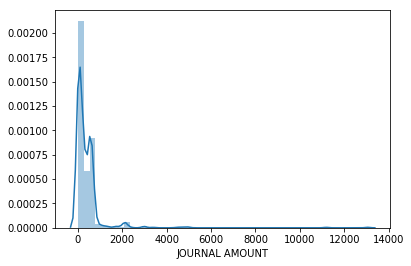

In [1671]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'OFFICE SUPPLIES']
sns.distplot(dept['JOURNAL AMOUNT'])

In [1672]:
dept['JOURNAL AMOUNT'].describe()

count     777.00
mean      381.56
std       794.01
min         1.25
25%        49.98
50%       195.00
75%       584.13
max     13054.92
Name: JOURNAL AMOUNT, dtype: float64

### `TUITION TO NON PUBLIC SCHOOLS`

#### `first_digit` = 5

In [1673]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21243,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,026654,20175150,173025,420405.00,B,5085.00,nan,5085.00,nan,4047559.79,nan,5
21271,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,028390,20175420,173068,420320.00,B,5263.94,nan,190578.69,nan,nan,nan,5
21272,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002939,20175408,173069,420319.00,B,5318.75,nan,195897.44,nan,nan,nan,5
21297,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173342,420517.00,B,5458.61,nan,322932.63,nan,nan,nan,5
21323,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173310,420431.00,B,5013.60,nan,486169.68,nan,nan,nan,5
21324,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173311,420431.00,B,5013.60,nan,491183.28,nan,nan,nan,5
21325,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173312,420431.00,B,5013.60,nan,496196.88,nan,nan,nan,5
21326,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173313,420431.00,B,5013.60,nan,501210.48,nan,nan,nan,5
21327,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173314,420431.00,B,5013.60,nan,506224.08,nan,nan,nan,5
21367,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,313,2016-10-24,API,014730,20175430,174720,421113.00,B,5952.89,nan,736430.28,nan,nan,nan,5


In [1674]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     89.00
mean    5293.42
std      945.75
min      520.00
25%     5134.35
50%     5455.65
75%     5703.90
max     5961.76
Name: JOURNAL AMOUNT, dtype: float64

In [1675]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5590.00    6
5559.48    5
5013.60    5
5445.60    5
5952.89    4
5018.76    3
5134.35    3
5134.10    3
5259.60    3
5529.30    3
520.00     3
5318.75    2
5703.90    2
5879.96    2
5535.92    2
5882.80    2
5326.04    2
5869.50    2
5012.96    2
5961.76    2
5263.94    2
5310.50    2
5306.76    2
5870.10    1
5175.30    1
5035.94    1
5573.40    1
5844.00    1
5224.91    1
5750.93    1
5868.25    1
5462.60    1
5014.65    1
5577.50    1
5458.61    1
5683.27    1
5455.65    1
5042.40    1
5761.50    1
5074.35    1
5819.00    1
5761.80    1
5868.94    1
5727.00    1
5085.00    1
Name: JOURNAL AMOUNT, dtype: int64

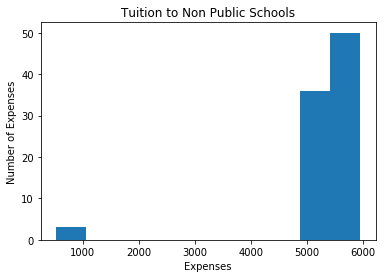

In [1676]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

plt.title('Tuition to Non Public Schools')
plt.xlabel('Expenses')
plt.ylabel('Number of Expenses')
plt.savefig('./Tuition_to_Non_Public_Schools_example.png')

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fa21828>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fa21eb8>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fa216d8>],
 'medians': [<matplotlib.lines.Line2D at 0x2098fa2a588>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098fa2a8d0>],
 'means': []}

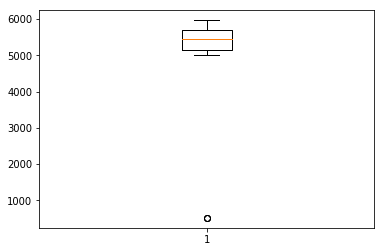

In [1677]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1678]:
TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21924,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/12,569,2017-06-30,API,003883,20175654,188107,427230.00,B,520.00,nan,3148955.93,nan,nan,nan,5
21925,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/12,569,2017-06-30,API,003883,20175654,188108,427230.00,B,520.00,nan,3149475.93,nan,nan,nan,5
21927,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/12,569,2017-06-30,API,003883,20175654,188110,427230.00,B,520.00,nan,3150385.93,nan,nan,nan,5


In [1679]:
TUITION_TO_NON_PUBLIC_SCHOOLS_5_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_5_standard['JOURNAL AMOUNT'].describe().T

count     86.00
mean    5459.93
std      306.22
min     5012.96
25%     5187.70
50%     5460.60
75%     5703.90
max     5961.76
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 6

In [1680]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21279,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,000388,20175409,173394,420522.00,B,66.31,nan,245525.63,nan,nan,nan,6
21299,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173351,420517.00,B,6894.51,nan,329926.94,nan,nan,nan,6
21303,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,011377,20175393,173357,420586.00,B,6571.72,nan,352032.06,nan,nan,nan,6
21304,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,011377,20175393,173361,420586.00,B,6917.60,nan,358949.66,nan,nan,nan,6
21307,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,001122,20175406,173371,420587.00,B,6809.03,nan,385631.93,nan,nan,nan,6
21310,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,000870,20175407,173376,420505.00,B,6086.60,nan,399094.19,nan,nan,nan,6
21311,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,000870,20175407,173377,420505.00,B,6086.60,nan,405180.79,nan,nan,nan,6
21316,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,000376,20175432,173297,420427.00,B,6419.52,nan,427095.51,nan,nan,nan,6
21317,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,000376,20175432,173299,420427.00,B,6419.52,nan,433515.03,nan,nan,nan,6
21338,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,17,2016-10-03,API,003883,20175390,173325,420431.00,B,6466.65,nan,536973.48,nan,nan,nan,6


In [1681]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    104.00
mean    6402.05
std      885.97
min       66.31
25%     6284.47
50%     6466.65
75%     6714.15
max     6972.84
Name: JOURNAL AMOUNT, dtype: float64

In [1682]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6466.65    15
6807.00     5
6266.20     5
6126.30     4
6767.70     4
6571.72     3
6273.45     3
6579.51     3
6910.49     3
6714.15     3
6691.68     3
6633.45     3
6464.42     3
6387.60     2
6177.20     2
6617.59     2
6086.60     2
6486.06     2
6585.46     2
6191.22     2
6609.09     2
6892.82     2
6149.00     2
6723.20     2
6917.60     2
6419.52     2
6954.48     1
6765.80     1
6559.42     1
6546.78     1
6427.51     1
6686.20     1
6183.07     1
6894.51     1
6225.84     1
6376.62     1
6940.05     1
66.31       1
6351.89     1
6303.00     1
6288.15     1
6136.20     1
6720.60     1
6809.03     1
6017.58     1
6972.84     1
643.50      1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 24., 78.]),
 array([  66.31 ,  756.963, 1447.616, 2138.269, 2828.922, 3519.575,
        4210.228, 4900.881, 5591.534, 6282.187, 6972.84 ]),
 <a list of 10 Patch objects>)

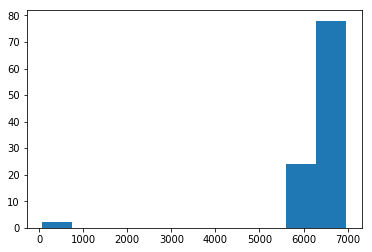

In [1683]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fae7908>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fae7fd0>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fae77b8>],
 'medians': [<matplotlib.lines.Line2D at 0x2098faf36a0>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098faf39e8>],
 'means': []}

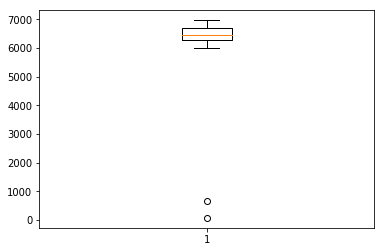

In [1684]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1685]:
TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21279,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,000388,20175409,173394,420522.00,B,66.31,nan,245525.63,nan,nan,nan,6
21376,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,313,2016-10-24,API,000388,20175544,174730,421187.00,B,643.50,nan,790457.51,nan,nan,nan,6


In [1686]:
TUITION_TO_NON_PUBLIC_SCHOOLS_6_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_6_standard['JOURNAL AMOUNT'].describe().T

count    102.00
mean    6520.63
std      246.01
min     6017.58
25%     6315.22
50%     6476.35
75%     6714.15
max     6972.84
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 7

In [1687]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21259,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,026707,20175399,173044,420336.00,B,7269.76,nan,82433.78,nan,nan,nan,7
21268,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173058,420322.00,B,7785.60,nan,168575.94,nan,nan,nan,7
21269,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173059,420322.00,B,7785.60,nan,176361.54,nan,nan,nan,7
21287,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175411,173412,420574.00,B,77.70,nan,264212.74,nan,nan,nan,7
21290,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,014730,20175430,173332,420454.00,B,7206.49,nan,276885.33,nan,nan,nan,7
21291,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,010107,20175429,173333,420457.00,B,7266.16,nan,284151.49,nan,nan,nan,7
21294,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,002915,20175422,173336,420483.00,B,7791.46,nan,298985.22,nan,nan,nan,7
21301,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,022935,20175395,173339,420489.00,B,7703.70,nan,337756.64,nan,nan,nan,7
21302,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,022935,20175395,173340,420489.00,B,7703.70,nan,345460.34,nan,nan,nan,7
21309,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,001122,20175406,173375,420587.00,B,7274.20,nan,393007.59,nan,nan,nan,7


In [1688]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    104.00
mean    7490.12
std      786.35
min       77.70
25%     7297.30
50%     7565.45
75%     7828.05
max     7983.80
Name: JOURNAL AMOUNT, dtype: float64

In [1689]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

7828.05    9
7224.94    6
7360.22    6
7785.40    6
7147.35    5
7899.00    5
7396.13    4
7983.80    3
7504.05    3
7274.20    3
7946.37    3
7962.00    2
7964.99    2
7563.90    2
7747.60    2
7605.20    2
7109.91    2
7527.93    2
7703.70    2
7126.57    2
7321.72    2
7785.60    2
7266.16    1
7075.68    1
7269.76    1
7670.10    1
7946.50    1
7791.46    1
7609.36    1
7528.14    1
7660.50    1
7780.67    1
7489.44    1
7912.00    1
7866.00    1
7263.48    1
7725.38    1
7682.00    1
77.70      1
7038.00    1
7689.13    1
7207.75    1
7206.49    1
7442.38    1
7567.00    1
7325.50    1
7636.00    1
7354.82    1
7402.72    1
7728.06    1
7305.00    1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 11., 92.]),
 array([  77.7 ,  868.31, 1658.92, 2449.53, 3240.14, 4030.75, 4821.36,
        5611.97, 6402.58, 7193.19, 7983.8 ]),
 <a list of 10 Patch objects>)

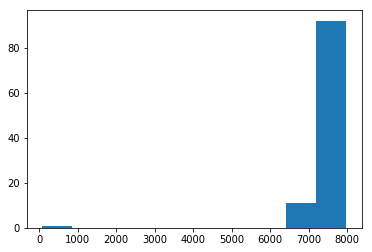

In [1690]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098e984550>,
 'caps': [<matplotlib.lines.Line2D at 0x2098e984c18>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098e984400>],
 'medians': [<matplotlib.lines.Line2D at 0x2098e98d2e8>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098e98d630>],
 'means': []}

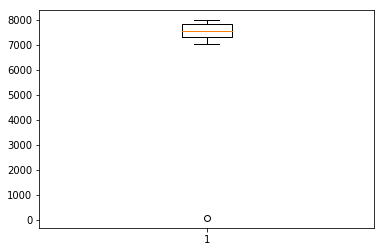

In [1691]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1692]:
TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21287,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175411,173412,420574.00,B,77.70,nan,264212.74,nan,nan,nan,7


In [1693]:
TUITION_TO_NON_PUBLIC_SCHOOLS_7_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 1_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_7_standard['JOURNAL AMOUNT'].describe().T

count    103.00
mean    7562.09
std      283.74
min     7038.00
25%     7313.36
50%     7567.00
75%     7828.05
max     7983.80
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 8

In [1694]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21250,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173035,420397.00,B,838.50,nan,22553.30,nan,nan,nan,8
21251,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173036,420397.00,B,838.50,nan,23391.80,nan,nan,nan,8
21270,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173067,420322.00,B,8953.21,nan,185314.75,nan,nan,nan,8
21277,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,026481,20175397,173061,420322.00,B,8953.21,nan,241832.41,nan,nan,nan,8
21283,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173406,420573.00,B,80.75,nan,258923.35,nan,nan,nan,8
21284,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173408,420573.00,B,80.75,nan,259004.10,nan,nan,nan,8
21285,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173409,420573.00,B,884.60,nan,259888.70,nan,nan,nan,8
21350,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,103,2016-10-11,API,005676,20175414,173815,420828.00,B,8745.98,nan,612280.31,nan,nan,nan,8
21351,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,103,2016-10-11,API,005676,20175414,173816,420828.00,B,8745.98,nan,621026.29,nan,nan,nan,8
21352,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,103,2016-10-11,API,005676,20175414,173817,420828.00,B,8745.98,nan,629772.27,nan,nan,nan,8


In [1695]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     92.00
mean    8160.25
std     1858.83
min       80.75
25%     8319.62
50%     8609.48
75%     8844.60
max     8953.21
Name: JOURNAL AMOUNT, dtype: float64

In [1696]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

8890.66    6
8293.95    6
8745.98    5
8563.94    5
8364.60    5
8947.20    4
8953.21    4
8782.83    3
8844.60    3
8688.90    3
8937.61    3
8942.64    2
8164.17    2
8649.30    2
8824.20    2
8033.52    2
8516.80    2
838.50     2
8199.90    2
8360.10    2
8404.00    2
8794.80    2
8174.67    2
8609.48    2
80.75      2
8384.20    1
8001.62    1
8072.68    1
8606.59    1
8790.73    1
884.60     1
8917.13    1
8692.78    1
8746.56    1
8402.37    1
8024.40    1
8134.80    1
8328.18    1
8885.94    1
8533.00    1
8510.00    1
8797.94    1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 5.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  4., 83.]),
 array([  80.75 ,  967.996, 1855.242, 2742.488, 3629.734, 4516.98 ,
        5404.226, 6291.472, 7178.718, 8065.964, 8953.21 ]),
 <a list of 10 Patch objects>)

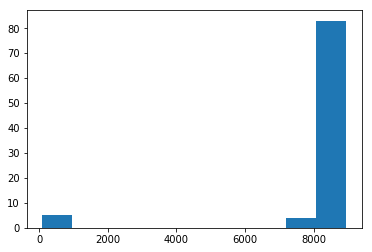

In [1697]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098ea495f8>,
 'caps': [<matplotlib.lines.Line2D at 0x2098ea49cc0>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098ea494a8>],
 'medians': [<matplotlib.lines.Line2D at 0x2098ea55390>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098ea556d8>],
 'means': []}

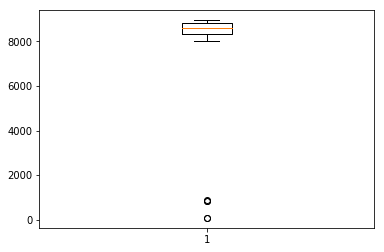

In [1698]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1699]:
TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 2_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21250,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173035,420397.00,B,838.50,nan,22553.30,nan,nan,nan,8
21251,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,012080,20175404,173036,420397.00,B,838.50,nan,23391.80,nan,nan,nan,8
21283,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173406,420573.00,B,80.75,nan,258923.35,nan,nan,nan,8
21284,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173408,420573.00,B,80.75,nan,259004.10,nan,nan,nan,8
21285,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,12,2016-10-06,API,005676,20175415,173409,420573.00,B,884.60,nan,259888.70,nan,nan,nan,8


In [1700]:
TUITION_TO_NON_PUBLIC_SCHOOLS_8_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 2_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_8_standard['JOURNAL AMOUNT'].describe().T

count     87.00
mean    8597.93
std      286.42
min     8001.62
25%     8364.60
50%     8649.30
75%     8844.60
max     8953.21
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 9

In [1701]:
dept = 'TUITION TO NON PUBLIC SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '9'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21253,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,019951,20175401,173038,420373.00,B,9662.94,nan,43254.51,nan,nan,nan,9
21262,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,399,2016-09-29,API,026707,20175399,173055,420336.00,B,9716.07,nan,102924.22,nan,nan,nan,9
21273,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173070,420316.00,B,9079.28,nan,204976.72,nan,nan,nan,9
21274,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173074,420316.00,B,9079.28,nan,214056.00,nan,nan,nan,9
21275,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173075,420316.00,B,9411.60,nan,223467.60,nan,nan,nan,9
21276,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 3,403,2016-09-29,API,002764,20175394,173076,420316.00,B,9411.60,nan,232879.20,nan,nan,nan,9
21295,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,002915,20175422,173337,420483.00,B,9244.40,nan,308229.62,nan,nan,nan,9
21296,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,002915,20175422,173338,420483.00,B,9244.40,nan,317474.02,nan,nan,nan,9
21298,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173346,420517.00,B,99.80,nan,323032.43,nan,nan,nan,9
21305,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,028302,20175396,173367,420500.00,B,9936.62,nan,368886.28,nan,nan,nan,9


In [1702]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     59.00
mean    9179.80
std     1661.42
min       99.80
25%     9245.44
50%     9413.64
75%     9715.76
max     9936.62
Name: JOURNAL AMOUNT, dtype: float64

In [1703]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

9936.62    7
9245.44    6
9737.10    4
9423.00    4
9201.06    3
9253.40    3
9286.83    2
9204.12    2
9413.64    2
9368.48    2
9520.65    2
9079.28    2
9729.06    2
9244.40    2
9411.60    2
9664.60    2
9662.94    1
9931.06    1
9629.28    1
9487.50    1
9716.07    1
9222.62    1
9641.83    1
9715.46    1
9094.32    1
99.80      1
9619.13    1
910.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 57.]),
 array([  99.8  , 1083.482, 2067.164, 3050.846, 4034.528, 5018.21 ,
        6001.892, 6985.574, 7969.256, 8952.938, 9936.62 ]),
 <a list of 10 Patch objects>)

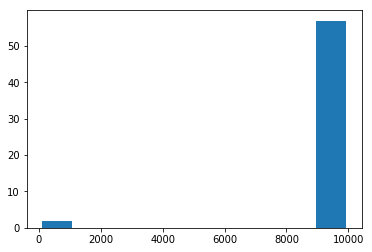

In [1704]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fbf1978>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fbfb080>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fbf1828>],
 'medians': [<matplotlib.lines.Line2D at 0x2098fbfb710>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098fbfba58>],
 'means': []}

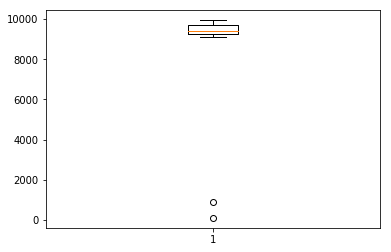

In [1705]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1706]:
TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 2_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21298,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/ 4,15,2016-10-06,API,012079,20175392,173346,420517.00,B,99.80,nan,323032.43,nan,nan,nan,9
21796,390902,01 -300-390-000-02-09-593006-,01,300,390,000,02,09,593006,,TUITION TO NON PUBLIC SCHOOLS,17/11,309,2017-05-23,API,003883,20175654,185658,426256.00,B,910.00,nan,2253539.25,nan,nan,nan,9


In [1707]:
TUITION_TO_NON_PUBLIC_SCHOOLS_9_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 2_000]
TUITION_TO_NON_PUBLIC_SCHOOLS_9_standard['JOURNAL AMOUNT'].describe().T

count     57.00
mean    9484.18
std      266.66
min     9079.28
25%     9245.44
50%     9423.00
75%     9716.07
max     9936.62
Name: JOURNAL AMOUNT, dtype: float64

### Overall Department Statistics

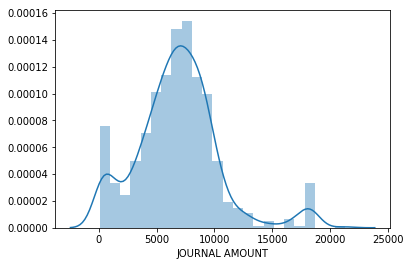

In [1708]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'TUITION TO NON PUBLIC SCHOOLS']
sns.distplot(dept['JOURNAL AMOUNT'])

In [1709]:
dept['JOURNAL AMOUNT'].describe()

count     702.00
mean     6843.22
std      3651.10
min        66.31
25%      4751.50
50%      6744.50
75%      8745.98
max     21343.06
Name: JOURNAL AMOUNT, dtype: float64

### `TAX TITLE`

#### `first_digit` = 7

In [1710]:
dept = 'TAX TITLE'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
4081,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169309,418514.00,NaN,75.00,nan,-111.58,nan,nan,nan,7
4082,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169310,418515.00,NaN,75.00,nan,-36.58,nan,nan,nan,7
4083,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169312,418516.00,B,75.00,nan,38.42,nan,nan,nan,7
4084,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169313,418517.00,B,75.00,nan,113.42,nan,nan,nan,7
4085,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169314,418518.00,B,75.00,nan,188.42,nan,nan,nan,7
4086,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,48,2016-07-13,API,000503,NaN,169343,418519.00,B,75.00,nan,263.42,nan,nan,nan,7
4089,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,57,2016-07-19,API,000503,NaN,169564,418666.00,NaN,75.00,nan,-6750.33,nan,nan,nan,7
4090,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,57,2016-07-19,API,000503,NaN,169566,418667.00,NaN,75.00,nan,-6675.33,nan,nan,nan,7
4093,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,152,2016-07-28,API,000503,NaN,170124,418798.00,NaN,75.00,nan,-6914.33,nan,nan,nan,7
4094,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 1,152,2016-07-28,API,000503,NaN,170131,418799.00,NaN,75.00,nan,-6839.33,nan,nan,nan,7


In [1711]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   368.00
mean     76.83
std      35.19
min      75.00
25%      75.00
50%      75.00
75%      75.00
max     750.00
Name: JOURNAL AMOUNT, dtype: float64

In [1712]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

75.00     367
750.00      1
Name: JOURNAL AMOUNT, dtype: int64

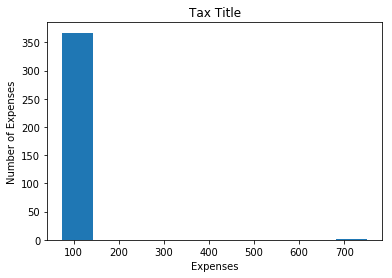

In [1713]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

plt.title('Tax Title')
plt.xlabel('Expenses')
plt.ylabel('Number of Expenses')
plt.savefig('./Tax_Title_example.png')

{'whiskers': [<matplotlib.lines.Line2D at 0x209930b8be0>,
 'caps': [<matplotlib.lines.Line2D at 0x20994bd42e8>,
 'boxes': [<matplotlib.lines.Line2D at 0x209930b8a90>],
 'medians': [<matplotlib.lines.Line2D at 0x20994bd4978>],
 'fliers': [<matplotlib.lines.Line2D at 0x20994bd4cc0>],
 'means': []}

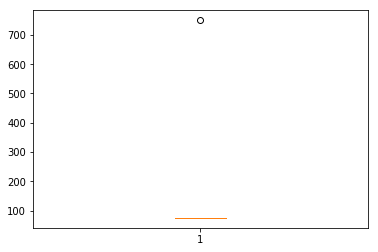

In [1714]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1715]:
TAX_TITLE_7_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 700]
TAX_TITLE_7_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
4310,11457,01 -100-145-700-00-00-571900-,01,100,145,700,00,00,571900,,TAX TITLE,17/ 4,255,2016-10-20,API,025815,20170813,174505,420860.00,NaN,750.00,nan,112875.65,nan,nan,nan,7


In [1716]:
TAX_TITLE_7_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 700]
TAX_TITLE_7_standard['JOURNAL AMOUNT'].describe().T

count   367.00
mean     75.00
std       0.00
min      75.00
25%      75.00
50%      75.00
75%      75.00
max      75.00
Name: JOURNAL AMOUNT, dtype: float64

### Overall Department Statistics

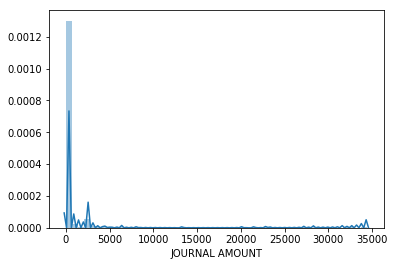

In [1717]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'TAX TITLE']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../tax_title_journal_amounts.png')

In [1718]:
dept['JOURNAL AMOUNT'].describe()

count     544.00
mean      943.86
std      4055.33
min         3.00
25%        75.00
50%        75.00
75%       375.00
max     34409.52
Name: JOURNAL AMOUNT, dtype: float64

### `BUILDING SECRETARIES`

#### `first_digit` = 4

In [1719]:
dept = 'BUILDING SECRETARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
15014,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,4739.53,nan,4739.53,nan,251537.52,nan,4
15015,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,4739.53,nan,9479.06,nan,nan,nan,4
15016,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,4739.53,nan,14218.59,nan,nan,nan,4
15017,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,4739.53,nan,18958.12,nan,nan,nan,4
15018,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,4739.53,nan,23697.65,nan,nan,nan,4
15019,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,4739.53,nan,28437.18,nan,nan,nan,4
15020,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,4739.53,nan,33176.71,nan,nan,nan,4
15021,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,4739.53,nan,37916.24,nan,nan,nan,4
15022,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,4771.07,nan,42687.31,nan,nan,nan,4
15023,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,4762.61,nan,47449.92,nan,nan,nan,4


In [1720]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     53.00
mean    4765.09
std       27.62
min     4651.29
25%     4747.23
50%     4771.07
75%     4779.79
max     4837.26
Name: JOURNAL AMOUNT, dtype: float64

In [1721]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4747.23    15
4779.79    13
4791.33    10
4739.53     8
4762.61     2
4793.53     1
4771.07     1
4837.26     1
4651.29     1
4795.95     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 1.,  0.,  0.,  0.,  8., 17., 14., 12.,  0.,  1.]),
 array([4651.29 , 4669.887, 4688.484, 4707.081, 4725.678, 4744.275,
        4762.872, 4781.469, 4800.066, 4818.663, 4837.26 ]),
 <a list of 10 Patch objects>)

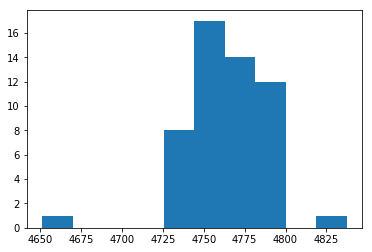

In [1722]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20995298358>,
 'caps': [<matplotlib.lines.Line2D at 0x20995298a20>,
 'boxes': [<matplotlib.lines.Line2D at 0x20995298208>],
 'medians': [<matplotlib.lines.Line2D at 0x209952a10f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x209952a1438>],
 'means': []}

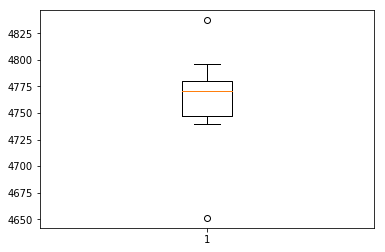

In [1723]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1724]:
BUILDING_SECRETARIES_4_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 4_675)]
BUILDING_SECRETARIES_4_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
15050,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/ 9,506,2017-03-17,PRJ,SCHOOL,1170320,1170320,nan,NaN,4651.29,nan,176503.87,nan,nan,nan,4


In [1725]:
BUILDING_SECRETARIES_4_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 4_800)]
BUILDING_SECRETARIES_4_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
15066,320708,01 -300-320-000-08-07-522102-,01,300,320,000,08,07,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,4837.26,nan,252549.58,nan,nan,nan,4


#### `first_digit` = 8

In [1726]:
dept = 'BUILDING SECRETARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
591,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,813.23,nan,813.23,nan,46057.96,nan,8
592,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,813.23,nan,1626.46,nan,nan,nan,8
593,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,813.23,nan,2439.69,nan,nan,nan,8
594,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,813.23,nan,3252.92,nan,nan,nan,8
595,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,813.23,nan,4066.15,nan,nan,nan,8
596,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,813.23,nan,4879.38,nan,nan,nan,8
597,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,813.23,nan,5692.61,nan,nan,nan,8
598,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,813.23,nan,6505.84,nan,nan,nan,8
599,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,813.23,nan,7319.07,nan,nan,nan,8
600,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,813.23,nan,8132.30,nan,nan,nan,8


In [1727]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   262.00
mean    861.40
std      29.23
min     813.23
25%     857.63
50%     868.57
75%     885.75
max     886.35
Name: JOURNAL AMOUNT, dtype: float64

In [1728]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\IPython\core\displayhook.py:271: UserWarning: Output cache limit (currently 1000 entries) hit.
Flushing oldest 200 entries.
  'Flushing oldest {cull_count} entries.'.format(sz=sz, cull_count=cull_count))


885.75    72
813.23    64
886.35    44
857.63    39
868.57    32
874.81     8
874.79     1
866.43     1
885.73     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 64.,   0.,   0.,   0.,   0.,   0.,  39.,  33.,   9., 117.]),
 array([813.23 , 820.542, 827.854, 835.166, 842.478, 849.79 , 857.102,
        864.414, 871.726, 879.038, 886.35 ]),
 <a list of 10 Patch objects>)

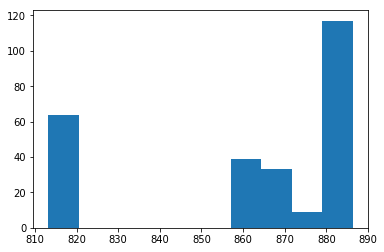

In [1729]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20995360978>,
 'caps': [<matplotlib.lines.Line2D at 0x2099536b048>,
 'boxes': [<matplotlib.lines.Line2D at 0x20995360828>],
 'medians': [<matplotlib.lines.Line2D at 0x2099536b6d8>],
 'fliers': [<matplotlib.lines.Line2D at 0x2099536ba20>],
 'means': []}

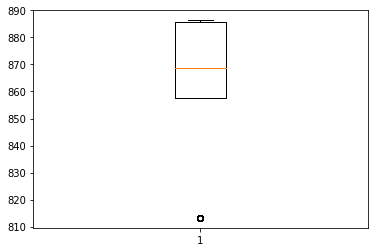

In [1730]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1731]:
BUILDING_SECRETARIES_8_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 820]
BUILDING_SECRETARIES_8_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
591,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,813.23,nan,813.23,nan,46057.96,nan,8
592,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,813.23,nan,1626.46,nan,nan,nan,8
593,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,813.23,nan,2439.69,nan,nan,nan,8
594,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,813.23,nan,3252.92,nan,nan,nan,8
595,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,813.23,nan,4066.15,nan,nan,nan,8
596,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,813.23,nan,4879.38,nan,nan,nan,8
597,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,813.23,nan,5692.61,nan,nan,nan,8
598,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,813.23,nan,6505.84,nan,nan,nan,8
599,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,813.23,nan,7319.07,nan,nan,nan,8
600,321108,01 -000-300-001-64-00-522102-,01,000,300,001,64,00,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,813.23,nan,8132.30,nan,nan,nan,8


#### `first_digit` = 9

In [1732]:
dept = 'BUILDING SECRETARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '9'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
149,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,928.81,nan,928.81,nan,50378.12,nan,9
150,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,928.81,nan,1857.62,nan,nan,nan,9
151,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,928.81,nan,2786.43,nan,nan,nan,9
152,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,928.81,nan,3715.24,nan,nan,nan,9
153,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,928.81,nan,4644.05,nan,nan,nan,9
154,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,928.81,nan,5572.86,nan,nan,nan,9
155,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,928.81,nan,6501.67,nan,nan,nan,9
156,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,928.81,nan,7430.48,nan,nan,nan,9
157,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,928.81,nan,8359.29,nan,nan,nan,9
158,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,928.81,nan,9288.10,nan,nan,nan,9


In [1733]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count   266.00
mean    946.37
std      18.69
min     903.25
25%     930.16
50%     939.77
75%     951.31
max     978.24
Name: JOURNAL AMOUNT, dtype: float64

In [1734]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

951.31    67
978.24    52
939.77    52
930.16    42
928.81    36
918.62     9
903.25     2
968.81     2
947.66     1
903.85     1
957.27     1
937.08     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 3.,  0.,  9., 78., 53.,  1., 67.,  1.,  2., 52.]),
 array([903.25 , 910.749, 918.248, 925.747, 933.246, 940.745, 948.244,
        955.743, 963.242, 970.741, 978.24 ]),
 <a list of 10 Patch objects>)

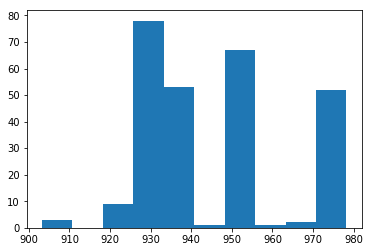

In [1735]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2099542dbe0>,
 'caps': [<matplotlib.lines.Line2D at 0x209954372e8>,
 'boxes': [<matplotlib.lines.Line2D at 0x2099542da90>],
 'medians': [<matplotlib.lines.Line2D at 0x20995437978>],
 'fliers': [<matplotlib.lines.Line2D at 0x20995437cc0>],
 'means': []}

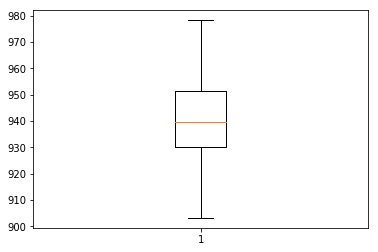

In [1736]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1737]:
BUILDING_SECRETARIES_9_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 910]
BUILDING_SECRETARIES_9_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
995,321008,01 -000-300-001-70-00-522102-,01,000,300,001,70,00,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,903.85,nan,46901.73,nan,nan,nan,9
13179,320108,01 -300-320-000-08-01-522102-,01,300,320,000,08,01,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,903.25,nan,46412.49,nan,nan,nan,9
14171,320408,01 -300-320-000-08-04-522102-,01,300,320,000,08,04,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,903.25,nan,46962.25,nan,nan,nan,9


In [1738]:
BUILDING_SECRETARIES_9_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 940) & (first_digit_checks['JOURNAL AMOUNT'] < 950)]
BUILDING_SECRETARIES_9_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
14468,320508,01 -300-320-000-08-05-522102-,01,300,320,000,08,05,522102,,BUILDING SECRETARIES,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,947.66,nan,49219.04,nan,nan,nan,9


In [1739]:
BUILDING_SECRETARIES_9_outliers_c = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 950) & (first_digit_checks['JOURNAL AMOUNT'] < 970)]
BUILDING_SECRETARIES_9_outliers_c

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
186,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 9,509,2017-03-24,PRJ,SCHOOL,1170326,1170326,nan,NaN,951.31,nan,35820.20,nan,nan,nan,9
187,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/ 9,512,2017-03-31,PRJ,SCHOOL,1170333,1170333,nan,NaN,951.31,nan,36771.51,nan,nan,nan,9
188,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,215,2017-04-07,PRJ,SCHOOL,1170406,1170406,nan,NaN,951.31,nan,37722.82,nan,nan,nan,9
189,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,427,2017-04-14,PRJ,SCHOOL,1170415,1170415,nan,NaN,951.31,nan,38674.13,nan,nan,nan,9
190,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,430,2017-04-21,PRJ,SCHOOL,1170422,1170422,nan,NaN,951.31,nan,39625.44,nan,nan,nan,9
191,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/10,433,2017-04-28,PRJ,SCHOOL,1170429,1170429,nan,NaN,951.31,nan,40576.75,nan,nan,nan,9
192,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,352,2017-05-05,PRJ,170505,1170505,1170505,nan,NaN,951.31,nan,41528.06,nan,nan,nan,9
193,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,475,2017-05-12,PRJ,170513,1170513,1170513,nan,NaN,951.31,nan,42479.37,nan,nan,nan,9
194,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,478,2017-05-19,PRJ,170520,1170520,1170520,nan,NaN,951.31,nan,43430.68,nan,nan,nan,9
195,321208,01 -000-300-001-30-00-522102-,01,000,300,001,30,00,522102,,BUILDING SECRETARIES,17/11,481,2017-05-26,PRJ,170528,1170528,1170528,nan,NaN,951.31,nan,44381.99,nan,nan,nan,9


### Overall Department Statistics

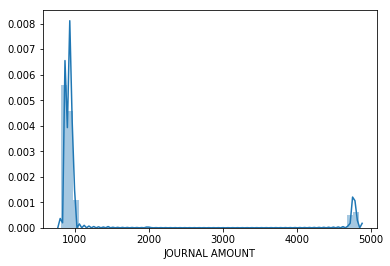

In [1740]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'BUILDING SECRETARIES']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../building_secretaries_journal_amounts.png')

In [1741]:
dept['JOURNAL AMOUNT'].describe()

count    583.00
mean    1257.96
std     1112.13
min      813.23
25%      885.74
50%      928.81
75%      951.31
max     4837.26
Name: JOURNAL AMOUNT, dtype: float64

### `ATHLETIC SUPPLIES & MATS`

#### `first_digit` = 5

In [1742]:
dept = 'ATHLETIC SUPPLIES & MATS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18313,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 1,6,2016-07-06,API,019041,20166716,168961,nan,NaN,50.00,nan,248.00,nan,nan,nan,5
18358,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,004638,20175029,173686,420645.00,NaN,58.00,nan,29338.80,nan,nan,nan,5
18359,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,018244,20175029,173697,420778.00,NaN,58.00,nan,29396.80,nan,nan,nan,5
18362,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,022853,20175029,173691,420725.00,NaN,58.00,nan,29614.80,nan,nan,nan,5
18363,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,023874,20175029,173692,420731.00,NaN,58.00,nan,29672.80,nan,nan,nan,5
18364,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,023874,20175029,173693,420731.00,NaN,58.00,nan,29730.80,nan,nan,nan,5
18366,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,024854,20175029,173694,420747.00,NaN,58.00,nan,29868.80,nan,nan,nan,5
18367,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,027525,20175029,173687,420655.00,NaN,58.00,nan,29926.80,nan,nan,nan,5
18368,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,027592,20175029,173690,420712.00,NaN,58.00,nan,29984.80,nan,nan,nan,5
18371,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,78,2016-10-11,API,028423,20175029,173696,420765.00,NaN,58.00,nan,30202.80,nan,nan,nan,5


In [1743]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     89.00
mean     149.65
std      629.63
min       50.00
25%       58.00
50%       58.00
75%       58.00
max     5934.00
Name: JOURNAL AMOUNT, dtype: float64

In [1744]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

58.00      73
50.00       8
55.00       2
528.00      2
5934.00     1
529.52      1
503.00      1
552.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([88.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  50. ,  638.4, 1226.8, 1815.2, 2403.6, 2992. , 3580.4, 4168.8,
        4757.2, 5345.6, 5934. ]),
 <a list of 10 Patch objects>)

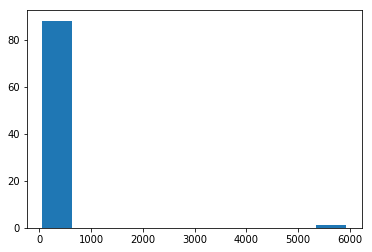

In [1745]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20994cb4d30>,
 'caps': [<matplotlib.lines.Line2D at 0x20994cba668>,
 'boxes': [<matplotlib.lines.Line2D at 0x20994cb4b70>],
 'medians': [<matplotlib.lines.Line2D at 0x20994cba710>],
 'fliers': [<matplotlib.lines.Line2D at 0x20994ca42e8>],
 'means': []}

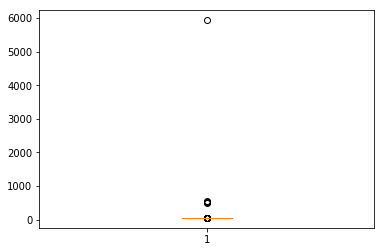

In [1746]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1747]:
ATHLETIC_SUPPLIES_MATS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 5_000]
ATHLETIC_SUPPLIES_MATS_5_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18634,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 8,414,2017-02-23,API,020328,20175899,180847,423831.00,B,5934.00,nan,106975.41,nan,nan,nan,5


In [1748]:
ATHLETIC_SUPPLIES_MATS_5_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 5_000]
ATHLETIC_SUPPLIES_MATS_5_standard['JOURNAL AMOUNT'].describe().T

count    88.00
mean     83.92
std     109.73
min      50.00
25%      58.00
50%      58.00
75%      58.00
max     552.00
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 7

In [1749]:
dept = 'ATHLETIC SUPPLIES & MATS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '7'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18312,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 1,6,2016-07-06,API,019041,20166634,168960,nan,NaN,73.00,nan,198.00,nan,nan,nan,7
18327,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,383,2016-09-29,API,021755,20175036,172879,420392.00,NaN,7249.00,nan,22391.00,nan,nan,nan,7
18330,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,483,2016-09-30,GEN,FY2017,SCH/POL,PO175028,nan,NaN,704.00,nan,26594.00,nan,nan,nan,7
18372,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,91,2016-10-11,API,001008,20175348,173789,420813.00,NaN,75.00,nan,30277.80,nan,nan,nan,7
18404,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,178,2016-10-17,API,002111,20175029,174234,420932.00,NaN,73.00,nan,41608.75,nan,nan,nan,7
18420,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,219,2016-10-18,API,001008,20175348,174358,420997.00,NaN,75.00,nan,45675.75,nan,nan,nan,7
18425,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 5,43,2016-11-02,API,001008,20175348,175232,421423.00,NaN,75.00,nan,50194.60,nan,nan,nan,7
18496,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 5,190,2016-11-15,API,001008,20175348,175997,421760.00,NaN,75.00,nan,59613.12,nan,nan,nan,7
18497,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 5,190,2016-11-15,API,001008,20175348,175998,421760.00,NaN,75.00,nan,59688.12,nan,nan,nan,7
18520,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 6,97,2016-12-07,API,018816,20175029,176999,422263.00,NaN,73.00,nan,67169.76,nan,nan,nan,7


In [1750]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     62.00
mean     212.15
std      915.70
min       70.00
25%       75.00
50%       75.00
75%       77.25
max     7249.00
Name: JOURNAL AMOUNT, dtype: float64

In [1751]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

75.00      41
78.00      12
73.00       4
7249.00     1
70.00       1
748.00      1
79.00       1
704.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([61.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  70. ,  787.9, 1505.8, 2223.7, 2941.6, 3659.5, 4377.4, 5095.3,
        5813.2, 6531.1, 7249. ]),
 <a list of 10 Patch objects>)

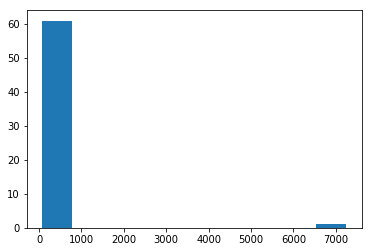

In [1752]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20990d60e10>,
 'caps': [<matplotlib.lines.Line2D at 0x2097932a3c8>,
 'boxes': [<matplotlib.lines.Line2D at 0x20990d60ba8>],
 'medians': [<matplotlib.lines.Line2D at 0x20990da5828>],
 'fliers': [<matplotlib.lines.Line2D at 0x20990da59b0>],
 'means': []}

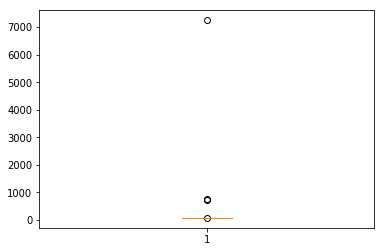

In [1753]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1754]:
ATHLETIC_SUPPLIES_MATS_7_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 6_000]
ATHLETIC_SUPPLIES_MATS_7_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18327,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,383,2016-09-29,API,021755,20175036,172879,420392.00,NaN,7249.00,nan,22391.00,nan,nan,nan,7


In [1755]:
ATHLETIC_SUPPLIES_MATS_7_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 700) & (first_digit_checks['JOURNAL AMOUNT'] < 800)]
ATHLETIC_SUPPLIES_MATS_7_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18330,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 3,483,2016-09-30,GEN,FY2017,SCH/POL,PO175028,nan,NaN,704.00,nan,26594.00,nan,nan,nan,7
18704,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 9,185,2017-03-08,API,020755,20175959,181691,424417.00,B,748.00,nan,115890.41,nan,nan,nan,7


In [1756]:
ATHLETIC_SUPPLIES_MATS_7_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 700]
ATHLETIC_SUPPLIES_MATS_7_standard['JOURNAL AMOUNT'].describe().T

count   59.00
mean    75.46
std      1.62
min     70.00
25%     75.00
50%     75.00
75%     75.00
max     79.00
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 8

In [1757]:
dept = 'ATHLETIC SUPPLIES & MATS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18334,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,018385,20175029,173491,420527.00,NaN,80.00,nan,27012.00,nan,nan,nan,8
18335,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021753,20175029,173484,420518.00,NaN,87.00,nan,27099.00,nan,nan,nan,8
18336,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,023531,20175029,173485,420495.00,NaN,87.00,nan,27186.00,nan,nan,nan,8
18341,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,027525,20175029,173489,420451.00,NaN,80.00,nan,27668.00,nan,nan,nan,8
18345,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,018219,20175029,173501,420559.00,NaN,87.00,nan,28163.00,nan,nan,nan,8
18346,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,018938,20175029,173499,420512.00,NaN,87.00,nan,28250.00,nan,nan,nan,8
18347,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021276,20175029,173503,420570.00,NaN,87.00,nan,28337.00,nan,nan,nan,8
18348,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021672,20175029,173504,420579.00,NaN,87.00,nan,28424.00,nan,nan,nan,8
18349,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,021717,20175029,173498,420471.00,NaN,87.00,nan,28511.00,nan,nan,nan,8
18350,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,39,2016-10-05,API,022534,20175029,173496,420417.00,NaN,87.00,nan,28598.00,nan,nan,nan,8


In [1758]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    197.00
mean     135.50
std      594.87
min       80.00
25%       80.00
50%       80.00
75%       85.00
max     8334.00
Name: JOURNAL AMOUNT, dtype: float64

In [1759]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

80.00      145
87.00       41
88.00        4
85.00        3
845.26       1
8334.00      1
880.00       1
860.00       1
Name: JOURNAL AMOUNT, dtype: int64

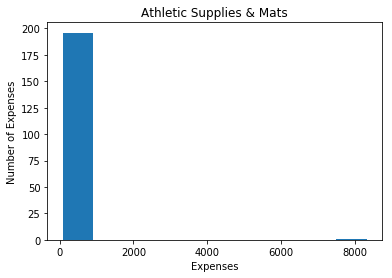

In [1760]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

plt.title('Athletic Supplies & Mats')
plt.xlabel('Expenses')
plt.ylabel('Number of Expenses')
plt.savefig('./Athletic_Supplies_Mats_example.png')

{'whiskers': [<matplotlib.lines.Line2D at 0x20973021da0>,
 'caps': [<matplotlib.lines.Line2D at 0x20973021b00>,
 'boxes': [<matplotlib.lines.Line2D at 0x20973021208>],
 'medians': [<matplotlib.lines.Line2D at 0x2097303b748>],
 'fliers': [<matplotlib.lines.Line2D at 0x2097303b390>],
 'means': []}

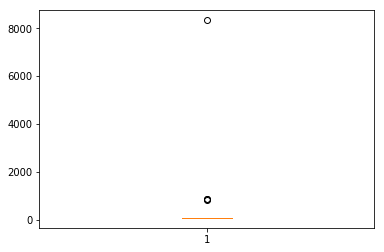

In [1761]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1762]:
ATHLETIC_SUPPLIES_MATS_8_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 7_000]
ATHLETIC_SUPPLIES_MATS_8_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18392,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 4,161,2016-10-17,API,028074,20175255,174144,421035.00,NaN,8334.00,nan,40428.75,nan,nan,nan,8


In [1763]:
ATHLETIC_SUPPLIES_MATS_8_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 800) & (first_digit_checks['JOURNAL AMOUNT'] < 900)]
ATHLETIC_SUPPLIES_MATS_8_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
18526,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 6,348,2016-12-27,API,021755,20175442,178001,422709.00,B,845.26,nan,68809.02,nan,nan,nan,8
18607,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/ 8,400,2017-02-23,API,020328,20175899,180811,423831.00,B,860.00,nan,80683.57,nan,nan,nan,8
18724,330908,01 -300-330-000-08-09-535105-,01,300,330,000,08,09,535105,,ATHLETIC SUPPLIES & MATS,17/10,87,2017-04-06,GEN,FY2017,FEB-MAR17,PO20175028,nan,B,880.00,nan,130107.91,nan,nan,nan,8


In [1764]:
ATHLETIC_SUPPLIES_MATS_8_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 90]
ATHLETIC_SUPPLIES_MATS_8_standard['JOURNAL AMOUNT'].describe().T

count   193.00
mean     81.73
std       3.03
min      80.00
25%      80.00
50%      80.00
75%      80.00
max      88.00
Name: JOURNAL AMOUNT, dtype: float64

### Overall Department Statistics

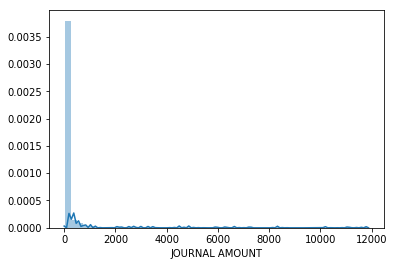

In [1765]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'ATHLETIC SUPPLIES & MATS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../athletic_supplies_mats_journal_amounts.png')

In [1766]:
dept['JOURNAL AMOUNT'].describe()

count     531.00
mean      306.24
std      1134.14
min        25.00
25%        75.00
50%        80.00
75%       116.00
max     11852.00
Name: JOURNAL AMOUNT, dtype: float64

### `TUITION TO MASS SCHOOLS`

#### `first_digit` = 4

In [1767]:
dept = 'TUITION TO MASS SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20702,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173240,420577.00,NaN,4527.20,nan,4527.20,nan,3753518.04,nan,4
20703,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173241,420577.00,NaN,4527.20,nan,9054.40,nan,nan,nan,4
20704,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173242,420577.00,NaN,4527.20,nan,13581.60,nan,nan,nan,4
20705,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173243,420577.00,NaN,4527.20,nan,18108.80,nan,nan,nan,4
20712,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173250,420577.00,NaN,4952.00,nan,60408.88,nan,nan,nan,4
20713,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173251,420577.00,NaN,4952.00,nan,65360.88,nan,nan,nan,4
20717,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175248,173255,420577.00,NaN,4527.20,nan,90315.74,nan,nan,nan,4
20720,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173258,420577.00,NaN,4527.20,nan,105839.76,nan,nan,nan,4
20721,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173259,420577.00,NaN,4527.20,nan,110366.96,nan,nan,nan,4
20722,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173260,420577.00,NaN,4527.20,nan,114894.16,nan,nan,nan,4


In [1768]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    115.00
mean    4534.27
std      227.09
min     4023.63
25%     4333.14
50%     4527.20
75%     4642.65
max     4983.00
Name: JOURNAL AMOUNT, dtype: float64

In [1769]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4642.65    23
4333.14    23
4809.98    12
4244.10    11
4527.20    10
4952.00     5
4593.16     4
4616.26     3
4669.38     2
4928.79     2
4523.86     2
4384.38     2
4175.60     2
4409.97     2
4983.00     1
4196.60     1
4858.14     1
4645.50     1
4112.60     1
4405.41     1
4890.00     1
4926.30     1
4395.46     1
4401.00     1
4318.23     1
4023.63     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2.,  3., 11., 29.,  2., 16., 29.,  0., 13., 10.]),
 array([4023.63 , 4119.567, 4215.504, 4311.441, 4407.378, 4503.315,
        4599.252, 4695.189, 4791.126, 4887.063, 4983.   ]),
 <a list of 10 Patch objects>)

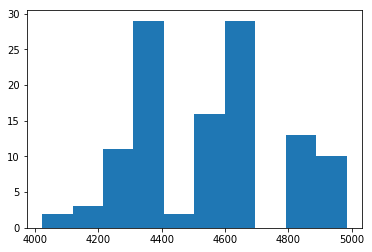

In [1770]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209746cc710>,
 'caps': [<matplotlib.lines.Line2D at 0x20976f3cd30>,
 'boxes': [<matplotlib.lines.Line2D at 0x209746cca90>],
 'medians': [<matplotlib.lines.Line2D at 0x20976df0a90>],
 'fliers': [<matplotlib.lines.Line2D at 0x20976df0748>],
 'means': []}

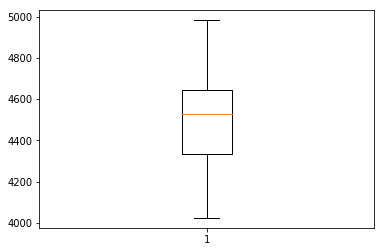

In [1771]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1772]:
TUITION_TO_MASS_SCHOOLS_4_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 4_000) & (first_digit_checks['JOURNAL AMOUNT'] < 4_200)]
TUITION_TO_MASS_SCHOOLS_4_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20816,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175249,175618,421599.00,NaN,4196.60,nan,686043.90,nan,nan,nan,4
20927,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175698,180390,423718.00,NaN,4112.60,nan,1335373.09,nan,nan,nan,4
20929,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175699,180392,423718.00,NaN,4175.60,nan,1348393.89,nan,nan,nan,4
20930,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,001712,20175699,180393,423718.00,NaN,4175.60,nan,1352569.49,nan,nan,nan,4
21032,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/10,110,2017-04-10,API,007792,20175244,183488,425379.00,NaN,4023.63,nan,1920595.98,nan,nan,nan,4


In [1773]:
TUITION_TO_MASS_SCHOOLS_4_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 4_400) & (first_digit_checks['JOURNAL AMOUNT'] < 4_500)]
TUITION_TO_MASS_SCHOOLS_4_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20874,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,001712,20175697,178673,422967.00,NaN,4409.97,nan,1036357.92,nan,nan,nan,4
20875,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,001712,20175697,178674,422967.00,NaN,4409.97,nan,1040767.89,nan,nan,nan,4
20881,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 7,107,2017-01-10,API,023568,20175403,178680,423002.00,NaN,4401.00,nan,1070875.27,nan,nan,nan,4
21016,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,355,2017-03-23,API,023216,20175660,182514,424688.00,NaN,4405.41,nan,1821508.69,nan,nan,nan,4


#### `first_digit` = 5

In [1774]:
dept = 'TUITION TO MASS SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20730,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,12,2016-10-06,API,023568,20175403,173391,420590.00,NaN,5925.00,nan,163804.76,nan,nan,nan,5
20738,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,001712,20175254,173208,420542.00,NaN,5757.64,nan,213155.34,nan,nan,nan,5
20775,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,001712,20175697,174745,421203.00,NaN,5447.61,nan,447527.95,nan,nan,nan,5
20776,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,001712,20175697,174746,421203.00,NaN,5447.61,nan,452975.56,nan,nan,nan,5
20804,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175606,421599.00,NaN,5658.80,nan,618006.30,nan,nan,nan,5
20805,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175607,421599.00,NaN,5658.80,nan,623665.10,nan,nan,nan,5
20806,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175608,421599.00,NaN,5658.80,nan,629323.90,nan,nan,nan,5
20807,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175609,421599.00,NaN,5658.80,nan,634982.70,nan,nan,nan,5
20808,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175610,421599.00,NaN,5658.80,nan,640641.50,nan,nan,nan,5
20809,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 5,122,2016-11-09,API,007792,20175246,175611,421599.00,NaN,5658.80,nan,646300.30,nan,nan,nan,5


In [1775]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     93.00
mean    5400.42
std      554.29
min      565.88
25%     5261.67
50%     5571.18
75%     5658.80
max     5925.00
Name: JOURNAL AMOUNT, dtype: float64

In [1776]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5658.80    24
5571.18    20
5261.67    20
5092.92    13
5707.02     4
5447.61     2
5188.20     2
5193.40     1
5760.96     1
565.88      1
5360.28     1
5757.64     1
5593.28     1
5307.12     1
5925.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 38., 54.]),
 array([ 565.88 , 1101.792, 1637.704, 2173.616, 2709.528, 3245.44 ,
        3781.352, 4317.264, 4853.176, 5389.088, 5925.   ]),
 <a list of 10 Patch objects>)

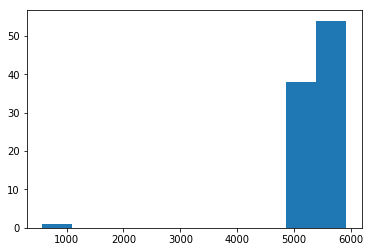

In [1777]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209759a4f60>,
 'caps': [<matplotlib.lines.Line2D at 0x20976da7208>,
 'boxes': [<matplotlib.lines.Line2D at 0x209759a4fd0>],
 'medians': [<matplotlib.lines.Line2D at 0x20976da76d8>],
 'fliers': [<matplotlib.lines.Line2D at 0x20974f3d358>],
 'means': []}

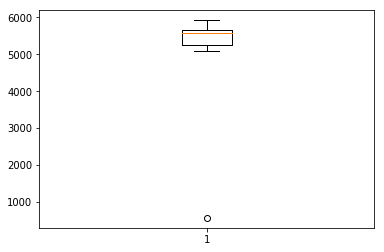

In [1778]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1779]:
TUITION_TO_MASS_SCHOOLS_5_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 2_000]
TUITION_TO_MASS_SCHOOLS_5_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
21109,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/12,41,2017-06-01,API,007792,20176381,186287,426670.00,NaN,565.88,nan,2308427.99,nan,nan,nan,5


In [1780]:
TUITION_TO_MASS_SCHOOLS_5_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 2_000]
TUITION_TO_MASS_SCHOOLS_5_standard['JOURNAL AMOUNT'].describe().T

count     92.00
mean    5452.97
std      225.79
min     5092.92
25%     5261.67
50%     5571.18
75%     5658.80
max     5925.00
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 6

In [1781]:
dept = 'TUITION TO MASS SCHOOLS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20706,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173244,420577.00,NaN,6224.68,nan,24333.48,nan,nan,nan,6
20707,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173245,420577.00,NaN,6224.68,nan,30558.16,nan,nan,nan,6
20708,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173246,420577.00,NaN,6224.68,nan,36782.84,nan,nan,nan,6
20709,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173247,420577.00,NaN,6224.68,nan,43007.52,nan,nan,nan,6
20710,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173248,420577.00,NaN,6224.68,nan,49232.20,nan,nan,nan,6
20711,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175246,173249,420577.00,NaN,6224.68,nan,55456.88,nan,nan,nan,6
20714,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173252,420577.00,NaN,6809.22,nan,72170.10,nan,nan,nan,6
20715,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173253,420577.00,NaN,6809.22,nan,78979.32,nan,nan,nan,6
20716,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175247,173254,420577.00,NaN,6809.22,nan,85788.54,nan,nan,nan,6
20724,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,7,2016-10-06,API,007792,20175249,173262,420577.00,NaN,6224.68,nan,125646.04,nan,nan,nan,6


In [1782]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    163.00
mean    6448.22
std      296.67
min     6099.84
25%     6190.20
50%     6224.68
75%     6809.22
max     6898.78
Name: JOURNAL AMOUNT, dtype: float64

In [1783]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6809.22    61
6190.20    41
6224.68    36
6190.00    12
6099.84     2
6225.84     2
6191.64     1
6700.35     1
6246.10     1
6633.90     1
6253.66     1
6898.78     1
6777.60     1
6438.72     1
6738.50     1
Name: JOURNAL AMOUNT, dtype: int64

(array([ 2., 94.,  0.,  0.,  1.,  0.,  1.,  2., 62.,  1.]),
 array([6099.84 , 6179.734, 6259.628, 6339.522, 6419.416, 6499.31 ,
        6579.204, 6659.098, 6738.992, 6818.886, 6898.78 ]),
 <a list of 10 Patch objects>)

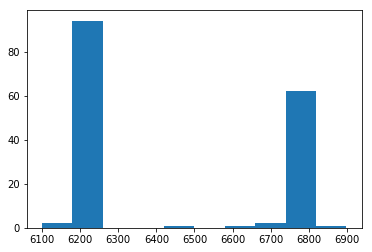

In [1784]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209754c0898>,
 'caps': [<matplotlib.lines.Line2D at 0x209770cb7b8>,
 'boxes': [<matplotlib.lines.Line2D at 0x209754c0160>],
 'medians': [<matplotlib.lines.Line2D at 0x209770cb9e8>],
 'fliers': [<matplotlib.lines.Line2D at 0x209770d0470>],
 'means': []}

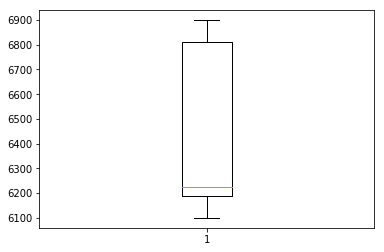

In [1785]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1786]:
TUITION_TO_MASS_SCHOOLS_6_outliers_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 6_200]
TUITION_TO_MASS_SCHOOLS_6_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20743,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173213,420577.00,NaN,6190.00,nan,256687.62,nan,nan,nan,6
20744,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173214,420577.00,NaN,6190.00,nan,262877.62,nan,nan,nan,6
20745,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173215,420577.00,NaN,6190.00,nan,269067.62,nan,nan,nan,6
20746,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173216,420577.00,NaN,6190.00,nan,275257.62,nan,nan,nan,6
20747,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173217,420577.00,NaN,6190.00,nan,281447.62,nan,nan,nan,6
20748,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173218,420577.00,NaN,6190.00,nan,287637.62,nan,nan,nan,6
20749,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173219,420577.00,NaN,6190.00,nan,293827.62,nan,nan,nan,6
20750,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173220,420577.00,NaN,6190.00,nan,300017.62,nan,nan,nan,6
20751,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173221,420577.00,NaN,6190.00,nan,306207.62,nan,nan,nan,6
20752,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,19,2016-10-16,API,007792,20175244,173222,420577.00,NaN,6190.00,nan,312397.62,nan,nan,nan,6


In [1787]:
TUITION_TO_MASS_SCHOOLS_6_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 6_400) & (first_digit_checks['JOURNAL AMOUNT'] < 6_800)]
TUITION_TO_MASS_SCHOOLS_6_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
20782,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 4,320,2016-10-25,API,023216,20175660,174757,421103.00,NaN,6438.72,nan,491169.22,nan,nan,nan,6
20872,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 6,263,2016-12-19,API,023568,20175403,177583,422596.00,NaN,6738.50,nan,999019.95,nan,nan,nan,6
20923,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 8,272,2017-02-15,API,023216,20175660,180386,423618.00,NaN,6777.60,nan,1311950.29,nan,nan,nan,6
20974,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,240,2017-03-15,API,001712,20175698,182088,424611.00,NaN,6700.35,nan,1634073.97,nan,nan,nan,6
20975,390902,01 -300-390-000-02-09-591006-,01,300,390,000,02,09,591006,,TUITION TO MASS SCHOOLS,17/ 9,240,2017-03-15,API,001712,20175698,182089,424611.00,NaN,6633.90,nan,1640707.87,nan,nan,nan,6


### Overall Department Statistics

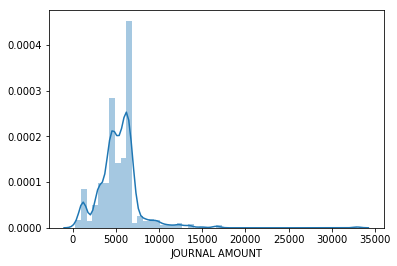

In [1788]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'TUITION TO MASS SCHOOLS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../tuition_to_mass_schools_journal_amounts.png')

In [1789]:
dept['JOURNAL AMOUNT'].describe()

count     541.00
mean     5346.03
std      2498.54
min       309.51
25%      4244.10
50%      5261.67
75%      6224.68
max     32928.00
Name: JOURNAL AMOUNT, dtype: float64

### `SPED OUTSIDE TRANSPORTATION`

#### `first_digit` = 2

In [1790]:
dept = 'SPED OUTSIDE TRANSPORTATION'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '2'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
16759,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023212,20165635,171895,419695.00,NaN,2030.00,nan,8965.00,nan,nan,nan,2
16763,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023572,20165733,171902,419787.00,NaN,2235.00,nan,15620.00,nan,nan,nan,2
16764,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,019685,20166635,171907,419784.00,NaN,2730.00,nan,18350.00,nan,nan,nan,2
16765,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,019685,20166635,171910,419784.00,NaN,2600.00,nan,20950.00,nan,nan,nan,2
16768,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,023212,20175170,172520,420031.00,NaN,2900.00,nan,29710.00,nan,nan,nan,2
16770,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,019401,20175087,172523,420098.00,NaN,240.00,nan,30675.00,nan,nan,nan,2
16772,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,002602,20175234,173057,420229.00,NaN,267.00,nan,35844.00,nan,nan,nan,2
16778,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,022165,20175342,173066,420318.00,NaN,2775.00,nan,51755.00,nan,nan,nan,2
16780,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,019685,20175169,173072,nan,NaN,2860.00,nan,56565.00,nan,nan,nan,2
16782,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,023212,20175163,173510,420419.00,NaN,2185.00,nan,57550.00,nan,nan,nan,2


In [1791]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    157.00
mean    2359.13
std      612.89
min      205.00
25%     2212.00
50%     2500.00
75%     2730.00
max     2975.00
Name: JOURNAL AMOUNT, dtype: float64

In [1792]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

2900.00    8
2730.00    6
2600.00    6
2700.00    5
2640.00    5
2030.00    4
2500.00    4
2465.00    4
2100.00    4
2520.00    4
2000.00    4
2400.00    4
2720.00    3
2805.00    3
2775.00    3
2145.00    3
2340.00    3
2755.00    2
2185.00    2
250.00     2
2160.00    2
2210.00    2
2590.00    2
2475.00    2
2860.00    2
2080.00    2
2844.00    2
2240.00    2
2850.00    2
2880.00    2
2310.00    2
2375.00    2
2300.00    2
2686.00    2
2470.00    2
2610.00    2
2565.00    2
2212.00    2
2415.00    2
269.10     1
2090.00    1
2560.00    1
2835.00    1
2795.00    1
2175.00    1
2050.00    1
270.00     1
2070.00    1
2970.00    1
290.00     1
2580.00    1
2394.00    1
2838.00    1
2200.00    1
220.00     1
267.00     1
240.00     1
2790.00    1
2040.00    1
2800.00    1
242.19     1
2235.00    1
2450.00    1
2244.00    1
2550.00    1
2295.00    1
2250.00    1
2430.00    1
2420.00    1
2535.00    1
2280.00    1
2365.00    1
2940.00    1
2750.00    1
2904.00    1
2376.00    1
2975.00    1

(array([10.,  0.,  0.,  0.,  0.,  0., 18., 40., 41., 48.]),
 array([ 205.,  482.,  759., 1036., 1313., 1590., 1867., 2144., 2421.,
        2698., 2975.]),
 <a list of 10 Patch objects>)

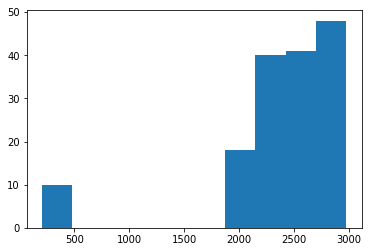

In [1793]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209754627f0>,
 'caps': [<matplotlib.lines.Line2D at 0x20976ed6c50>,
 'boxes': [<matplotlib.lines.Line2D at 0x20975462400>],
 'medians': [<matplotlib.lines.Line2D at 0x209771c6cc0>],
 'fliers': [<matplotlib.lines.Line2D at 0x209771c6da0>],
 'means': []}

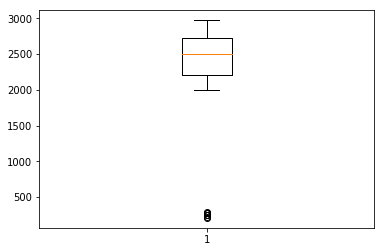

In [1794]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1795]:
SPED_OUTSIDE_TRANSPORTATION_2_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 500]
SPED_OUTSIDE_TRANSPORTATION_2_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
16770,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,019401,20175087,172523,420098.00,NaN,240.00,nan,30675.00,nan,nan,nan,2
16772,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,406,2016-09-29,API,002602,20175234,173057,420229.00,NaN,267.00,nan,35844.00,nan,nan,nan,2
16783,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,023212,20175164,173513,420419.00,NaN,220.00,nan,57770.00,nan,nan,nan,2
16829,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,311,2016-10-24,API,000932,20175550,174706,421177.00,NaN,290.00,nan,155517.00,nan,nan,nan,2
16834,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,311,2016-10-24,API,019685,20175535,174711,421190.00,NaN,250.00,nan,163862.00,nan,nan,nan,2
16865,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 5,88,2016-11-08,API,023212,20175539,175444,421475.00,NaN,250.00,nan,259365.00,nan,nan,nan,2
16868,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 5,88,2016-11-08,API,023212,20175424,175447,421475.00,NaN,270.00,nan,264550.00,nan,nan,nan,2
16894,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 6,91,2016-12-07,API,028535,20175833,177043,422173.00,NaN,242.19,nan,324287.19,nan,nan,nan,2
16895,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 6,91,2016-12-07,API,028535,20175833,177044,422173.00,NaN,269.10,nan,324556.29,nan,nan,nan,2
17139,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/10,64,2017-04-05,API,000932,20175175,183307,425132.00,NaN,205.00,nan,940715.13,nan,nan,nan,2


In [1796]:
SPED_OUTSIDE_TRANSPORTATION_2_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 500]
SPED_OUTSIDE_TRANSPORTATION_2_standard['JOURNAL AMOUNT'].describe().T

count    147.00
mean    2502.59
std      275.71
min     2000.00
25%     2267.50
50%     2520.00
75%     2730.00
max     2975.00
Name: JOURNAL AMOUNT, dtype: float64

#### `first_digit` = 3

In [1797]:
dept = 'SPED OUTSIDE TRANSPORTATION'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
16757,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023212,20165545,171891,419695.00,NaN,3710.00,nan,3710.00,nan,2596789.78,nan,3
16758,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,66,2016-09-07,API,023212,20165339,171892,419695.00,NaN,3225.00,nan,6935.00,nan,nan,nan,3
16766,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 3,230,2016-09-21,API,023212,20175164,172518,420031.00,NaN,3960.00,nan,24910.00,nan,nan,nan,3
16789,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,022165,20175342,173518,420510.00,NaN,3145.00,nan,70970.00,nan,nan,nan,3
16790,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,41,2016-10-05,API,015438,20175083,173519,420543.00,NaN,3325.00,nan,74295.00,nan,nan,nan,3
16799,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,000932,20175166,173918,420769.00,NaN,3325.00,nan,97980.00,nan,nan,nan,3
16804,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,000932,20175165,173923,420769.00,NaN,3040.00,nan,108785.00,nan,nan,nan,3
16806,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175180,173925,420774.00,NaN,300.00,nan,111485.00,nan,nan,nan,3
16807,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175176,173926,420774.00,NaN,300.00,nan,111785.00,nan,nan,nan,3
16816,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175174,173935,420774.00,NaN,3600.00,nan,125820.00,nan,nan,nan,3


In [1798]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    103.00
mean    3302.34
std      582.90
min      300.00
25%     3160.00
50%     3318.00
75%     3517.50
max     3990.00
Name: JOURNAL AMOUNT, dtype: float64

In [1799]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

3300.00    8
3465.00    5
3000.00    5
3318.00    4
3040.00    4
3160.00    4
3330.00    4
3045.00    3
3500.00    3
3780.00    3
3600.00    3
3700.00    3
3960.00    3
3325.00    3
3515.00    3
3895.00    3
3476.00    2
3240.00    2
3288.00    2
3204.00    2
3420.00    2
3225.00    2
3675.00    2
3870.00    2
3145.00    2
3510.00    2
300.00     2
3150.00    2
3280.00    1
3060.00    1
3135.00    1
3096.00    1
380.00     1
3120.00    1
3520.00    1
3900.00    1
3200.00    1
3705.00    1
3080.00    1
3267.00    1
3315.00    1
3570.00    1
3655.00    1
3990.00    1
3075.00    1
3710.00    1
Name: JOURNAL AMOUNT, dtype: int64

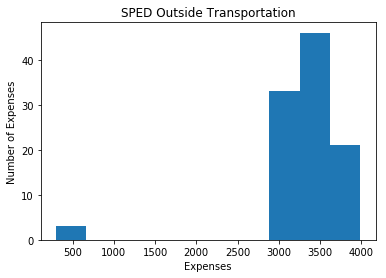

In [1800]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

plt.title('SPED Outside Transportation')
plt.xlabel('Expenses')
plt.ylabel('Number of Expenses')
plt.savefig('./SPED_Outside_Transportation_example.png')

{'whiskers': [<matplotlib.lines.Line2D at 0x20974ee38d0>,
 'caps': [<matplotlib.lines.Line2D at 0x20977192c18>,
 'boxes': [<matplotlib.lines.Line2D at 0x20974ee3160>],
 'medians': [<matplotlib.lines.Line2D at 0x20975479198>],
 'fliers': [<matplotlib.lines.Line2D at 0x20975479eb8>],
 'means': []}

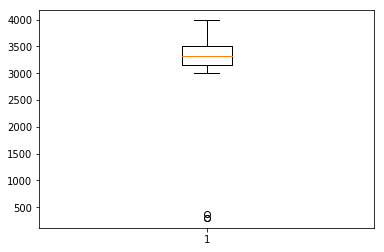

In [1801]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1802]:
SPED_OUTSIDE_TRANSPORTATION_3_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 1_000]
SPED_OUTSIDE_TRANSPORTATION_3_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
16806,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175180,173925,420774.00,NaN,300.00,nan,111485.00,nan,nan,nan,3
16807,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 4,132,2016-10-12,API,019401,20175176,173926,420774.00,NaN,300.00,nan,111785.00,nan,nan,nan,3
17076,330902,01 -300-330-000-02-09-533024-,01,300,330,000,02,09,533024,,SPED OUTSIDE TRANSPORTATION,17/ 9,83,2017-03-03,API,022165,20176089,181467,424358.00,NaN,380.00,nan,802327.79,nan,nan,nan,3


In [1803]:
SPED_OUTSIDE_TRANSPORTATION_3_standard = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 1_000]
SPED_OUTSIDE_TRANSPORTATION_3_standard['JOURNAL AMOUNT'].describe().T

count    100.00
mean    3391.61
std      271.39
min     3000.00
25%     3160.00
50%     3321.50
75%     3532.50
max     3990.00
Name: JOURNAL AMOUNT, dtype: float64

### Overall Department Statistics

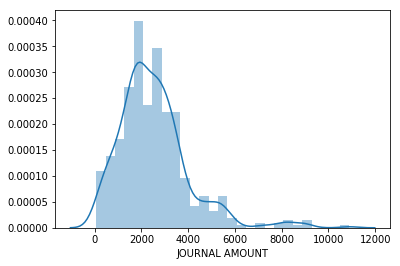

In [1804]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'SPED OUTSIDE TRANSPORTATION']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../sped_outside_transportation_journal_amounts.png')

In [1805]:
dept['JOURNAL AMOUNT'].describe()

count     525.00
mean     2526.08
std      1527.54
min        60.00
25%      1567.50
50%      2340.00
75%      3204.00
max     10880.00
Name: JOURNAL AMOUNT, dtype: float64

### `ASSISTANT PRINCIPALS`

#### `first_digit` = 2

In [1806]:
dept = 'ASSISTANT PRINCIPALS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '2'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
13180,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,2021.83,nan,2021.83,nan,106912.00,nan,2
13181,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,2021.83,nan,4043.66,nan,nan,nan,2
13182,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,2021.83,nan,6065.49,nan,nan,nan,2
13183,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,2021.83,nan,8087.32,nan,nan,nan,2
13184,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,2021.83,nan,10109.15,nan,nan,nan,2
13185,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,2021.83,nan,12130.98,nan,nan,nan,2
13186,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,2021.83,nan,14152.81,nan,nan,nan,2
13187,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,2021.83,nan,16174.64,nan,nan,nan,2
13188,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,2021.83,nan,18196.47,nan,nan,nan,2
13189,320108,01 -300-320-000-08-01-522111-,01,300,320,000,08,01,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,2021.83,nan,20218.30,nan,nan,nan,2


In [1807]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    318.00
mean    2045.47
std       47.57
min     2008.13
25%     2021.83
50%     2031.09
75%     2042.96
max     2300.88
Name: JOURNAL AMOUNT, dtype: float64

In [1808]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

2042.96    88
2021.83    88
2008.13    44
2031.09    44
2100.65    44
2255.77     9
2300.88     1
Name: JOURNAL AMOUNT, dtype: int64

(array([176.,  88.,   0.,  44.,   0.,   0.,   0.,   0.,   9.,   1.]),
 array([2008.13 , 2037.405, 2066.68 , 2095.955, 2125.23 , 2154.505,
        2183.78 , 2213.055, 2242.33 , 2271.605, 2300.88 ]),
 <a list of 10 Patch objects>)

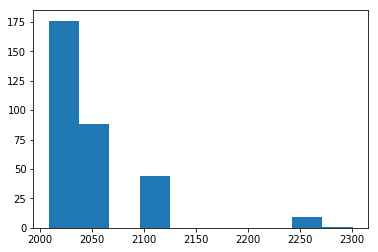

In [1809]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20974de8080>,
 'caps': [<matplotlib.lines.Line2D at 0x20990d89f28>,
 'boxes': [<matplotlib.lines.Line2D at 0x20974de8588>],
 'medians': [<matplotlib.lines.Line2D at 0x20990d89c18>],
 'fliers': [<matplotlib.lines.Line2D at 0x2097542cc50>],
 'means': []}

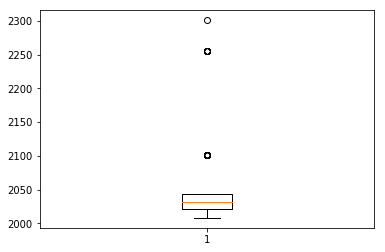

In [1810]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1811]:
ASSISTANT_PRINCIPALS_2_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] > 2_200)]
ASSISTANT_PRINCIPALS_2_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
15067,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,2255.77,nan,2255.77,nan,518993.53,nan,2
15068,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,2255.77,nan,4511.54,nan,nan,nan,2
15069,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,2255.77,nan,6767.31,nan,nan,nan,2
15070,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,2255.77,nan,9023.08,nan,nan,nan,2
15071,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,2255.77,nan,11278.85,nan,nan,nan,2
15072,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,2255.77,nan,13534.62,nan,nan,nan,2
15073,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,2255.77,nan,15790.39,nan,nan,nan,2
15117,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/12,449,2017-06-23,PRJ,170627,1170627,1170627,nan,NaN,2255.77,nan,433076.65,nan,nan,nan,2
15121,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/12,497,2017-06-30,PRJ,CITY,1170636,1170636,nan,NaN,2255.77,nan,517405.96,nan,nan,nan,2
15122,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/12,610,2017-06-30,PRJ,180706,1180706,1180706,nan,NaN,2300.88,nan,519706.84,nan,nan,nan,2


#### `first_digit` = 4

In [1812]:
dept = 'ASSISTANT PRINCIPALS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
202,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,4087.65,nan,4087.65,nan,216074.56,nan,4
203,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,4087.65,nan,8175.30,nan,nan,nan,4
204,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,4087.65,nan,12262.95,nan,nan,nan,4
205,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,4087.65,nan,16350.60,nan,nan,nan,4
206,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,4087.65,nan,20438.25,nan,nan,nan,4
207,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,4087.65,nan,24525.90,nan,nan,nan,4
208,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,4087.65,nan,28613.55,nan,nan,nan,4
209,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,4087.65,nan,32701.20,nan,nan,nan,4
210,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,4087.65,nan,36788.85,nan,nan,nan,4
211,321208,01 -000-300-001-30-00-522111-,01,000,300,001,30,00,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,4087.65,nan,40876.50,nan,nan,nan,4


In [1813]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    132.00
mean    4119.58
std       38.91
min     4087.65
25%     4087.65
50%     4096.96
75%     4174.13
max     4174.13
Name: JOURNAL AMOUNT, dtype: float64

In [1814]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4174.13    44
4087.65    44
4096.96    44
Name: JOURNAL AMOUNT, dtype: int64

(array([44., 44.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 44.]),
 array([4087.65 , 4096.298, 4104.946, 4113.594, 4122.242, 4130.89 ,
        4139.538, 4148.186, 4156.834, 4165.482, 4174.13 ]),
 <a list of 10 Patch objects>)

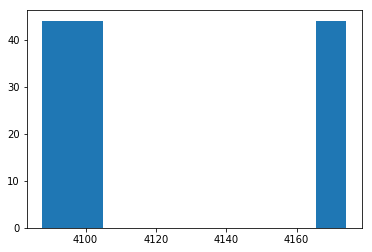

In [1815]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20984985a58>,
 'caps': [<matplotlib.lines.Line2D at 0x20979f03128>,
 'boxes': [<matplotlib.lines.Line2D at 0x20984985908>],
 'medians': [<matplotlib.lines.Line2D at 0x20979f037b8>],
 'fliers': [<matplotlib.lines.Line2D at 0x20979f03b00>],
 'means': []}

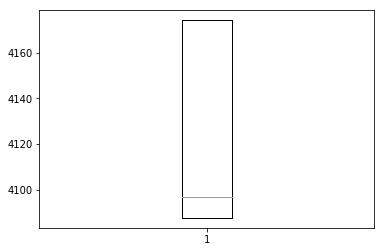

In [1816]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1817]:
ASSISTANT_PRINCIPALS_4_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] > 4_160]
ASSISTANT_PRINCIPALS_4_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
996,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,4174.13,nan,4174.13,nan,213824.00,nan,4
997,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,4174.13,nan,8348.26,nan,nan,nan,4
998,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,4174.13,nan,12522.39,nan,nan,nan,4
999,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,4174.13,nan,16696.52,nan,nan,nan,4
1000,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,4174.13,nan,20870.65,nan,nan,nan,4
1001,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 3,463,2016-09-30,PRJ,school,1170932,1170932,nan,NaN,4174.13,nan,25044.78,nan,nan,nan,4
1002,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,223,2016-10-07,PRJ,SCHOOL,1171005,1171005,nan,NaN,4174.13,nan,29218.91,nan,nan,nan,4
1003,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,294,2016-10-14,PRJ,SCHOOL,1171012,1171012,nan,NaN,4174.13,nan,33393.04,nan,nan,nan,4
1004,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,383,2016-10-21,PRJ,SCHOOL,1171020,1171020,nan,NaN,4174.13,nan,37567.17,nan,nan,nan,4
1005,321008,01 -000-300-001-70-00-522111-,01,000,300,001,70,00,522111,,ASSISTANT PRINCIPALS,17/ 4,410,2016-10-28,PRJ,SCHOOL,1171027,1171027,nan,NaN,4174.13,nan,41741.30,nan,nan,nan,4


### Overall Department Statistics

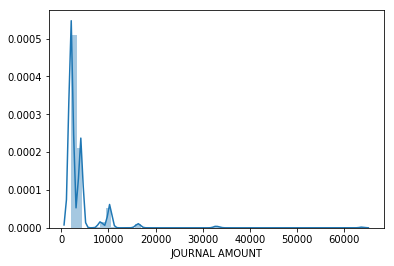

In [1818]:
dept = expenditures[expenditures['ACCOUNT DESC'] == 'ASSISTANT PRINCIPALS']
sns.distplot(dept['JOURNAL AMOUNT'])

plt.savefig('../assistant_principals_journal_amounts.png')

In [1819]:
dept['JOURNAL AMOUNT'].describe()

count     505.00
mean     3771.52
std      4426.15
min      2008.13
25%      2021.83
50%      2042.96
75%      4096.96
max     63732.59
Name: JOURNAL AMOUNT, dtype: float64

### `PRINCIPALS`

#### `first_digit` = 2

In [1820]:
dept = 'PRINCIPALS'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '2'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
96,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 1,173,2016-07-07,PRJ,SCHOOL,1170706,1170706,nan,NaN,2680.46,nan,2680.46,nan,142240.50,nan,2
97,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 1,176,2016-07-14,PRJ,SCHOOL,1170713,1170713,nan,NaN,2680.46,nan,5360.92,nan,nan,nan,2
98,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 1,179,2016-07-21,PRJ,SCHOOL,1170721,1170721,nan,NaN,2680.46,nan,8041.38,nan,nan,nan,2
99,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 1,182,2016-07-28,PRJ,SCHOOL,1170731,1170731,nan,NaN,2680.46,nan,10721.84,nan,nan,nan,2
100,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 2,114,2016-08-04,PRJ,SCHOOL,1170804,1170804,nan,NaN,2680.46,nan,13402.30,nan,nan,nan,2
101,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 2,119,2016-08-12,PRJ,SCHOOL,1170815,1170815,nan,NaN,2680.46,nan,16082.76,nan,nan,nan,2
102,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 2,211,2016-08-19,PRJ,SCHOOL,1170830,1170830,nan,NaN,2680.46,nan,18763.22,nan,nan,nan,2
103,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,2680.46,nan,21443.68,nan,nan,nan,2
104,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,2680.46,nan,24124.14,nan,nan,nan,2
105,321208,01 -000-300-001-30-00-522101-,01,000,300,001,30,00,522101,,PRINCIPALS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,2680.46,nan,26804.60,nan,nan,nan,2


In [1821]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    583.00
mean    2537.04
std      180.30
min     2269.23
25%     2353.85
50%     2489.85
75%     2680.46
max     2871.15
Name: JOURNAL AMOUNT, dtype: float64

In [1822]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

2353.85    53
2400.92    53
2489.85    52
2657.56    52
2300.88    52
2680.46    52
2469.23    52
2629.63    52
2814.87    52
2795.84    52
2307.69    52
2516.30     1
2871.15     1
2365.38     1
2734.08     1
2849.46     1
2269.23     1
2710.71     1
2679.92     1
2500.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([105.,  54.,  53., 105.,   1.,  52., 105.,   2.,  52.,  54.]),
 array([2269.23 , 2329.422, 2389.614, 2449.806, 2509.998, 2570.19 ,
        2630.382, 2690.574, 2750.766, 2810.958, 2871.15 ]),
 <a list of 10 Patch objects>)

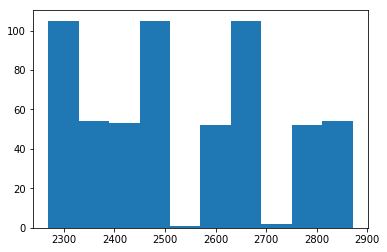

In [1823]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fc2e438>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fc2eb00>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fc2e2e8>],
 'medians': [<matplotlib.lines.Line2D at 0x2098fc251d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098fc25550>],
 'means': []}

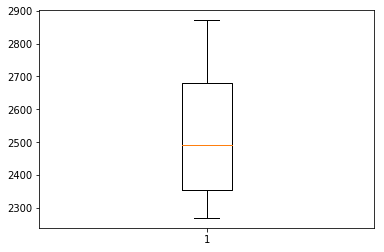

In [1824]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

### Say no outliers

## Below are additional checks on departments where outliers were repeatedly found in DBSCAN model iterations

### `PERMANENT SALARIES`

#### `first_digit` = 4

In [1825]:
dept = 'PERMANENT SALARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
2625,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 1,115,2016-07-20,PRJ,CITY,0170715,0170715,nan,NaN,4531.90,nan,8046.84,nan,nan,nan,4
2626,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 1,128,2016-07-27,PRJ,CITY,0170724,0170724,nan,NaN,4531.90,nan,12578.74,nan,nan,nan,4
2627,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 2,10,2016-08-03,PRJ,CITY,0170801,0170801,nan,NaN,4531.90,nan,17110.64,nan,nan,nan,4
2628,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 2,68,2016-08-10,PRJ,CITY,0170810,0170810,nan,NaN,4723.90,nan,21834.54,nan,nan,nan,4
2629,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 2,125,2016-08-17,PRJ,CITY,0170821,0170821,nan,NaN,4627.90,nan,26462.44,nan,nan,nan,4
2630,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 2,214,2016-08-24,PRJ,CITY,0170826,0170826,nan,NaN,4627.90,nan,31090.34,nan,nan,nan,4
2631,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 2,229,2016-08-31,PRJ,CITY,0170834,0170834,nan,NaN,4531.90,nan,35622.24,nan,nan,nan,4
2632,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 3,53,2016-09-07,PRJ,CITY,0170903,0170903,nan,NaN,4531.89,nan,40154.13,nan,nan,nan,4
2633,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 3,183,2016-09-14,PRJ,CITY,0170913,0170913,nan,NaN,4627.90,nan,44782.03,nan,nan,nan,4
2634,11351,01 -100-135-100-00-00-510100-,01,100,135,100,00,00,510100,,PERMANENT SALARIES,17/ 3,302,2016-09-21,PRJ,CITY,0170921,0170921,nan,NaN,4675.90,nan,49457.93,nan,nan,nan,4


In [1826]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     324.00
mean     5398.80
std      8227.71
min        40.00
25%      4132.22
50%      4210.23
75%      4642.89
max     48048.00
Name: JOURNAL AMOUNT, dtype: float64

In [1827]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

4210.23     44
4642.90     27
4416.85     22
4132.22     16
4132.23     14
4531.90     13
4147.07     11
4718.42     11
4811.49     11
466.68      10
4230.55      9
459.59       9
4811.50      6
456.54       6
4099.20      4
4032.13      4
4117.57      4
4627.90      3
4642.89      3
4484.82      3
400.00       3
4347.10      3
40.00        3
4210.04      2
4784.24      2
4210.24      2
4784.25      2
4024.08      2
4905.62      2
473.26       2
4312.88      1
43593.00     1
405.00       1
472.05       1
463.12       1
420.36       1
4579.90      1
4295.93      1
4230.54      1
4032.14      1
47663.00     1
4132.21      1
427.86       1
407.26       1
41261.00     1
4086.10      1
4087.32      1
4966.56      1
4531.89      1
432.81       1
466.69       1
457.03       1
4153.07      1
464.54       1
486.33       1
4561.61      1
4464.65      1
457.61       1
4204.85      1
4097.96      1
4617.49      1
448.59       1
4569.89      1
41096.00     1
43795.97     1
4334.36      1
4811.48   

(array([308.,   3.,   0.,   0.,   0.,   0.,   0.,   0.,   4.,   9.]),
 array([4.00000e+01, 4.84080e+03, 9.64160e+03, 1.44424e+04, 1.92432e+04,
        2.40440e+04, 2.88448e+04, 3.36456e+04, 3.84464e+04, 4.32472e+04,
        4.80480e+04]),
 <a list of 10 Patch objects>)

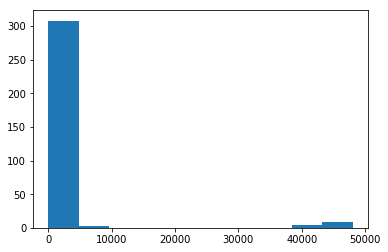

In [1828]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fd04358>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fd04a20>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fd04208>],
 'medians': [<matplotlib.lines.Line2D at 0x2098fd0f0f0>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098fd0f438>],
 'means': []}

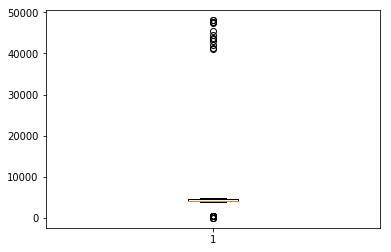

In [1829]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1830]:
PERMANENT_SALARIES_4_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 500)]
PERMANENT_SALARIES_4_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,50.00,20234.98,11329.04,11711.00,12668.50,18071.00,21963.50,89220.00
JNL,50.00,290.82,128.36,21.00,185.50,304.50,382.00,610.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,50.00,430.66,102.04,40.00,456.54,459.59,466.68,495.35
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,50.00,47085.53,89905.76,448.59,2497.86,6000.00,28692.72,426788.58
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,4.00,192106.02,281546.20,0.00,4489.55,84783.89,272400.36,598856.31
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1831]:
PERMANENT_SALARIES_4_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 40_000) & (first_digit_checks['JOURNAL AMOUNT'] < 50_000)]
PERMANENT_SALARIES_4_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,13.00,67245.69,34447.94,12101.00,23501.00,89210.00,89210.00,89210.00
JNL,13.00,156.85,169.33,11.00,24.00,77.00,300.00,539.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,13.00,44878.72,2637.32,41096.00,42973.00,44500.00,47509.00,48048.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,13.00,712456.47,660216.08,65329.00,112992.00,571835.00,1107447.00,2108654.00
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1832]:
PERMANENT_SALARIES_4_standard = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 4_000) & (first_digit_checks['JOURNAL AMOUNT'] < 5_000)]
PERMANENT_SALARIES_4_standard.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,261.00,13432.26,2972.72,11351.00,11411.00,11611.00,15411.00,27091.00
JNL,261.00,246.02,141.51,10.00,128.00,260.00,360.00,610.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,261.00,4384.12,249.08,4024.08,4147.07,4300.59,4642.90,4966.56
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,261.00,114073.65,79544.96,3316.78,43871.79,108717.34,176300.68,610958.84
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,404833.00,nan,404833.00,404833.00,404833.00,404833.00,404833.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 5

In [1833]:
dept = 'PERMANENT SALARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1630,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 1,120,2016-07-25,PRJ,CITY,0170728,0170728,nan,NaN,500.00,nan,500.00,nan,6000.00,nan,5
1631,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 2,134,2016-08-22,PRJ,MNTHLY,0170823,0170823,nan,NaN,500.00,nan,1000.00,nan,nan,nan,5
1632,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 3,351,2016-09-26,PRJ,CITY,0170931,0170931,nan,NaN,500.00,nan,1500.00,nan,nan,nan,5
1633,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 4,279,2016-10-24,PRJ,CITY,0171019,0171019,nan,NaN,500.00,nan,2000.00,nan,nan,nan,5
1634,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 5,318,2016-11-28,PRJ,CITY,0171128,0171128,nan,NaN,500.00,nan,2500.00,nan,nan,nan,5
1635,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 6,304,2016-12-19,PRJ,CITY,0171227,0171227,nan,NaN,500.00,nan,3000.00,nan,nan,nan,5
1636,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 7,305,2017-01-23,PRJ,CITY,0170127,0170127,nan,NaN,500.00,nan,3500.00,nan,nan,nan,5
1637,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 8,458,2017-02-27,PRJ,CITY,0170225,0170225,nan,NaN,500.00,nan,4000.00,nan,nan,nan,5
1638,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/ 9,379,2017-03-27,PRJ,CITY,0170332,0170332,nan,NaN,500.00,nan,4500.00,nan,nan,nan,5
1639,11221,01 -100-122-100-00-00-510100-,01,100,122,100,00,00,510100,,PERMANENT SALARIES,17/10,420,2017-04-24,PRJ,CITY,0170428,0170428,nan,NaN,500.00,nan,5000.00,nan,nan,nan,5


In [1834]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     239.00
mean     5058.81
std     10871.62
min        55.00
25%       576.06
50%       596.00
75%      5081.30
max     57024.00
Name: JOURNAL AMOUNT, dtype: float64

In [1835]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

576.06      42
5081.30     35
5003.80     26
500.00      23
5436.02     12
585.00      11
560.73       9
590.00       7
5003.81      6
533.36       5
5243.42      4
595.88       3
5103.30      3
51480.00     2
5081.41      2
501.19       2
533.35       2
50916.00     1
550.00       1
552.13       1
5807.28      1
54560.00     1
5388.39      1
5993.78      1
519.68       1
507.29       1
56309.00     1
55242.00     1
5535.90      1
512.00       1
552.14       1
596.00       1
5875.80      1
5774.26      1
55.00        1
5729.43      1
5079.60      1
5679.60      1
5011.70      1
5809.98      1
53262.00     1
5825.18      1
5632.26      1
5629.38      1
5508.62      1
527.15       1
5125.08      1
589.99       1
590.01       1
533.25       1
560.16       1
5651.90      1
599.04       1
57024.00     1
5663.44      1
529.00       1
5540.43      1
561.11       1
54230.00     1
577.48       1
51397.50     1
50506.00     1
Name: JOURNAL AMOUNT, dtype: int64

(array([222.,   6.,   0.,   0.,   0.,   0.,   0.,   0.,   2.,   9.]),
 array([5.50000e+01, 5.75190e+03, 1.14488e+04, 1.71457e+04, 2.28426e+04,
        2.85395e+04, 3.42364e+04, 3.99333e+04, 4.56302e+04, 5.13271e+04,
        5.70240e+04]),
 <a list of 10 Patch objects>)

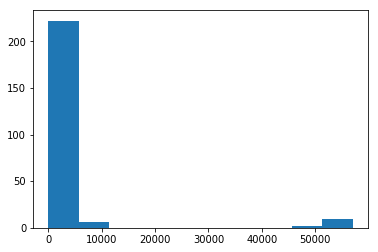

In [1836]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fdbdc18>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fdc7358>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fdbdb00>],
 'medians': [<matplotlib.lines.Line2D at 0x2098fdc79e8>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098fdc7d30>],
 'means': []}

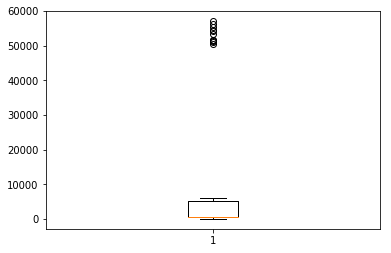

In [1837]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1838]:
PERMANENT_SALARIES_5_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 50_000) & (first_digit_checks['JOURNAL AMOUNT'] < 60_000)]
PERMANENT_SALARIES_5_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,11.00,77262.00,26585.09,23491.00,89210.00,89210.00,89210.00,89220.00
JNL,11.00,223.00,169.31,11.00,99.00,217.00,306.00,539.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,11.00,53309.68,2299.58,50506.00,51438.75,53262.00,54901.00,57024.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,11.00,835706.18,750652.47,51480.00,326147.00,463650.00,1252278.50,2159570.00
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,0.00,nan,0.00,0.00,0.00,0.00,0.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1839]:
PERMANENT_SALARIES_5_standard_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 5_000) & (first_digit_checks['JOURNAL AMOUNT'] < 6_000)]
PERMANENT_SALARIES_5_standard_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,107.00,15544.18,2867.38,11511.00,11511.00,17491.00,17681.00,23491.00
JNL,107.00,297.34,129.91,11.00,223.00,307.00,405.50,512.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,107.00,5195.40,251.76,5003.80,5003.81,5081.30,5412.20,5993.78
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,107.00,145157.98,75315.43,5125.08,92139.88,144004.33,199290.21,418491.50
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,3.00,336791.33,232117.92,68984.00,265145.00,461306.00,470695.00,480084.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1840]:
PERMANENT_SALARIES_5_standard_b = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] < 70]
PERMANENT_SALARIES_5_standard_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,1.00,23501.00,nan,23501.00,23501.00,23501.00,23501.00,23501.00
JNL,1.00,11.00,nan,11.00,11.00,11.00,11.00,11.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,1.00,55.00,nan,55.00,55.00,55.00,55.00,55.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,1.00,62975.50,nan,62975.50,62975.50,62975.50,62975.50,62975.50
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [1841]:
dept = 'PERMANENT SALARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1471,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 1,67,2016-07-13,PRJ,CITY,0170704,0170704,nan,NaN,6099.45,nan,6099.45,nan,369686.00,nan,6
1670,11251,01 -100-125-100-00-00-510100-,01,100,125,100,00,00,510100,,PERMANENT SALARIES,17/ 1,67,2016-07-13,PRJ,CITY,0170704,0170704,nan,NaN,629.85,nan,629.85,nan,154439.00,nan,6
2981,11381,01 -100-138-100-00-00-510100-,01,100,138,100,00,00,510100,,PERMANENT SALARIES,17/12,412,2017-06-28,PRJ,170630,0170630,0170630,nan,NaN,684.00,nan,106926.43,nan,nan,nan,6
5549,11621,01 -100-162-100-00-00-510100-,01,100,162,100,00,00,510100,,PERMANENT SALARIES,17/ 4,424,2016-10-31,GEN,FY2017,ELECTION,POLLWORKERS,nan,NaN,6746.50,nan,48113.18,nan,nan,nan,6
5977,11711,01 -100-171-100-00-00-510100-,01,100,171,100,00,00,510100,,PERMANENT SALARIES,17/ 2,80,2016-08-05,PRJ,CITY,0170819,0170819,nan,NaN,66.67,nan,600.02,nan,nan,nan,6
6009,11811,01 -100-181-100-00-00-510100-,01,100,181,100,00,00,510100,,PERMANENT SALARIES,17/ 1,120,2016-07-25,PRJ,CITY,0170728,0170728,nan,NaN,66.67,nan,1059.81,nan,nan,nan,6
6013,11811,01 -100-181-100-00-00-510100-,01,100,181,100,00,00,510100,,PERMANENT SALARIES,17/ 2,134,2016-08-22,PRJ,MNTHLY,0170823,0170823,nan,NaN,66.67,nan,662.55,nan,nan,nan,6
6015,11811,01 -100-181-100-00-00-510100-,01,100,181,100,00,00,510100,,PERMANENT SALARIES,17/ 4,279,2016-10-24,PRJ,CITY,0171019,0171019,nan,NaN,66.67,nan,66.67,nan,nan,nan,6
6017,11811,01 -100-181-100-00-00-510100-,01,100,181,100,00,00,510100,,PERMANENT SALARIES,17/ 5,318,2016-11-28,PRJ,CITY,0171128,0171128,nan,NaN,66.67,nan,66.67,nan,nan,nan,6
6019,11811,01 -100-181-100-00-00-510100-,01,100,181,100,00,00,510100,,PERMANENT SALARIES,17/ 7,305,2017-01-23,PRJ,CITY,0170127,0170127,nan,NaN,66.67,nan,66.67,nan,nan,nan,6


In [1842]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     231.00
mean     5964.42
std      8857.18
min        60.00
25%       672.96
50%      6165.42
75%      6848.45
max     65406.00
Name: JOURNAL AMOUNT, dtype: float64

In [1843]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

6961.06     35
6165.42     25
6165.41     22
66.67       10
616.64       8
6426.00      8
6961.05      8
638.65       5
600.03       5
639.03       3
6165.43      2
672.27       2
6165.40      2
63.94        2
671.45       2
6961.04      1
6176.50      1
639.41       1
6638.32      1
6961.03      1
6698.94      1
6469.86      1
634.85       1
60676.00     1
6746.50      1
672.80       1
6644.95      1
662.55       1
673.37       1
6271.27      1
6243.61      1
619.44       1
693.61       1
670.63       1
63.00        1
66.00        1
630.29       1
6469.56      1
682.00       1
60.00        1
680.00       1
6088.00      1
619.14       1
6727.45      1
686.65       1
662.78       1
6767.32      1
6853.76      1
6540.25      1
6201.53      1
6183.81      1
61435.00     1
6276.91      1
6056.12      1
6792.98      1
696.04       1
6945.31      1
6870.88      1
6803.02      1
660.87       1
6740.05      1
6824.84      1
6200.29      1
656.27       1
6295.74      1
639.85       1
65406.00  

(array([158.,  68.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   5.]),
 array([6.00000e+01, 6.59460e+03, 1.31292e+04, 1.96638e+04, 2.61984e+04,
        3.27330e+04, 3.92676e+04, 4.58022e+04, 5.23368e+04, 5.88714e+04,
        6.54060e+04]),
 <a list of 10 Patch objects>)

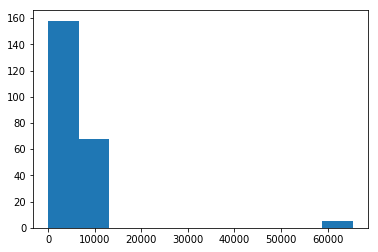

In [1844]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098fe92c88>,
 'caps': [<matplotlib.lines.Line2D at 0x2098fe9d390>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098fe92b38>],
 'medians': [<matplotlib.lines.Line2D at 0x2098fe9da20>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098fe9dd68>],
 'means': []}

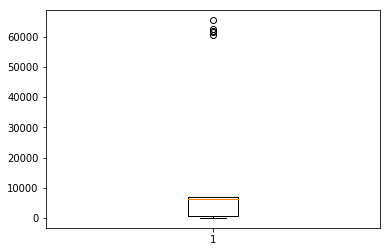

In [1845]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1846]:
PERMANENT_SALARIES_6_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 60_000) & (first_digit_checks['JOURNAL AMOUNT'] < 70_000)]
PERMANENT_SALARIES_6_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,5.00,89210.00,0.00,89210.00,89210.00,89210.00,89210.00,89210.00
JNL,5.00,284.60,126.01,101.00,233.00,314.00,337.00,438.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,5.00,62427.20,1816.06,60676.00,61435.00,61963.00,62656.00,65406.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,5.00,1171987.40,635455.91,524326.00,915805.00,1025948.00,1168882.00,2224976.00
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1847]:
PERMANENT_SALARIES_6_standard_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 6_000) & (first_digit_checks['JOURNAL AMOUNT'] < 7_000)]
PERMANENT_SALARIES_6_standard_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,158.00,19750.98,47935.78,11211.00,12411.00,15221.00,16101.00,604301.00
JNL,158.00,223.82,126.60,10.00,125.75,226.00,310.25,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,158.00,6521.79,353.01,6011.12,6165.42,6426.00,6961.05,6961.06
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,158.00,166078.12,116361.62,6099.45,60516.46,156301.67,256840.42,796469.54
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,3.00,123228.67,213438.31,0.00,0.00,0.00,184843.00,369686.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1848]:
PERMANENT_SALARIES_6_standard_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 6_000) & (first_digit_checks['JOURNAL AMOUNT'] < 7_000)]
PERMANENT_SALARIES_6_standard_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,158.00,19750.98,47935.78,11211.00,12411.00,15221.00,16101.00,604301.00
JNL,158.00,223.82,126.60,10.00,125.75,226.00,310.25,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,158.00,6521.79,353.01,6011.12,6165.42,6426.00,6961.05,6961.06
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,158.00,166078.12,116361.62,6099.45,60516.46,156301.67,256840.42,796469.54
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,3.00,123228.67,213438.31,0.00,0.00,0.00,184843.00,369686.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 8

In [1849]:
dept = 'PERMANENT SALARIES'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '8'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1481,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 3,302,2016-09-21,PRJ,CITY,0170921,0170921,nan,NaN,8029.45,nan,85993.95,nan,nan,nan,8
1482,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 3,365,2016-09-28,PRJ,CITY,0170927,0170927,nan,NaN,8069.45,nan,94063.40,nan,nan,nan,8
1483,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 4,23,2016-10-05,PRJ,CITY,0171001,0171001,nan,NaN,8074.45,nan,102137.85,nan,nan,nan,8
1484,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 4,226,2016-10-12,PRJ,CITY,0171008,0171008,nan,NaN,8069.45,nan,110207.30,nan,nan,nan,8
1486,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 4,334,2016-10-26,PRJ,CITY,0171022,0171022,nan,NaN,8074.45,nan,126281.20,nan,nan,nan,8
1487,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 5,21,2016-11-02,PRJ,CITY,0171101,0171101,nan,NaN,8074.45,nan,134355.65,nan,nan,nan,8
1488,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 5,98,2016-11-09,PRJ,CITY,0171109,0171109,nan,NaN,8079.46,nan,142435.11,nan,nan,nan,8
1489,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 5,196,2016-11-16,PRJ,CITY,0171117,0171117,nan,NaN,8074.46,nan,150509.57,nan,nan,nan,8
1491,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 5,311,2016-11-30,PRJ,CITY,0171131,0171131,nan,NaN,8144.45,nan,166578.47,nan,nan,nan,8
1493,11211,01 -100-121-100-00-00-510100-,01,100,121,100,00,00,510100,,PERMANENT SALARIES,17/ 6,147,2016-12-14,PRJ,CITY,0171216,0171216,nan,NaN,8029.45,nan,182557.37,nan,nan,nan,8


In [1850]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count    243.00
mean    3138.58
std     3482.42
min        8.00
25%      812.18
50%      865.37
75%     8076.96
max     8678.82
Name: JOURNAL AMOUNT, dtype: float64

In [1851]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

812.08     48
865.37     38
8502.65    24
820.87     24
833.33     12
817.15      9
882.60      7
8105.45     6
86.30       5
8074.45     4
8502.64     4
812.09      3
8017.45     3
8083.48     3
8193.45     3
8029.45     2
8069.45     2
8502.66     2
817.16      2
839.16      1
8110.95     1
812.27      1
882.61      1
8144.45     1
80.00       1
8165.95     1
824.74      1
8284.75     1
812.94      1
88.00       1
8198.95     1
8059.45     1
8074.46     1
865.15      1
8002.15     1
840.55      1
8182.45     1
8091.70     1
8678.82     1
8094.45     1
8099.95     1
8588.77     1
897.60      1
820.86      1
811.50      1
8095.39     1
855.60      1
8185.20     1
815.99      1
836.33      1
8502.73     1
8315.00     1
8079.46     1
800.04      1
8204.45     1
8105.44     1
836.86      1
8116.45     1
814.02      1
8061.45     1
8.00        1
Name: JOURNAL AMOUNT, dtype: int64

(array([158.,   9.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  76.]),
 array([8.000000e+00, 8.750820e+02, 1.742164e+03, 2.609246e+03,
        3.476328e+03, 4.343410e+03, 5.210492e+03, 6.077574e+03,
        6.944656e+03, 7.811738e+03, 8.678820e+03]),
 <a list of 10 Patch objects>)

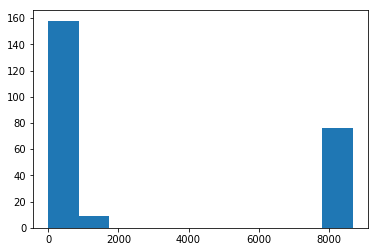

In [1852]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2098ff6f860>,
 'caps': [<matplotlib.lines.Line2D at 0x2098ff6ff28>,
 'boxes': [<matplotlib.lines.Line2D at 0x2098ff6f710>],
 'medians': [<matplotlib.lines.Line2D at 0x2098ff7a5f8>],
 'fliers': [<matplotlib.lines.Line2D at 0x2098ff7a940>],
 'means': []}

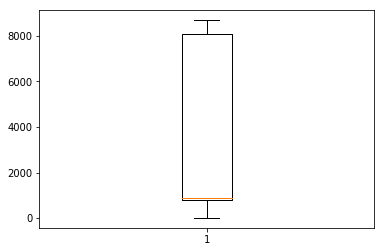

In [1853]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1854]:
PERMANENT_SALARIES_8_standard_a = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] >= 8_000]
PERMANENT_SALARIES_8_standard_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,76.00,14215.33,9011.31,11211.00,11211.00,12101.00,15211.00,89220.00
JNL,76.00,242.66,133.08,11.00,138.00,264.50,347.00,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,76.00,8283.34,207.95,8002.15,8089.64,8193.45,8502.65,8678.82
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,76.00,257589.44,148093.60,8502.73,160458.32,251734.83,334537.58,1074886.81
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,2.00,649706.53,17012.32,637677.00,643691.76,649706.53,655721.29,661736.05
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1855]:
PERMANENT_SALARIES_8_standard_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 800) & (first_digit_checks['JOURNAL AMOUNT'] < 900)]
PERMANENT_SALARIES_8_standard_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,159.00,23036.72,46894.96,11251.00,11251.00,25111.00,25161.00,604301.00
JNL,159.00,245.69,131.57,10.00,133.00,264.00,349.00,496.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,159.00,833.55,24.80,800.04,812.08,820.87,865.37,897.60
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,159.00,41008.95,82354.25,1441.93,14979.90,25804.36,36399.78,887103.05
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1856]:
PERMANENT_SALARIES_8_outliers = first_digit_checks[first_digit_checks['JOURNAL AMOUNT'] <= 80]
PERMANENT_SALARIES_8_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,2.00,17441.00,8570.13,11381.00,14411.00,17441.00,20471.00,23501.00
JNL,2.00,609.00,308.30,391.00,500.00,609.00,718.00,827.00
CHECK #,0.00,nan,nan,nan,nan,nan,nan,nan
JOURNAL AMOUNT,2.00,44.00,50.91,8.00,26.00,44.00,62.00,80.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,2.00,109069.15,59.86,109026.82,109047.98,109069.15,109090.31,109111.47
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


### `BUILDING MAINTENANCE & REPAIR`

#### `first_digit` = 4

In [1857]:
dept = 'BUILDING MAINTENANCE & REPAIR'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '4'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
7613,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 7,331,2017-01-26,API,024363,20171259,179562,423310.00,B,495.00,nan,36868.43,nan,nan,nan,4
9258,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 2,165,2016-08-23,API,012422,20170206,171232,419464.00,NaN,40.00,nan,5457.08,nan,nan,nan,4
9259,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 2,165,2016-08-23,API,012422,20170206,171233,419464.00,NaN,40.00,nan,5497.08,nan,nan,nan,4
9260,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 2,165,2016-08-23,API,012422,20170206,171234,419464.00,NaN,40.00,nan,5537.08,nan,nan,nan,4
9264,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,20,2016-09-01,API,012326,20170356,171605,419563.00,NaN,49.90,nan,6941.04,nan,nan,nan,4
9287,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,143,2016-09-15,API,012422,20170206,172157,420026.00,NaN,40.00,nan,7987.68,nan,nan,nan,4
9288,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,143,2016-09-15,API,012422,20170206,172158,420026.00,NaN,40.00,nan,8027.68,nan,nan,nan,4
9289,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,143,2016-09-15,API,012422,20170206,172159,420026.00,NaN,40.00,nan,8067.68,nan,nan,nan,4
9293,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,205,2016-09-15,API,019601,20170187,172403,419939.00,NaN,4.25,nan,8917.12,nan,nan,nan,4
9299,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 4,82,2016-10-11,API,012422,20170206,173718,420857.00,NaN,40.00,nan,11646.19,nan,nan,nan,4


In [1858]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     65.00
mean     447.31
std     1198.41
min        4.25
25%       40.00
50%       40.00
75%       43.50
max     4880.00
Name: JOURNAL AMOUNT, dtype: float64

In [1859]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

40.00      35
43.50      11
425.00      2
4.25        2
469.00      2
440.00      2
430.00      1
480.00      1
4880.00     1
4031.50     1
4353.82     1
4850.00     1
49.90       1
445.80      1
4.30        1
4500.00     1
495.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([59.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  3.]),
 array([4.250000e+00, 4.918250e+02, 9.794000e+02, 1.466975e+03,
        1.954550e+03, 2.442125e+03, 2.929700e+03, 3.417275e+03,
        3.904850e+03, 4.392425e+03, 4.880000e+03]),
 <a list of 10 Patch objects>)

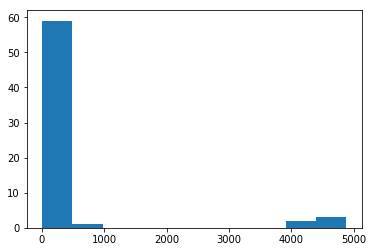

In [1860]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20990042550>,
 'caps': [<matplotlib.lines.Line2D at 0x20990042c18>,
 'boxes': [<matplotlib.lines.Line2D at 0x20990042400>],
 'medians': [<matplotlib.lines.Line2D at 0x2099004e2e8>],
 'fliers': [<matplotlib.lines.Line2D at 0x2099004e630>],
 'means': []}

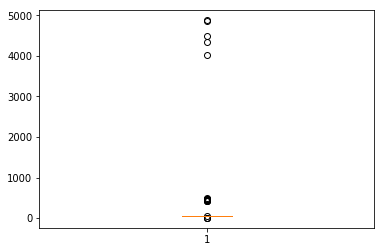

In [1861]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1862]:
BUILDING_MAINTENANCE_REPAIR_4_standard = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 100)]
BUILDING_MAINTENANCE_REPAIR_4_standard.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,50.00,118860.00,229749.34,12202.00,12202.00,12202.00,12202.00,604302.00
JNL,50.00,170.94,70.35,20.00,113.00,161.00,230.00,372.00
CHECK #,50.00,423211.00,2494.73,419464.00,420865.00,423015.00,425402.00,426985.00
JOURNAL AMOUNT,50.00,38.82,9.03,4.25,40.00,40.00,40.00,49.90
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,50.00,29935.78,18738.58,1794.57,11865.79,30037.00,49516.08,61343.19
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1863]:
BUILDING_MAINTENANCE_REPAIR_4_outliers_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 4_000) & (first_digit_checks['JOURNAL AMOUNT'] < 5_000)]
BUILDING_MAINTENANCE_REPAIR_4_outliers_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,5.00,13822.00,849.71,12302.00,14202.00,14202.00,14202.00,14202.00
JNL,5.00,180.40,138.27,18.00,49.00,240.00,267.00,328.00
CHECK #,5.00,424364.80,1581.37,422525.00,423170.00,424207.00,425774.00,426148.00
JOURNAL AMOUNT,5.00,4523.06,355.35,4031.50,4353.82,4500.00,4850.00,4880.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,5.00,58573.71,38370.41,4031.50,42961.56,56418.82,89648.82,99807.87
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,0.00,nan,0.00,0.00,0.00,0.00,0.00
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1864]:
BUILDING_MAINTENANCE_REPAIR_4_outliers_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 400) & (first_digit_checks['JOURNAL AMOUNT'] < 1_000)]
BUILDING_MAINTENANCE_REPAIR_4_outliers_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,10.00,250222.00,304745.00,12102.00,14202.00,15152.00,604302.00,604302.00
JNL,10.00,164.60,117.69,22.00,36.25,227.00,242.00,331.00
CHECK #,10.00,422851.70,2503.06,419641.00,420298.75,423369.00,424515.00,426618.00
JOURNAL AMOUNT,10.00,451.88,24.67,425.00,432.50,442.90,469.00,495.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,10.00,27599.00,28582.82,425.00,1802.70,21743.44,46714.49,77816.29
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,178990.35,nan,178990.35,178990.35,178990.35,178990.35,178990.35
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 5

In [1865]:
dept = 'BUILDING MAINTENANCE & REPAIR'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '5'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
7582,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,96,2016-09-08,API,025443,20170504,172104,419822.00,NaN,500.00,nan,3157.10,nan,nan,nan,5
7583,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,96,2016-09-08,API,025443,20170504,172105,419822.00,NaN,500.00,nan,3657.10,nan,nan,nan,5
7584,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,96,2016-09-08,API,025443,20170504,172106,419822.00,NaN,500.00,nan,4157.10,nan,nan,nan,5
7591,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,253,2016-09-20,API,025443,20170504,172559,420124.00,NaN,500.00,nan,12325.09,nan,nan,nan,5
7594,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 4,255,2016-10-20,API,025443,20170504,174512,420999.00,NaN,500.00,nan,15992.42,nan,nan,nan,5
7600,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 5,80,2016-11-07,API,025443,20170504,175401,421590.00,NaN,500.00,nan,24104.75,nan,nan,nan,5
7608,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 6,121,2016-12-08,API,025443,20170504,177185,422259.00,NaN,500.00,nan,32675.58,nan,nan,nan,5
7612,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 7,304,2017-01-24,API,025443,20170504,179334,423322.00,B,500.00,nan,36373.43,nan,nan,nan,5
7616,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 8,243,2017-02-13,API,025443,20170504,180249,423734.00,B,500.00,nan,42697.43,nan,nan,nan,5
7620,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 9,190,2017-03-09,API,025443,20170504,181862,424418.00,B,500.00,nan,44299.76,nan,nan,nan,5


In [1866]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     63.00
mean     453.66
std      949.43
min        5.00
25%        5.00
50%      500.00
75%      512.68
max     5795.00
Name: JOURNAL AMOUNT, dtype: float64

In [1867]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

5.00       20
500.00     12
510.00      2
517.71      1
580.00      1
54.75       1
597.34      1
509.91      1
596.00      1
575.00      1
52.72       1
565.00      1
519.86      1
516.48      1
5.18        1
508.69      1
59.91       1
53.55       1
522.80      1
503.90      1
55.31       1
513.58      1
55.68       1
511.78      1
517.65      1
508.80      1
522.38      1
539.69      1
59.65       1
5795.00     1
513.85      1
5128.20     1
Name: JOURNAL AMOUNT, dtype: int64

(array([59.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.]),
 array([5.000e+00, 5.840e+02, 1.163e+03, 1.742e+03, 2.321e+03, 2.900e+03,
        3.479e+03, 4.058e+03, 4.637e+03, 5.216e+03, 5.795e+03]),
 <a list of 10 Patch objects>)

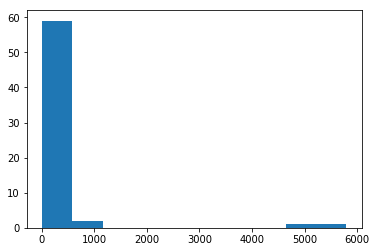

In [1868]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x20990115be0>,
 'caps': [<matplotlib.lines.Line2D at 0x209901222e8>,
 'boxes': [<matplotlib.lines.Line2D at 0x20990115a90>],
 'medians': [<matplotlib.lines.Line2D at 0x20990122978>],
 'fliers': [<matplotlib.lines.Line2D at 0x20990122cc0>],
 'means': []}

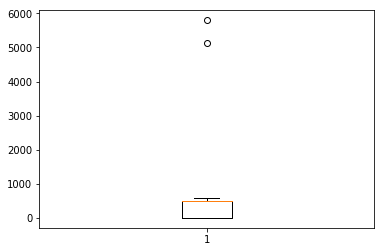

In [1869]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1870]:
BUILDING_MAINTENANCE_REPAIR_5_standard_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 100)]
BUILDING_MAINTENANCE_REPAIR_5_standard_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,28.00,77141.29,185966.16,12202.00,14202.00,14202.00,14202.00,604302.00
JNL,28.00,89.29,103.23,5.00,11.00,11.00,221.00,279.00
CHECK #,28.00,424542.39,2395.59,419234.00,424017.00,424500.00,426506.00,426587.00
JOURNAL AMOUNT,28.00,17.74,22.50,5.00,5.00,5.00,17.06,59.91
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,28.00,63840.27,38546.32,54.75,27509.05,59072.93,102743.69,102777.44
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,104805.15,nan,104805.15,104805.15,104805.15,104805.15,104805.15
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1871]:
BUILDING_MAINTENANCE_REPAIR_5_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 5_000) & (first_digit_checks['JOURNAL AMOUNT'] < 6_000)]
BUILDING_MAINTENANCE_REPAIR_5_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,2.00,308252.00,418677.93,12202.00,160227.00,308252.00,456277.00,604302.00
JNL,2.00,145.50,3.54,143.00,144.25,145.50,146.75,148.00
CHECK #,2.00,421187.50,570.64,420784.00,420985.75,421187.50,421389.25,421591.00
JOURNAL AMOUNT,2.00,5461.60,471.50,5128.20,5294.90,5461.60,5628.30,5795.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,2.00,17160.10,6956.51,12241.10,14700.60,17160.10,19619.59,22079.09
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1872]:
BUILDING_MAINTENANCE_REPAIR_5_standard_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 500) & (first_digit_checks['JOURNAL AMOUNT'] < 1_000)]
BUILDING_MAINTENANCE_REPAIR_5_standard_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,33.00,84056.55,196210.69,12102.00,12102.00,12202.00,12202.00,604302.00
JNL,33.00,164.76,132.09,5.00,68.00,121.00,249.00,474.00
CHECK #,33.00,422751.79,2462.07,419246.00,420250.00,422758.00,424855.00,427152.00
JOURNAL AMOUNT,33.00,520.01,28.83,500.00,500.00,510.00,519.86,597.34
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,33.00,29664.23,21602.23,516.48,12325.09,28388.86,46160.65,93277.15
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,1.00,69703.80,nan,69703.80,69703.80,69703.80,69703.80,69703.80
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


#### `first_digit` = 6

In [1873]:
dept = 'BUILDING MAINTENANCE & REPAIR'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '6'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
7580,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 2,173,2016-08-23,API,026321,20170277,171299,419416.00,NaN,600.00,nan,819.60,nan,nan,nan,6
7596,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 4,257,2016-10-20,API,028120,20170750,174523,420872.00,NaN,620.00,nan,16828.42,nan,nan,nan,6
7604,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 6,16,2016-12-01,API,001227,20170399,176760,422049.00,NaN,612.50,nan,27783.25,nan,nan,nan,6
7619,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 9,51,2017-03-01,API,001969,20171396,181352,424047.00,B,680.00,nan,43799.76,nan,nan,nan,6
9263,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,20,2016-09-01,API,025044,20170362,171603,419627.00,NaN,673.54,nan,6891.14,nan,nan,nan,6
9356,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 6,323,2016-12-22,API,018573,20171140,177922,422558.00,NaN,690.07,nan,26484.28,nan,nan,nan,6
9366,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 7,212,2017-01-18,API,028268,20170378,179173,423050.00,NaN,6.00,nan,30103.00,nan,nan,nan,6
9404,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 9,214,2017-03-13,API,002251,20171677,181887,424577.00,NaN,629.04,nan,39125.03,nan,nan,nan,6
9463,12202,01 -200-220-200-00-00-524500-,01,200,220,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/12,476,2017-06-28,API,028605,20171446,187734,427158.00,B,6500.00,nan,60464.11,nan,nan,nan,6
23222,14202,01 -400-420-200-00-00-524500-,01,400,420,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 2,180,2016-08-23,API,003511,20170191,171332,419362.00,NaN,60.00,nan,209.75,nan,nan,nan,6


In [1874]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     42.00
mean     618.17
std     1402.78
min        6.00
25%       60.00
50%       60.00
75%      619.51
max     6875.00
Name: JOURNAL AMOUNT, dtype: float64

In [1875]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

60.00      21
600.00      6
620.00      1
612.50      1
680.00      1
690.07      1
6.00        1
6500.00     1
618.04      1
6875.00     1
650.00      1
615.00      1
639.00      1
625.00      1
673.54      1
629.04      1
670.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([40.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.]),
 array([6.0000e+00, 6.9290e+02, 1.3798e+03, 2.0667e+03, 2.7536e+03,
        3.4405e+03, 4.1274e+03, 4.8143e+03, 5.5012e+03, 6.1881e+03,
        6.8750e+03]),
 <a list of 10 Patch objects>)

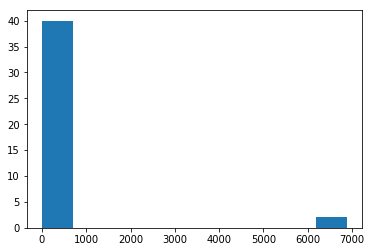

In [1876]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209901fd5c0>,
 'caps': [<matplotlib.lines.Line2D at 0x209901fdc88>,
 'boxes': [<matplotlib.lines.Line2D at 0x209901fd470>],
 'medians': [<matplotlib.lines.Line2D at 0x20990208358>],
 'fliers': [<matplotlib.lines.Line2D at 0x209902086a0>],
 'means': []}

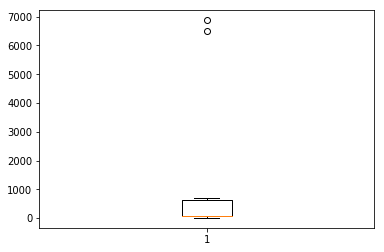

In [1877]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1878]:
BUILDING_MAINTENANCE_REPAIR_6_standard_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] < 100)]
BUILDING_MAINTENANCE_REPAIR_6_standard_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,22.00,14111.09,426.40,12202.00,14202.00,14202.00,14202.00,14202.00
JNL,22.00,239.95,116.10,8.00,188.00,253.00,316.25,405.00
CHECK #,22.00,423595.36,2200.51,419362.00,422336.75,423355.00,425506.00,426986.00
JOURNAL AMOUNT,22.00,57.55,11.51,6.00,60.00,60.00,60.00,60.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,22.00,50722.61,34008.23,209.75,30759.93,46917.39,79782.57,103780.44
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1879]:
BUILDING_MAINTENANCE_REPAIR_6_outliers = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 6_000) & (first_digit_checks['JOURNAL AMOUNT'] < 7_000)]
BUILDING_MAINTENANCE_REPAIR_6_outliers.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,2.00,13202.00,1414.21,12202.00,12702.00,13202.00,13702.00,14202.00
JNL,2.00,264.50,299.11,53.00,158.75,264.50,370.25,476.00
CHECK #,2.00,426134.50,1447.45,425111.00,425622.75,426134.50,426646.25,427158.00
JOURNAL AMOUNT,2.00,6687.50,265.17,6500.00,6593.75,6687.50,6781.25,6875.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,2.00,68630.04,11548.36,60464.11,64547.07,68630.04,72713.00,76795.96
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1880]:
BUILDING_MAINTENANCE_REPAIR_6_standard_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 600) & (first_digit_checks['JOURNAL AMOUNT'] < 1_000)]
BUILDING_MAINTENANCE_REPAIR_6_standard_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,18.00,210102.00,286823.90,12102.00,12202.00,14202.00,604302.00,604302.00
JNL,18.00,205.56,118.60,16.00,122.50,238.50,290.00,418.00
CHECK #,18.00,423417.33,2068.49,419416.00,422167.25,424181.50,424957.75,426139.00
JOURNAL AMOUNT,18.00,629.01,30.93,600.00,600.00,619.02,647.25,690.07
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,18.00,36818.14,19966.59,819.60,19242.38,41462.40,51715.82,64640.28
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


### `EDUCATIONAL INCENTIVE`

#### `first_digit` = 3

In [1881]:
dept = 'BUILDING MAINTENANCE & REPAIR'
dept_journal_amounts = expenditures[expenditures['ACCOUNT DESC'] == dept]
first_digit = '3'
first_digit_checks = dept_journal_amounts[dept_journal_amounts['FIRST_DIGIT'] == first_digit]
first_digit_checks

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
7586,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,203,2016-09-15,API,026539,20170500,172391,419862.00,NaN,3059.00,nan,8441.10,nan,nan,nan,3
7587,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 3,203,2016-09-15,API,026539,20170500,172392,419862.00,NaN,3059.00,nan,11500.10,nan,nan,nan,3
7592,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 4,56,2016-10-06,API,026539,20170500,173624,420416.00,NaN,3059.00,nan,15384.09,nan,nan,nan,3
7597,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 4,259,2016-10-20,API,026264,20170705,174526,420937.00,NaN,3609.00,nan,20437.42,nan,nan,nan,3
7599,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 5,62,2016-11-03,API,026539,20170500,175318,421262.00,NaN,3059.00,nan,23604.75,nan,nan,nan,3
7606,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 6,45,2016-12-05,API,026539,20170500,176795,422119.00,NaN,3059.00,nan,32067.25,nan,nan,nan,3
7609,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 6,162,2016-12-14,API,028530,20171188,177336,422398.00,NaN,30.52,nan,32706.10,nan,nan,nan,3
7611,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 7,103,2017-01-10,API,026539,20170500,178707,422854.00,NaN,3059.00,nan,35873.43,nan,nan,nan,3
7615,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 8,243,2017-02-13,API,026539,20170500,180248,423596.00,B,3059.00,nan,42197.43,nan,nan,nan,3
7618,12102,01 -200-210-200-00-00-524500-,01,200,210,200,00,00,524500,,BUILDING MAINTENANCE & REPAIR,17/ 8,422,2017-02-23,API,002738,20171456,180973,423860.00,B,314.00,nan,43119.76,nan,nan,nan,3


In [1882]:
first_digit_checks['JOURNAL AMOUNT'].describe()

count     37.00
mean    1197.07
std     1346.98
min       30.52
25%      315.00
50%      362.50
75%     3059.00
max     3609.00
Name: JOURNAL AMOUNT, dtype: float64

In [1883]:
first_digit_checks['JOURNAL AMOUNT'].value_counts()

3059.00    11
350.00      2
316.45      1
314.00      1
375.00      1
320.00      1
340.00      1
305.00      1
374.25      1
312.00      1
362.50      1
30.52       1
345.00      1
32.22       1
377.50      1
300.00      1
387.00      1
315.00      1
375.50      1
337.44      1
33.32       1
36.05       1
3609.00     1
347.88      1
31.08       1
366.00      1
Name: JOURNAL AMOUNT, dtype: int64

(array([25.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 11.,  1.]),
 array([  30.52 ,  388.368,  746.216, 1104.064, 1461.912, 1819.76 ,
        2177.608, 2535.456, 2893.304, 3251.152, 3609.   ]),
 <a list of 10 Patch objects>)

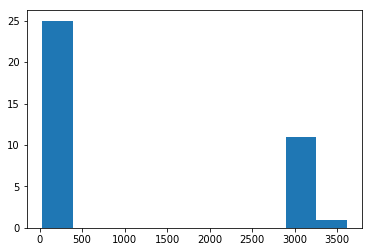

In [1884]:
plt.hist(first_digit_checks['JOURNAL AMOUNT'])

{'whiskers': [<matplotlib.lines.Line2D at 0x209902d8630>,
 'caps': [<matplotlib.lines.Line2D at 0x209902d8cc0>,
 'boxes': [<matplotlib.lines.Line2D at 0x209902d84e0>],
 'medians': [<matplotlib.lines.Line2D at 0x209902e2390>],
 'fliers': [<matplotlib.lines.Line2D at 0x209902e26d8>],
 'means': []}

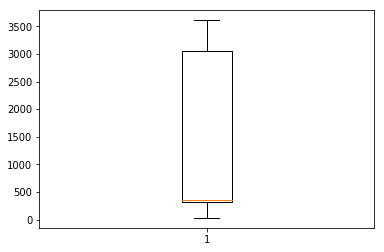

In [1885]:
plt.boxplot(first_digit_checks['JOURNAL AMOUNT'])

In [1886]:
EDUCATIONAL_INCENTIVE_3_standard_a = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] <= 40)]
EDUCATIONAL_INCENTIVE_3_standard_a.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,5.00,12582.00,906.64,12102.00,12202.00,12202.00,12202.00,14202.00
JNL,5.00,182.40,125.04,5.00,143.00,162.00,279.00,323.00
CHECK #,5.00,423691.60,2562.63,420745.00,422398.00,422544.00,426184.00,426587.00
JOURNAL AMOUNT,5.00,32.64,2.19,30.52,31.08,32.22,33.32,36.05
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,5.00,44823.36,35487.80,11837.11,24741.56,32706.10,52169.48,102662.53
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1887]:
EDUCATIONAL_INCENTIVE_3_standard_b = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 30) & (first_digit_checks['JOURNAL AMOUNT'] < 400)]
EDUCATIONAL_INCENTIVE_3_standard_b.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,25.00,84126.00,196051.09,12102.00,12202.00,14202.00,14202.00,604302.00
JNL,25.00,173.56,107.89,5.00,97.00,165.00,248.00,422.00
CHECK #,25.00,423650.52,2191.55,420118.00,422398.00,423531.00,425969.00,427014.00
JOURNAL AMOUNT,25.00,281.35,129.26,30.52,305.00,337.44,362.50,387.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,25.00,46177.98,34041.00,2030.90,24741.56,33209.52,58063.43,109215.94
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


In [1888]:
EDUCATIONAL_INCENTIVE_3_standard_c = first_digit_checks[(first_digit_checks['JOURNAL AMOUNT'] >= 3_000)]
EDUCATIONAL_INCENTIVE_3_standard_c.describe().T

,count,mean,std,min,25%,50%,75%,max
ORG,12.00,12102.00,0.00,12102.00,12102.00,12102.00,12102.00,12102.00
JNL,12.00,184.42,97.60,45.00,92.75,203.00,248.50,340.00
CHECK #,12.00,422821.83,2477.20,419862.00,420806.75,422486.50,424804.25,426990.00
JOURNAL AMOUNT,12.00,3104.83,158.77,3059.00,3059.00,3059.00,3059.00,3609.00
SOY BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan
NET LEDGER BALANCE,12.00,34359.83,18694.01,8441.10,19174.09,33970.34,50528.92,61989.08
ORIGINAL BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
REVISED BUDGET,0.00,nan,nan,nan,nan,nan,nan,nan
NET BUDGET BALANCE,0.00,nan,nan,nan,nan,nan,nan,nan


## Merge all Benford's Law Outliers

In [1889]:
benfords_law_outliers = pd.concat([CLASSROOM_TEACHERS_3_outliers,
                                  CLASSROOM_TEACHERS_4_outliers,
                                  CLASSROOM_TEACHERS_5_outliers,
                                  CLASSROOM_TEACHERS_6_outliers_a,
                                  CLASSROOM_TEACHERS_6_outliers_b,
                                  CLASSROOM_TEACHERS_7_outliers,
                                  ADDITIONAL_DIFFERENTIAL_3_outliers_a,
                                  ADDITIONAL_DIFFERENTIAL_3_outliers_b,
                                  OFFICE_SUPPLIES_5_outliers_a,
                                  OFFICE_SUPPLIES_5_outliers_b,
                                  OFFICE_SUPPLIES_6_outliers,
                                  OFFICE_SUPPLIES_7_outliers,
                                  TUITION_TO_NON_PUBLIC_SCHOOLS_5_outliers,
                                  TUITION_TO_NON_PUBLIC_SCHOOLS_6_outliers,
                                  TUITION_TO_NON_PUBLIC_SCHOOLS_7_outliers,
                                  TUITION_TO_NON_PUBLIC_SCHOOLS_8_outliers,
                                  TUITION_TO_NON_PUBLIC_SCHOOLS_9_outliers,
                                  TAX_TITLE_7_outliers,
                                  BUILDING_SECRETARIES_4_outliers_a,
                                  BUILDING_SECRETARIES_4_outliers_b,
                                  BUILDING_SECRETARIES_8_outliers,
                                  BUILDING_SECRETARIES_9_outliers_a,
                                  BUILDING_SECRETARIES_9_outliers_b,
                                  BUILDING_SECRETARIES_9_outliers_c,
                                  ATHLETIC_SUPPLIES_MATS_5_outliers,
                                  ATHLETIC_SUPPLIES_MATS_7_outliers_a,
                                  ATHLETIC_SUPPLIES_MATS_7_outliers_b,
                                  ATHLETIC_SUPPLIES_MATS_8_outliers_a,
                                  ATHLETIC_SUPPLIES_MATS_8_outliers_b,
                                  TUITION_TO_MASS_SCHOOLS_4_outliers_a,
                                  TUITION_TO_MASS_SCHOOLS_4_outliers_b,
                                  TUITION_TO_MASS_SCHOOLS_5_outliers,
                                  TUITION_TO_MASS_SCHOOLS_6_outliers_a,
                                  TUITION_TO_MASS_SCHOOLS_6_outliers_b,
                                  SPED_OUTSIDE_TRANSPORTATION_2_outliers,
                                  SPED_OUTSIDE_TRANSPORTATION_3_outliers,
                                  ASSISTANT_PRINCIPALS_2_outliers,
                                  ASSISTANT_PRINCIPALS_4_outliers])

In [1890]:
benfords_law_outliers['JOURNAL AMOUNT'].sum()

9139165.639999999

# PART 4: Prepare data for DBSCAN Model

## Filter for large accounts

In [1891]:
num_of_exp_by_account_desc = expenditures['ACCOUNT DESC'].value_counts()
num_of_exp_by_account_desc

PERMANENT SALARIES                2671
EDUCATIONAL INCENTIVE             1106
REVOLVING ACCOUNT EXPENSES        1024
CLASSROOM TEACHERS                1003
PURCHASE OF SERVICES               957
ADDITIONAL DIFFERENTIAL            859
OFFICE SUPPLIES                    777
TUITION TO NON PUBLIC SCHOOLS      702
MAINTENANCE OF BUILDINGS           617
BUILDING SECRETARIES               583
PRINCIPALS                         583
BUILDING MAINTENANCE & REPAIR      548
TAX TITLE                          544
TUITION TO MASS SCHOOLS            541
ATHLETIC SUPPLIES & MATS           531
SPED OUTSIDE TRANSPORTATION        525
ASSISTANT PRINCIPALS               505
INSTRUCTIONAL MATERIALS            504
SPED 504 SERVICES                  498
SUBSTITUTES                        477
SOCIAL WORKERS                     405
MEDICAL EXPENSES                   378
BUILDING TECHNOLOGISTS             370
SPECIALIST TEACHERS                358
MAINTENANCE OF EQUIPMENT           357
TUITION TO COLLABORATIVES

In [1892]:
mask = num_of_exp_by_account_desc >= 500
num_of_exp_by_account_desc[mask]

PERMANENT SALARIES               2671
EDUCATIONAL INCENTIVE            1106
REVOLVING ACCOUNT EXPENSES       1024
CLASSROOM TEACHERS               1003
PURCHASE OF SERVICES              957
ADDITIONAL DIFFERENTIAL           859
OFFICE SUPPLIES                   777
TUITION TO NON PUBLIC SCHOOLS     702
MAINTENANCE OF BUILDINGS          617
BUILDING SECRETARIES              583
PRINCIPALS                        583
BUILDING MAINTENANCE & REPAIR     548
TAX TITLE                         544
TUITION TO MASS SCHOOLS           541
ATHLETIC SUPPLIES & MATS          531
SPED OUTSIDE TRANSPORTATION       525
ASSISTANT PRINCIPALS              505
INSTRUCTIONAL MATERIALS           504
Name: ACCOUNT DESC, dtype: int64

In [1893]:
large_accounts = (expenditures['ACCOUNT DESC'].value_counts() >= 500).index[:18].tolist()

In [1894]:
mask = expenditures['ACCOUNT DESC'].isin(large_accounts)
large_depts =expenditures[mask]

In [1895]:
expenditures_model = large_depts

##  Change `seg3` and `seg7` to integers.

In [1896]:
expenditures_model = large_depts.astype({"seg3": int, "seg7": int})

## pd.get_dummies `ACCOUNT DESC`

In [1897]:
expenditures_model = pd.get_dummies(expenditures_model, columns=['ACCOUNT DESC', 'seg3', 'seg7'], drop_first=True)

# Define features

In [1898]:
col_list = list(expenditures_model.columns)
features = [col for col in col_list if col not in ['FIRST_DIGIT', 'ORG', 'ACCOUNT', 'seg1', 'seg2', 'seg4', 'seg5', 'seg6', 'seg8', 'YR/PR', 'JNL', 'EFF DATE', 'SRC', 'REF1',
                 'REF2', 'REF3', 'CHECK #', 'OB', 'SOY BALANCE', 'NET LEDGER BALANCE', 'ORIGINAL BUDGET', 'REVISED BUDGET',
                  'NET BUDGET BALANCE']]
X = expenditures_model[features]

In [1899]:
X.columns

Index(['JOURNAL AMOUNT', 'ACCOUNT DESC_ASSISTANT PRINCIPALS',
       'ACCOUNT DESC_ATHLETIC SUPPLIES & MATS',
       'ACCOUNT DESC_BUILDING MAINTENANCE & REPAIR',
       'ACCOUNT DESC_BUILDING SECRETARIES', 'ACCOUNT DESC_CLASSROOM TEACHERS',
       'ACCOUNT DESC_EDUCATIONAL INCENTIVE',
       'ACCOUNT DESC_INSTRUCTIONAL MATERIALS',
       'ACCOUNT DESC_MAINTENANCE OF BUILDINGS', 'ACCOUNT DESC_OFFICE SUPPLIES',
       'ACCOUNT DESC_PERMANENT SALARIES', 'ACCOUNT DESC_PRINCIPALS',
       'ACCOUNT DESC_PURCHASE OF SERVICES',
       'ACCOUNT DESC_REVOLVING ACCOUNT EXPENSES',
       'ACCOUNT DESC_SPED OUTSIDE TRANSPORTATION', 'ACCOUNT DESC_TAX TITLE',
       'ACCOUNT DESC_TUITION TO MASS SCHOOLS',
       'ACCOUNT DESC_TUITION TO NON PUBLIC SCHOOLS', 'seg3_111', 'seg3_121',
       'seg3_122', 'seg3_125', 'seg3_127', 'seg3_135', 'seg3_138', 'seg3_140',
       'seg3_141', 'seg3_145', 'seg3_151', 'seg3_161', 'seg3_162', 'seg3_165',
       'seg3_171', 'seg3_176', 'seg3_181', 'seg3_182', 'seg3_184

# Standardize features

In [1900]:
ss = StandardScaler()
X_scaled = ss.fit_transform(X)

# DBSCAN

In [1901]:
dbscan = DBSCAN(min_samples=10, eps=1)
dbscan.fit(X_scaled)

DBSCAN(algorithm='auto', eps=1, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=10, n_jobs=1, p=None)

In [1902]:
large_depts['dbscanclusters'] = dbscan.labels_
large_depts.head()

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT,dbscanclusters
49,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 2,221,2016-08-26,PRJ,SCHOOL,1170838,1170838,nan,NaN,46225.91,nan,46225.91,nan,2516367.78,nan,4,0
50,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,206,2016-09-02,PRJ,SCHOOL,117901,117901,nan,NaN,45737.99,nan,91963.90,nan,nan,nan,4,0
51,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,317,2016-09-16,PRJ,SCHOOL,1170918,1170918,nan,NaN,45737.99,nan,137701.89,nan,nan,nan,4,0
52,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,348,2016-09-09,PRJ,SCHOOL,1170911,1170911,nan,NaN,45737.99,nan,183439.88,nan,nan,nan,4,0
54,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/ 3,437,2016-09-23,PRJ,SCHOOL,1170925,1170925,nan,NaN,45737.99,nan,227643.39,nan,nan,nan,4,0


In [1903]:
set(dbscan.labels_)

{-1,
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131}

In [1904]:
silhouette_score(X_scaled, dbscan.labels_)

0.96458050424199

# Explore clusters

In [1905]:
pd.options.display.float_format = '{:.2f}'.format

In [1906]:
large_depts.groupby(['seg7', 'dbscanclusters'])['seg3'].count()

seg7    dbscanclusters
510100  -1                 11
         5                 13
         8                108
         10                12
         11                53
         13                45
         14                53
         18                54
         22                56
         25                53
         29                54
         34                66
         38               112
         41                72
         45                12
         47                13
         48                14
         49               225
         50                67
         52                54
         54               195
         59               123
         63                23
         65               106
         69                45
         82                57
         87               336
         91                53
         93                39
         94                41
         95                56
         98                54
         102     

In [1907]:
(large_depts['dbscanclusters'] == -1).value_counts()

False    14457
True       123
Name: dbscanclusters, dtype: int64

In [1908]:
mask = (large_depts['dbscanclusters'] == -1)
dbscan_outliers = large_depts[mask]
dbscan_outliers['ACCOUNT DESC'].value_counts()

PURCHASE OF SERVICES             40
REVOLVING ACCOUNT EXPENSES       34
OFFICE SUPPLIES                  18
CLASSROOM TEACHERS               12
PERMANENT SALARIES               11
BUILDING MAINTENANCE & REPAIR     5
EDUCATIONAL INCENTIVE             2
ASSISTANT PRINCIPALS              1
Name: ACCOUNT DESC, dtype: int64

In [1909]:
benfords_law_outliers['ACCOUNT DESC'].value_counts()

ADDITIONAL DIFFERENTIAL          245
CLASSROOM TEACHERS               175
BUILDING SECRETARIES             140
OFFICE SUPPLIES                  121
TUITION TO MASS SCHOOLS           71
ASSISTANT PRINCIPALS              54
SPED OUTSIDE TRANSPORTATION       13
TUITION TO NON PUBLIC SCHOOLS     13
ATHLETIC SUPPLIES & MATS           8
TAX TITLE                          1
Name: ACCOUNT DESC, dtype: int64

## SUMMARY
#### More outliers were detected through analysis by Benford's Law. However, some overlap exists in departments between DBSCAN and Benford's Law, with DBSCAN model not detecting some outliers found in departments through Benford's Law.

# `CLASSROOM TEACHERS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [1910]:
CLASSROOM_TEACHERS_benford = benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('CLASSROOM TEACHERS')]

In [1911]:
CLASSROOM_TEACHERS_benford.shape

(175, 27)

In [1912]:
CLASSROOM_TEACHERS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('CLASSROOM TEACHERS')]
CLASSROOM_TEACHERS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
CLASSROOM_TEACHERS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
95,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
537,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,438073.17,nan,2906043.82,nan,nan,nan,4


In [1913]:
CLASSROOM_TEACHERS_converged_outliers = pd.concat([CLASSROOM_TEACHERS_benford,
                                                  CLASSROOM_TEACHERS_dbscan])

In [1914]:
CLASSROOM_TEACHERS_converged_outliers.shape

(187, 27)

In [1915]:
CLASSROOM_TEACHERS_converged_outliers = CLASSROOM_TEACHERS_converged_outliers[CLASSROOM_TEACHERS_converged_outliers.duplicated()]
CLASSROOM_TEACHERS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
95,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
537,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,438073.17,nan,2906043.82,nan,nan,nan,4
889,321101,01 -000-300-001-69-00-523051-,01,000,300,001,69,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,414489.44,nan,2731575.55,nan,nan,nan,4
16402,320201,01 -300-320-100-19-02-523051-,01,300,320,100,19,02,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,471233.23,nan,3137834.47,nan,nan,nan,4
16448,320301,01 -300-320-100-19-03-523051-,01,300,320,100,19,03,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,336887.83,nan,2255033.75,nan,nan,nan,3
16495,320401,01 -300-320-100-19-04-523051-,01,300,320,100,19,04,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,380855.47,nan,2465618.09,nan,nan,nan,3
16585,320601,01 -300-320-100-19-06-523051-,01,300,320,100,19,06,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,467018.04,nan,3098598.80,nan,nan,nan,4


In [1916]:
CLASSROOM_TEACHERS_converged_outliers.shape

(7, 27)

### Summary
#### 7 common outliers found between DBSCAN and Benford's Law

### Look for overlaps in expense amounts with `FIRST_DIGIT` = 3

In [1917]:
CLASSROOM_TEACHERS_dbscan_benford_3 = pd.concat([CLASSROOM_TEACHERS_3_outliers,
                                                  CLASSROOM_TEACHERS_dbscan])
CLASSROOM_TEACHERS_converged_3_outliers = CLASSROOM_TEACHERS_dbscan_benford_3[CLASSROOM_TEACHERS_dbscan_benford_3.duplicated()]
CLASSROOM_TEACHERS_converged_3_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
95,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
16448,320301,01 -300-320-100-19-03-523051-,01,300,320,100,19,03,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,336887.83,nan,2255033.75,nan,nan,nan,3
16495,320401,01 -300-320-100-19-04-523051-,01,300,320,100,19,04,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,380855.47,nan,2465618.09,nan,nan,nan,3


In [1918]:
CLASSROOM_TEACHERS_3_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
95,321001,01 -000-300-001-00-00-523051-,01,000,300,001,00,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,366789.08,nan,2388549.67,nan,nan,nan,3
16448,320301,01 -300-320-100-19-03-523051-,01,300,320,100,19,03,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,336887.83,nan,2255033.75,nan,nan,nan,3
16495,320401,01 -300-320-100-19-04-523051-,01,300,320,100,19,04,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,380855.47,nan,2465618.09,nan,nan,nan,3


### Look for overlaps in expense amounts with `FIRST_DIGIT` = 4

In [1919]:
CLASSROOM_TEACHERS_dbscan_benford_4 = pd.concat([CLASSROOM_TEACHERS_4_outliers,
                                                  CLASSROOM_TEACHERS_dbscan])
CLASSROOM_TEACHERS_converged_4_outliers = CLASSROOM_TEACHERS_dbscan_benford_4[CLASSROOM_TEACHERS_dbscan_benford_4.duplicated()]
CLASSROOM_TEACHERS_converged_4_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
537,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,438073.17,nan,2906043.82,nan,nan,nan,4
889,321101,01 -000-300-001-69-00-523051-,01,000,300,001,69,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,414489.44,nan,2731575.55,nan,nan,nan,4
16402,320201,01 -300-320-100-19-02-523051-,01,300,320,100,19,02,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,471233.23,nan,3137834.47,nan,nan,nan,4
16585,320601,01 -300-320-100-19-06-523051-,01,300,320,100,19,06,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,467018.04,nan,3098598.80,nan,nan,nan,4


In [1920]:
CLASSROOM_TEACHERS_4_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
537,321201,01 -000-300-001-39-00-523051-,01,000,300,001,39,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,438073.17,nan,2906043.82,nan,nan,nan,4
889,321101,01 -000-300-001-69-00-523051-,01,000,300,001,69,00,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,414489.44,nan,2731575.55,nan,nan,nan,4
16402,320201,01 -300-320-100-19-02-523051-,01,300,320,100,19,02,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,471233.23,nan,3137834.47,nan,nan,nan,4
16585,320601,01 -300-320-100-19-06-523051-,01,300,320,100,19,06,523051,,CLASSROOM TEACHERS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,467018.04,nan,3098598.80,nan,nan,nan,4


# `CLASSROOM TEACHERS`
## `JOURNAL AMOUNT` Statistics

In [1921]:
mask = expenditures['ACCOUNT DESC'] == 'CLASSROOM TEACHERS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,1003.00
mean,36869.34
std,60326.05
min,689.47
25%,7518.82
50%,18992.82
75%,47916.03
max,1201879.59


Text(0.5, 0, 'JOURNAL AMOUNT')

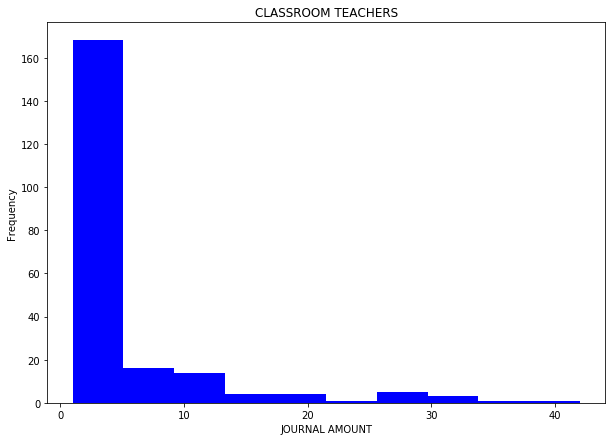

In [1922]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('CLASSROOM TEACHERS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `OFFICE SUPPLIES`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [1923]:
OFFICE_SUPPLIES_benford = benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('OFFICE SUPPLIES')]

In [1924]:
OFFICE_SUPPLIES_benford.shape

(121, 27)

In [1925]:
OFFICE_SUPPLIES_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('OFFICE SUPPLIES')]
OFFICE_SUPPLIES_dbscan.drop(columns=['dbscanclusters'], inplace=True)
OFFICE_SUPPLIES_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
6006,11764,01 -100-176-400-00-00-540000-,01,100,176,400,00,00,540000,,OFFICE SUPPLIES,17/11,245,2017-05-16,API,005754,20172077,185379,426240.00,NaN,679.96,nan,679.96,nan,720.00,nan,6
24632,15244,01 -500-524-400-00-00-540000-,01,500,524,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,321,2016-11-29,API,005754,20170795,176581,422110.00,NaN,76.69,nan,76.69,nan,1315.83,nan,7


In [1926]:
OFFICE_SUPPLIES_converged_outliers = pd.concat([OFFICE_SUPPLIES_benford,
                                               OFFICE_SUPPLIES_dbscan])

In [1927]:
OFFICE_SUPPLIES_converged_outliers.shape

(139, 27)

In [1928]:
OFFICE_SUPPLIES_converged_outliers = OFFICE_SUPPLIES_converged_outliers[OFFICE_SUPPLIES_converged_outliers.duplicated()]
OFFICE_SUPPLIES_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
24678,15254,01 -500-525-400-00-00-540000-,01,500,525,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,26,2017-02-01,API,005754,20170938,179855,423511.00,NaN,65.14,nan,65.14,nan,1388.88,nan,6
24680,15254,01 -500-525-400-00-00-540000-,01,500,525,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,26,2017-02-01,API,005754,20170938,179857,423511.00,NaN,539.21,nan,628.22,nan,nan,nan,5
25591,16104,01 -600-610-400-00-00-540000-,01,600,610,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,54,2016-10-06,API,005754,20170471,173593,420600.00,NaN,544.07,nan,869.81,nan,nan,nan,5


In [1929]:
OFFICE_SUPPLIES_converged_outliers.shape

(3, 27)

### Summary
#### 3 common outliers found between DBSCAN model and Benford's Law

### Look for overlaps in expense amounts with `FIRST_DIGIT` = 5

In [1930]:
OFFICE_SUPPLIES_dbscan_benford_5 = pd.concat([OFFICE_SUPPLIES_5_outliers_a,
                                              OFFICE_SUPPLIES_5_outliers_b,
                                             OFFICE_SUPPLIES_dbscan])
OFFICE_SUPPLIES_converged_5_outliers = OFFICE_SUPPLIES_dbscan_benford_5[OFFICE_SUPPLIES_dbscan_benford_5.duplicated()]
OFFICE_SUPPLIES_converged_5_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
24680,15254,01 -500-525-400-00-00-540000-,01,500,525,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,26,2017-02-01,API,005754,20170938,179857,423511.00,NaN,539.21,nan,628.22,nan,nan,nan,5
25591,16104,01 -600-610-400-00-00-540000-,01,600,610,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,54,2016-10-06,API,005754,20170471,173593,420600.00,NaN,544.07,nan,869.81,nan,nan,nan,5


In [1931]:
OFFICE_SUPPLIES_5_outliers_a

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1589,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,209,2017-01-18,API,002632,20170307,179104,423145.00,NaN,5.18,nan,6501.10,nan,nan,nan,5
1624,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/12,362,2017-06-22,API,028310,20172515,187526,427026.00,NaN,57.63,nan,12438.69,nan,nan,nan,5
3181,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/12,364,2017-06-22,API,001161,20172572,187529,427073.00,NaN,50.00,nan,1148.04,nan,nan,nan,5
3628,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,102,2016-08-17,API,002632,20170015,170956,419309.00,NaN,5.18,nan,382.18,nan,nan,nan,5
3631,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,253,2016-10-20,API,002632,20170015,174483,420981.00,NaN,5.18,nan,405.49,nan,nan,nan,5
3632,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,192,2016-11-15,API,002632,20170015,175946,421743.00,NaN,5.18,nan,410.67,nan,nan,nan,5
3633,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,99,2016-12-07,API,002632,20170015,176961,422234.00,NaN,5.18,nan,415.85,nan,nan,nan,5
3635,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,244,2017-01-19,API,005754,20171380,179255,423194.00,NaN,52.10,nan,617.95,nan,nan,nan,5
3637,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,387,2017-02-22,API,002632,20170015,180731,423903.00,NaN,5.18,nan,625.72,nan,nan,nan,5
3638,11414,01 -100-141-400-00-00-540000-,01,100,141,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,297,2017-03-20,API,002632,20170015,182325,424781.00,NaN,5.18,nan,630.90,nan,nan,nan,5


In [1932]:
OFFICE_SUPPLIES_5_outliers_b

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1590,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,217,2017-01-18,API,007017,20171391,179161,423125.00,NaN,542.00,nan,7043.10,nan,nan,nan,5
2834,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,301,2016-09-21,API,001370,20170672,172638,420079.00,NaN,550.00,nan,3395.87,nan,nan,nan,5
2844,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,321,2016-11-29,API,028486,NaN,176587,422086.00,B,500.47,nan,6717.15,nan,nan,nan,5
2850,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 7,57,2017-01-05,API,028486,20170945,178456,422832.00,B,505.03,nan,8800.90,nan,nan,nan,5
2860,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,61,2017-03-01,API,028710,20171734,181140,424019.00,B,511.60,nan,11335.77,nan,nan,nan,5
2865,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,214,2017-03-13,API,028710,20171734,181882,424505.00,B,511.60,nan,13085.57,nan,nan,nan,5
2866,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,344,2017-03-23,API,028710,20171734,182509,424656.00,B,511.60,nan,13597.17,nan,nan,nan,5
2867,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 9,447,2017-03-28,API,028710,20171734,182954,424836.00,B,511.60,nan,14108.77,nan,nan,nan,5
2868,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/10,48,2017-04-04,API,028710,20171734,183198,425021.00,B,511.60,nan,14620.37,nan,nan,nan,5
2869,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/10,71,2017-04-06,API,028710,20171734,183374,425021.00,B,511.60,nan,15131.97,nan,nan,nan,5


### Look for overlaps in expense amounts with `FIRST_DIGIT` = 6

In [1933]:
OFFICE_SUPPLIES_dbscan_benford_6 = pd.concat([OFFICE_SUPPLIES_6_outliers,
                                             OFFICE_SUPPLIES_dbscan])
OFFICE_SUPPLIES_converged_6_outliers = OFFICE_SUPPLIES_dbscan_benford_6[OFFICE_SUPPLIES_dbscan_benford_6.duplicated()]
OFFICE_SUPPLIES_converged_6_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
24678,15254,01 -500-525-400-00-00-540000-,01,500,525,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,26,2017-02-01,API,005754,20170938,179855,423511.00,NaN,65.14,nan,65.14,nan,1388.88,nan,6


In [1934]:
OFFICE_SUPPLIES_6_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
1556,11214,01 -100-121-400-00-00-540000-,01,100,121,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,64,2016-09-07,API,028318,20170467,171906,nan,NaN,64.59,nan,1168.01,nan,nan,nan,6
2831,11354,01 -100-135-400-00-00-540000-,01,100,135,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,68,2016-09-07,API,003001,20170027,171918,419790.00,NaN,60.00,nan,2737.73,nan,nan,nan,6
3170,11384,01 -100-138-400-00-00-540000-,01,100,138,400,00,00,540000,,OFFICE SUPPLIES,17/10,48,2017-04-04,API,019499,20171931,183212,425182.00,NaN,62.00,nan,331.95,nan,nan,nan,6
3943,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/ 2,101,2016-08-16,API,003001,20170149,170935,419302.00,NaN,60.00,nan,13526.05,nan,nan,nan,6
4045,11454,01 -100-145-400-00-00-540000-,01,100,145,400,00,00,540000,,OFFICE SUPPLIES,17/10,168,2017-04-13,API,004311,20171120,183715,425261.00,NaN,6.09,nan,44686.71,nan,nan,nan,6
5904,11624,01 -100-162-400-00-00-540000-,01,100,162,400,00,00,540000,,OFFICE SUPPLIES,17/ 5,222,2016-11-17,API,025361,20170939,176044,421778.00,NaN,60.00,nan,1531.99,nan,nan,nan,6
7783,12104,01 -200-210-400-00-00-540000-,01,200,210,400,00,00,540000,,OFFICE SUPPLIES,17/ 4,95,2016-10-11,API,025944,20170620,173795,420838.00,NaN,69.00,nan,1714.71,nan,nan,nan,6
7791,12104,01 -200-210-400-00-00-540000-,01,200,210,400,00,00,540000,,OFFICE SUPPLIES,17/ 6,183,2016-12-15,API,005754,20171151,177390,422433.00,NaN,66.32,nan,3151.67,nan,nan,nan,6
23738,14204,01 -400-420-400-00-00-540000-,01,400,420,400,00,00,540000,,OFFICE SUPPLIES,17/ 3,190,2016-09-14,API,010668,20170102,172280,419933.00,NaN,60.00,nan,5513.32,nan,nan,nan,6
24678,15254,01 -500-525-400-00-00-540000-,01,500,525,400,00,00,540000,,OFFICE SUPPLIES,17/ 8,26,2017-02-01,API,005754,20170938,179855,423511.00,NaN,65.14,nan,65.14,nan,1388.88,nan,6


### Summary
#### Depending on distribution, outliers found by DBSCAN do not seem like sole outliers.

# `OFFICE SUPPLIES`
## `JOURNAL AMOUNT` Statistics

In [1935]:
mask = expenditures['ACCOUNT DESC'] == 'OFFICE SUPPLIES'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,777.00
mean,381.56
std,794.01
min,1.25
25%,49.98
50%,195.00
75%,584.13
max,13054.92


Text(0.5, 0, 'JOURNAL AMOUNT')

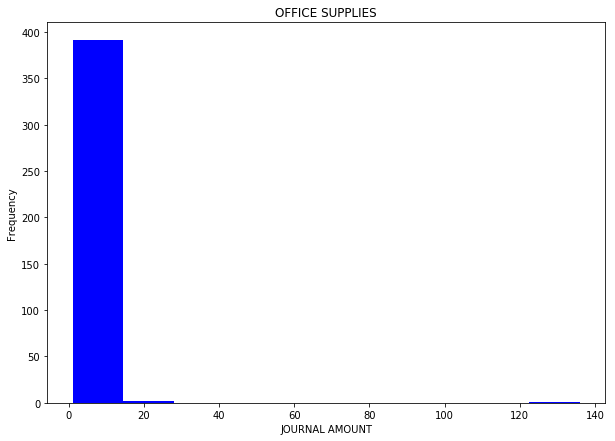

In [1936]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('OFFICE SUPPLIES', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)

# `ASSISTANT PRINCIPALS`
## Common outliers found between Benford's Law and DBSCAN cluster class `-1`

In [1937]:
ASSISTANT_PRINCIPALS_benford = benfords_law_outliers[benfords_law_outliers['ACCOUNT DESC'] == ('ASSISTANT PRINCIPALS')]

In [1938]:
ASSISTANT_PRINCIPALS_benford.shape

(54, 27)

In [1939]:
ASSISTANT_PRINCIPALS_dbscan = dbscan_outliers[dbscan_outliers['ACCOUNT DESC'] == ('ASSISTANT PRINCIPALS')]
ASSISTANT_PRINCIPALS_dbscan.drop(columns=['dbscanclusters'], inplace=True)
ASSISTANT_PRINCIPALS_dbscan.head(2)

C:\Users\Michelle\Anaconda3\envs\dsi\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT
15120,320708,01 -300-320-000-08-07-522111-,01,300,320,000,08,07,522111,,ASSISTANT PRINCIPALS,17/12,459,2017-06-21,PRJ,170610,1170610,1170610,nan,NaN,63732.59,nan,515150.19,nan,nan,nan,6


In [1940]:
ASSISTANT_PRINCIPALS_converged_outliers = pd.concat([ASSISTANT_PRINCIPALS_benford,
                                                    ASSISTANT_PRINCIPALS_dbscan])

In [1941]:
ASSISTANT_PRINCIPALS_converged_outliers.shape

(55, 27)

In [1942]:
ASSISTANT_PRINCIPALS_converged_outliers = ASSISTANT_PRINCIPALS_converged_outliers[ASSISTANT_PRINCIPALS_converged_outliers.duplicated()]
ASSISTANT_PRINCIPALS_converged_outliers

,ORG,ACCOUNT,seg1,seg2,seg3,seg4,seg5,seg6,seg7,seg8,ACCOUNT DESC,YR/PR,JNL,EFF DATE,SRC,REF1,REF2,REF3,CHECK #,OB,JOURNAL AMOUNT,SOY BALANCE,NET LEDGER BALANCE,ORIGINAL BUDGET,REVISED BUDGET,NET BUDGET BALANCE,FIRST_DIGIT


### Summary
#### No common outliers found between DBSCAN and Benford's Law

# `ASSISTANT PRINCIPALS`
## `JOURNAL AMOUNT` Statistics

In [1943]:
mask = expenditures['ACCOUNT DESC'] == 'ASSISTANT PRINCIPALS'
expenditures[mask][['JOURNAL AMOUNT']].describe()

,JOURNAL AMOUNT
count,505.00
mean,3771.52
std,4426.15
min,2008.13
25%,2021.83
50%,2042.96
75%,4096.96
max,63732.59


Text(0.5, 0, 'JOURNAL AMOUNT')

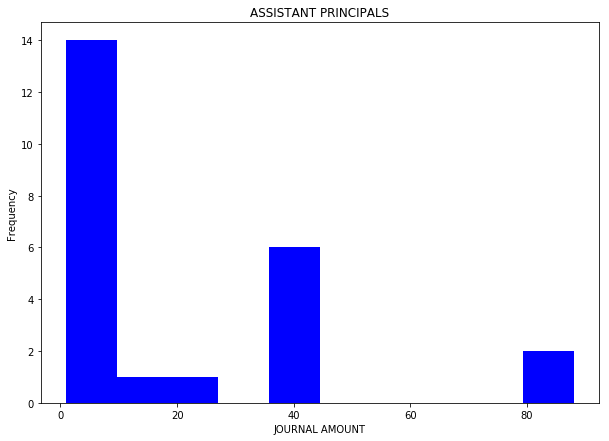

In [1944]:
plt.figure(figsize=(10,7))
expenditures[mask]['JOURNAL AMOUNT'].value_counts().plot(kind='hist', color='b')

plt.title('ASSISTANT PRINCIPALS', fontsize=12)
plt.ylabel('Frequency', fontsize=10)
plt.xlabel('JOURNAL AMOUNT', fontsize=10)